# IBM HR Analytics Employee Attrition & Performance
### Predict attrition of your valuable employees
##### DATASET of pavansubhash
###### Kaggle Link: https://www.kaggle.com/pavansubhasht/ibm-hr-analytics-attrition-dataset

#### Project by: Angelin, Pratham, Krishna DS2

In [1]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
sb.set()

### Part 1: Data Cleaning <br>
Angelin:

In [2]:
employee= pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')
employee.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [3]:
employee.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

There are 26 columns with integer variables and 9 with categorical variables. <br>
However some of the variables classified as integer, we decide would be better to take as categorical. <br>
For example, RelationshipSatisfaction has integer values but these values (1,2,3,4) refers to a certain category.

In [4]:
employee.isnull().any()

Age                         False
Attrition                   False
BusinessTravel              False
DailyRate                   False
Department                  False
DistanceFromHome            False
Education                   False
EducationField              False
EmployeeCount               False
EmployeeNumber              False
EnvironmentSatisfaction     False
Gender                      False
HourlyRate                  False
JobInvolvement              False
JobLevel                    False
JobRole                     False
JobSatisfaction             False
MaritalStatus               False
MonthlyIncome               False
MonthlyRate                 False
NumCompaniesWorked          False
Over18                      False
OverTime                    False
PercentSalaryHike           False
PerformanceRating           False
RelationshipSatisfaction    False
StandardHours               False
StockOptionLevel            False
TotalWorkingYears           False
TrainingTimesL

There are no missing values.

In [5]:
employee["Attrition"].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

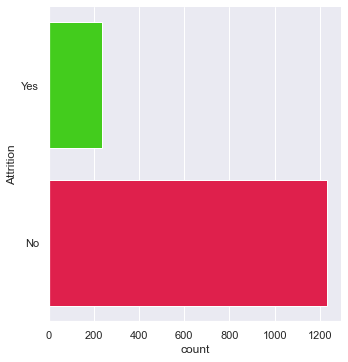

In [6]:
sb.catplot(y="Attrition", data=employee, kind="count", palette= "prism")

The dataset is **imbalanced**, hence we need to balance it before we do our decision tree.

In [7]:
employee["StandardHours"].nunique()

1

In [8]:
employee["EmployeeCount"].nunique()

1

As we have found that all employees have the same StandardHours and EmployeeCount, we decided to drop these columns. <br>
All employees are working full-time and they have a standard hour of 80 and employee count of 1.

##### What does 80 standard hours mean?
According to https://careertrend.com/13374913/pros-cons-of-a-980-work-schedule, <br>
it is also called a 9/80 work schedule. Here, employees work for 80 hours over a period of 9 days. <br>
Different companies may schedule working days differently, however most commonly employees will work four 9h days each week with an alternating 8h Friday and free Friday. <br>

##### What does employee count of 1 mean?
Employee count is also known as headcount. It is the number of employees working in the company, where each employee is counted as 1. 

In [9]:
del employee["StandardHours"]

In [10]:
del employee["EmployeeCount"]

In [11]:
employee["Over18"].nunique()

1

In [12]:
eighteen= employee.loc[employee["Age"]==18]
print(eighteen.shape)

(8, 33)


According to the column Over18, everyone is over 18 years old. <br>
However, after we tried to confirm this with the Age column, we found that there are **8 employees who are exactly 18** years old. <br>
Therefore, the column Over18 represents whether employees are *more than or equal* to 18 years old. <br>
We decided to **change** this column, so that it is strictly Over18. <br>
We changed all the employees who are aged 18 to have a record of "N" in their Over18 column.

In [13]:
for var in [296, 301, 457, 727, 828, 972, 1153, 1311]:
    employee.at[var, "Over18"]= "N"

In [14]:
employee["Over18"].value_counts()

Y    1462
N       8
Name: Over18, dtype: int64

#### Numeric Variables as a dataframe

In [15]:
num_data=pd.DataFrame(employee.select_dtypes(include=['int64']))
num_data.head()

,Age,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,1,2,1,2,94,3,2,4,...,3,1,0,8,0,1,6,4,0,5
1,49,279,8,1,2,3,61,2,2,2,...,4,4,1,10,3,3,10,7,1,7
2,37,1373,2,2,4,4,92,2,1,3,...,3,2,0,7,3,3,0,0,0,0
3,33,1392,3,4,5,4,56,3,1,3,...,3,3,0,8,3,3,8,7,3,0
4,27,591,2,1,7,1,40,3,1,2,...,3,4,1,6,3,3,2,2,2,2


In [16]:
num_data=num_data.drop(columns=["StockOptionLevel","JobInvolvement","EnvironmentSatisfaction",
                                "Education","JobLevel","JobSatisfaction","PerformanceRating","RelationshipSatisfaction",
                                "WorkLifeBalance","EmployeeNumber"])

Above are the variables classified as numerical but we thought would be better to treat as categorical.

In [17]:
num_data.shape

(1470, 14)

#### Categorical Variables as a dataframe

In [18]:
categorical= employee.select_dtypes(include= "object")
categorical.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Attrition       1470 non-null   object
 1   BusinessTravel  1470 non-null   object
 2   Department      1470 non-null   object
 3   EducationField  1470 non-null   object
 4   Gender          1470 non-null   object
 5   JobRole         1470 non-null   object
 6   MaritalStatus   1470 non-null   object
 7   Over18          1470 non-null   object
 8   OverTime        1470 non-null   object
dtypes: object(9)
memory usage: 103.5+ KB


These are the numeric variables we have changed to categorical:
1. Education
2. Environmental Satisfaction
3. Job Involvement
4. Job Satisfaction
5. Performance Rating
6. Relationship Satisfaction
7. Work Life Balance
8. Job Level
9. Stock Option Level

<br>
The author has made the following representation for each of these columns:

**Education** <br>
1. 'Below College'
2. 'College'
3. 'Bachelor'
4. 'Master'
5. 'Doctor'

**EnvironmentSatisfaction** <br>
1. 'Low'
2. 'Medium'
3. 'High'
4. 'Very High'

**JobInvolvement** <br>
1. 'Low'
2. 'Medium'
3. 'High'
4. 'Very High'

**JobSatisfaction** <br>
1. 'Low'
2. 'Medium'
3. 'High'
4. 'Very High'

**PerformanceRating** <br>
1. 'Low'
2. 'Good'
3. 'Excellent'
4. 'Outstanding'

**RelationshipSatisfaction** <br>
1. 'Low'
2. 'Medium'
3. 'High'
4. 'Very High'

**WorkLifeBalance** <br>
1. 'Bad'
2. 'Good'
3. 'Better'
4. 'Best'

**Job level** was not explained by the author, so we assumed that the higher the number, the higher the job level

In [19]:
int_to_cat= employee[['Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobSatisfaction', 'PerformanceRating',
                      'RelationshipSatisfaction', 'WorkLifeBalance', 'JobLevel', 'StockOptionLevel']]

In [20]:
frames= [categorical, int_to_cat]

In [21]:
categorical= pd.concat(frames, axis=1)
categorical.head()

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime,Education,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,PerformanceRating,RelationshipSatisfaction,WorkLifeBalance,JobLevel,StockOptionLevel
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes,2,2,3,4,3,1,1,2,0
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No,1,3,2,2,4,4,3,2,1
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes,2,4,2,3,3,2,3,1,0
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes,4,4,3,3,3,3,3,1,0
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No,1,1,3,2,3,4,3,1,1


In [22]:
categorical.shape

(1470, 18)

In [23]:
cat_2= categorical[["Attrition", "Department", "Education", "EducationField", "JobRole",  
                   "JobSatisfaction", "MaritalStatus", "Over18", "RelationshipSatisfaction"]]
cat_2.shape

(1470, 9)

### Part 2: Exploratory Data Analysis <br>
Shivangi, Angelin, Pratham
##### Numeric Variables 

In [24]:
age = pd.DataFrame(employee[['Age']])

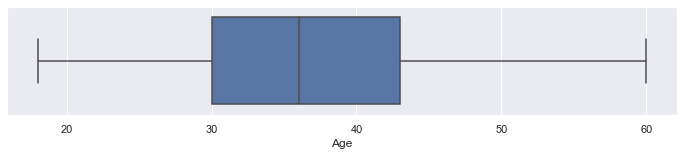

In [25]:
f, axes = plt.subplots(1,1, figsize=(12,2))
sb.boxplot(age["Age"], orient ="h")

In [26]:
age.describe()

,Age
count,1470.000000
mean,36.923810
std,9.135373
min,18.000000
25%,30.000000
50%,36.000000
75%,43.000000
max,60.000000


- the median age is 36 years
- the upper quartile is 43 years
- the lower quartile is 30 years
<br><br>
so we shall split the data as as older, middle and younger aged employees according to this information

In [27]:
data= employee.copy()

In [28]:
data['age_bins'] = pd.cut(x=data['Age'], bins=[17, 30, 42, 61])
data['age_by_decade'] = pd.cut(x=data['Age'], bins=[17, 30, 42, 61], labels=['20s', '40s', '50s'])

In [29]:
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,age_bins,age_by_decade
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,...,0,8,0,1,6,4,0,5,"(30, 42]",40s
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,...,1,10,3,3,10,7,1,7,"(42, 61]",50s
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,...,0,7,3,3,0,0,0,0,"(30, 42]",40s
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,...,0,8,3,3,8,7,3,0,"(30, 42]",40s
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,...,1,6,3,3,2,2,2,2,"(17, 30]",20s


In [30]:
younger = data[data['age_by_decade'] == '20s']
middle = data[data['age_by_decade'] == '40s']
older = data[data['age_by_decade'] == '50s']
over18 = data[data['Age'] > 18]
aged18 = data[data['Age']  == 18]

In [31]:
print(len(younger))
print(len(middle))
print(len(older))
print(len(over18))
print(len(aged18))

386
705
379
1462
8


In [32]:
data['Age'].value_counts()

35    78
34    77
31    69
36    69
29    68
32    61
30    60
33    58
38    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
46    33
44    33
43    32
50    30
24    26
25    26
47    24
49    24
55    22
48    19
51    19
53    19
52    18
54    18
22    16
56    14
58    14
23    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: Age, dtype: int64

- majority of the employees are in their 30's, where most from here are aged 35 (78 employees)
- the least number of employees are aged 57 (only 4 employees) 
- we can easily see that majority of the people are middle aged

In [33]:
data['Gender'].value_counts()

Male      882
Female    588
Name: Gender, dtype: int64

In [34]:
print(over18['Gender'].value_counts(normalize=True))
print(aged18['Gender'].value_counts(normalize=True))

Male      0.600547
Female    0.399453
Name: Gender, dtype: float64
Male      0.5
Female    0.5
Name: Gender, dtype: float64


- majority of the employees are male (882 employees)
- from this we can see that 60% of the employee over 18 are male, however the number of males in the category of aged 18 is 50%

In [35]:
filtered_1 = data[(over18['Attrition'] == 'Yes') & (data['Gender'] == 'Male')]
print(len(filtered_1))

147


In [36]:
filtered_10 = data[(aged18['Attrition'] == 'Yes') & (data['Gender'] == 'Male')]
print(len(filtered_10))

3


In [37]:
pd.set_option('display.max_columns',None)
filtered_10.head(10)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,age_bins,age_by_decade
296,18,Yes,Travel_Rarely,230,Research & Development,3,3,Life Sciences,405,3,Male,54,3,1,Laboratory Technician,3,Single,1420,25233,1,N,No,13,3,3,0,0,2,3,0,0,0,0,"(17, 30]",20s
457,18,Yes,Travel_Frequently,1306,Sales,5,3,Marketing,614,2,Male,69,3,1,Sales Representative,2,Single,1878,8059,1,N,Yes,14,3,4,0,0,3,3,0,0,0,0,"(17, 30]",20s
828,18,Yes,Non-Travel,247,Research & Development,8,1,Medical,1156,3,Male,80,3,1,Laboratory Technician,3,Single,1904,13556,1,N,No,12,3,4,0,0,0,3,0,0,0,0,"(17, 30]",20s


In [38]:
filtered_2 = data[(over18['Attrition'] == 'Yes') & (data['Gender'] == 'Female')]
print(len(filtered_2))

86


In [39]:
filtered_20 = data[(aged18['Attrition'] == 'Yes') & (data['Gender'] == 'Female')]
print(len(filtered_20))

1


- what we have done here is group all the employees over 18 and have attrition as 'Yes' according to their gender
- from this we can see that we have 147 employees under this category who are male, and 86 are female
- we can conclude that from the all the people who want attrition, majority are male from both age categories (149 out of 237)
- even though we know that there are more male, we do not know which age has the majority of employees who want to attire

In [40]:
print(older['Attrition'].value_counts(normalize=True))

No     0.883905
Yes    0.116095
Name: Attrition, dtype: float64


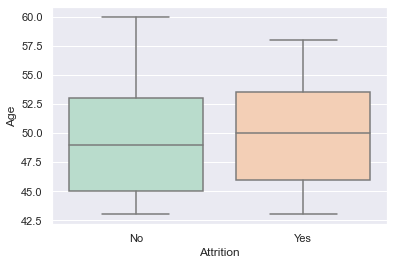

In [41]:
figure = sb.boxplot(x="Attrition", y="Age", data=older, palette='Pastel2')

In [42]:
print(middle['Attrition'].value_counts(normalize=True))

No     0.868085
Yes    0.131915
Name: Attrition, dtype: float64


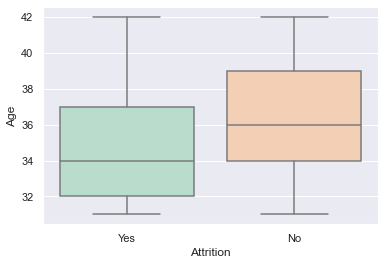

In [43]:
figure = sb.boxplot(x="Attrition", y="Age", data=middle, palette='Pastel2')

In [44]:
print(younger['Attrition'].value_counts(normalize=True))

No     0.740933
Yes    0.259067
Name: Attrition, dtype: float64


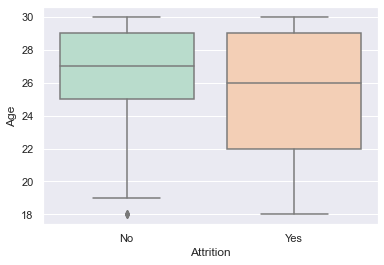

In [45]:
figure = sb.boxplot(x="Attrition", y="Age", data=younger, palette='Pastel2')

- from this we can see that the majority of employees that attire are from the younger aged category (probability of 0.259
- followed by the middle aged employees (probability of 0.132)
- lastly the younger aged employees (probability of 0.116)

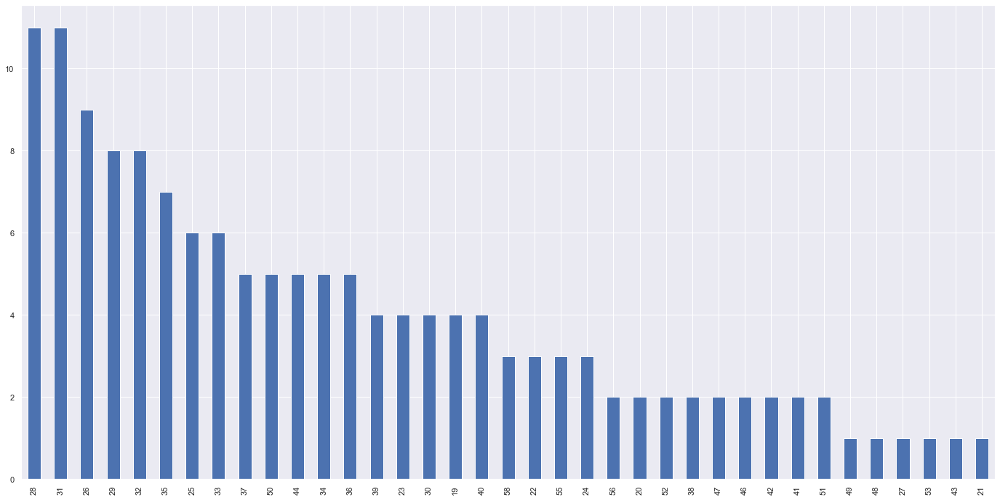

In [46]:
f, axes = plt.subplots(1,1, figsize=(24,12))
filtered_1['Age'].value_counts().plot(kind="bar")

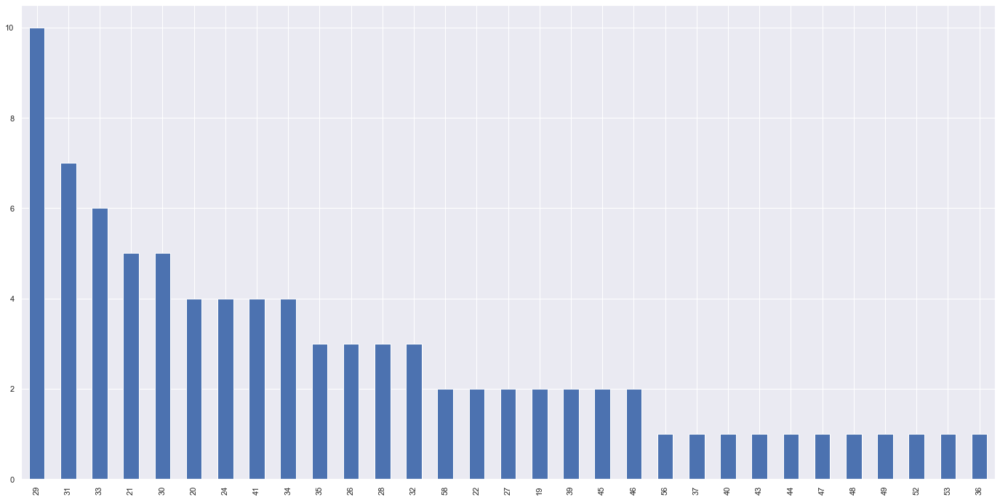

In [47]:
f, axes = plt.subplots(1,1, figsize=(24,12))
filtered_2['Age'].value_counts().plot(kind="bar")

What can we conclude from these graphs?
- the age that most males and females want to do attrition is between the 20's and 30's
- as the age reached late 40's and 50's, more females want to attire
- the ages for men to attire are more random and mixed than for females
- the graphs for both males and females both have a trend, where it stays constant for a few ages before the numbers drop
- there are more diverse ages for men, e.g. (there are male employees aged 50,51 and 23, etc)

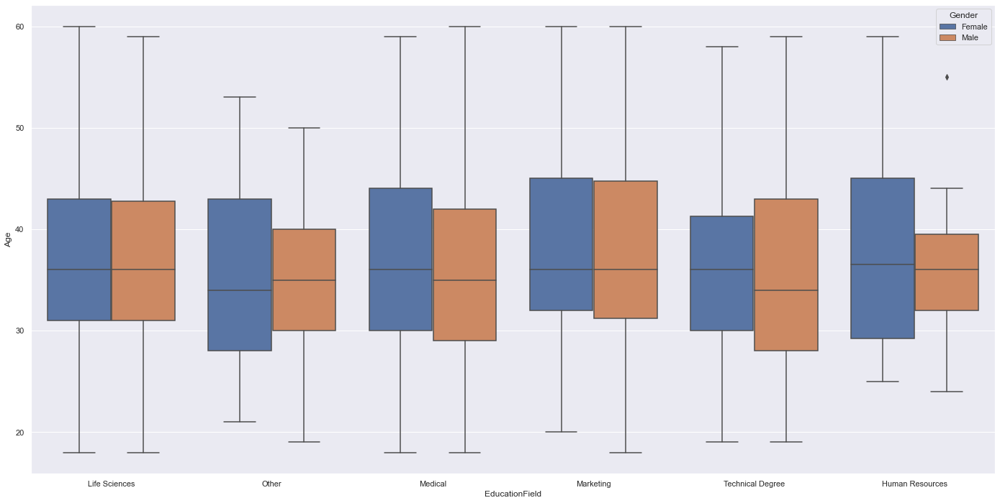

In [48]:
f, axes = plt.subplots(1,1, figsize=(24,12))
figure = sb.boxplot(x="EducationField", y="Age", hue="Gender", data=data)

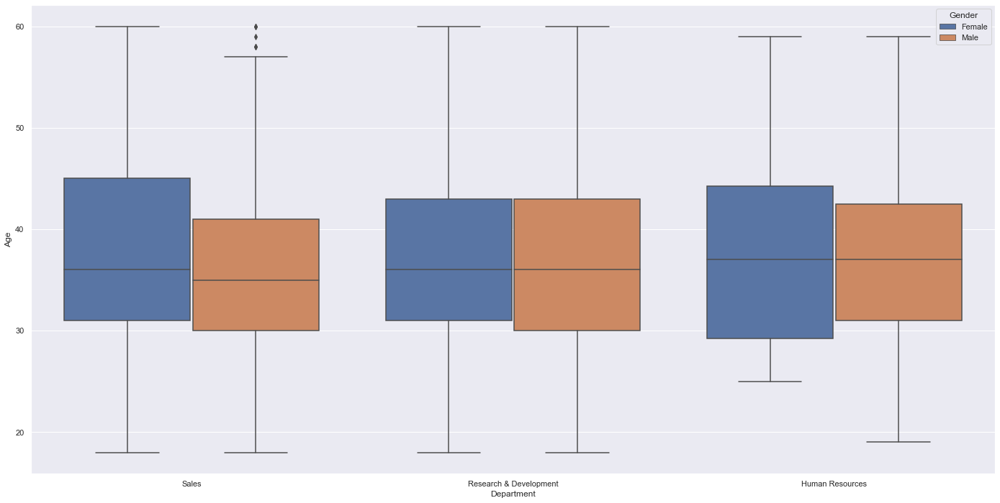

In [49]:
f, axes = plt.subplots(1,1, figsize=(24,12))
figure = sb.boxplot(x="Department", y="Age", hue="Gender", data=data)

- we can see that the distribution of males and females across the different fields are almost the same and even, according to their medians
- more females are in the human resources and more males are in the technical degree

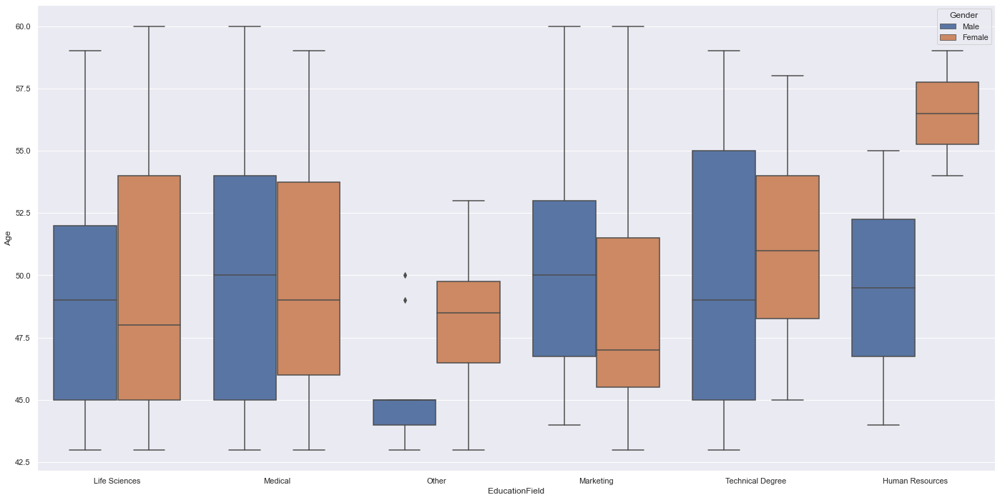

In [50]:
f, axes = plt.subplots(1,1, figsize=(24,12))
figure = sb.boxplot(x="EducationField", y="Age", hue="Gender", data=older)

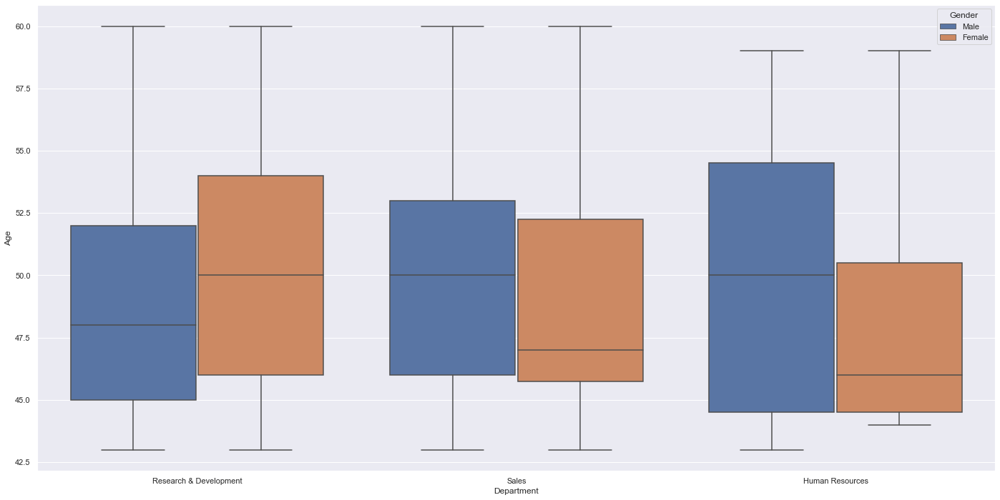

In [51]:
f, axes = plt.subplots(1,1, figsize=(24,12))
figure = sb.boxplot(x="Department", y="Age", hue="Gender", data=older)

 - we can see that very old female employees studied human resurces, whereas from this category, the younger males are all in 'other' (aged between 41 and 45)
 - I would say that the oldest males are found in either medical or technical degree
 - majority of the older females are found in the research and developement department. now we know that human resources falls under research and developement

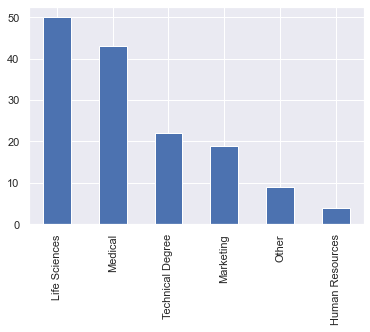

In [52]:
filtered_1['EducationField'].value_counts().plot(kind="bar")

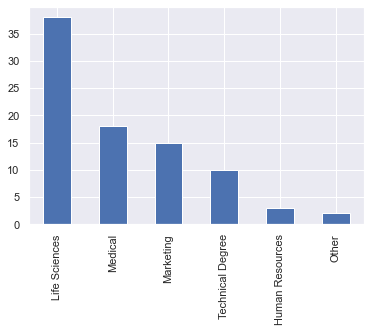

In [53]:
filtered_2['EducationField'].value_counts().plot(kind="bar")

from these barplots:
- we can see that for both males and females aged over 18, majority from the employees that want to attire are from health sciences
-  for males, the least is from human resources, and for females the least is from 'others'

In [54]:
employee["JobLevel"].value_counts()

1    543
2    534
3    218
4    106
5     69
Name: JobLevel, dtype: int64

In [55]:
employee["JobRole"].value_counts()

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64

Job level does not have a distinct, corresponding Job Role <br>
ex. Sales Executive can have a job level of 3 or 4

In [56]:
int_only= data.select_dtypes(include=['int64'])
del int_only['Education']
del int_only['EnvironmentSatisfaction']
del int_only['JobInvolvement']
del int_only['JobSatisfaction']
del int_only['PerformanceRating']
del int_only['RelationshipSatisfaction']
del int_only['WorkLifeBalance']
del int_only['JobLevel']
del int_only['NumCompaniesWorked']

all the numeric variables have been seperated and made into a data set of its own


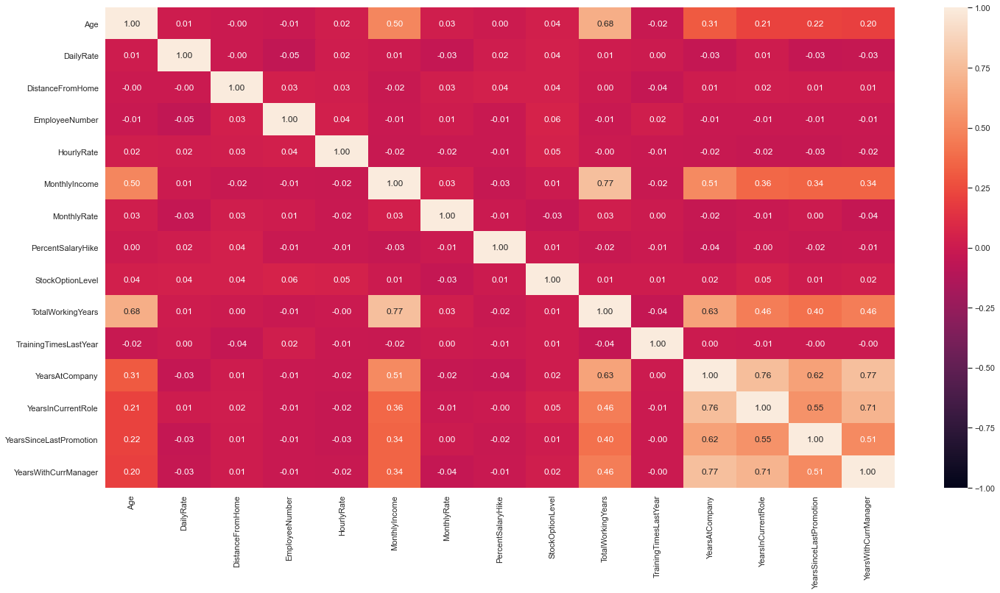

In [57]:
f,axes= plt.subplots(1,1, figsize=(24,12))
sb.heatmap(int_only.corr(), vmin=-1, vmax=1, annot=True, fmt='.2f')

In [58]:
int_only.corr()

,Age,DailyRate,DistanceFromHome,EmployeeNumber,HourlyRate,MonthlyIncome,MonthlyRate,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.010661,-0.001686,-0.010145,0.024287,0.497855,0.028051,0.003634,0.037510,0.680381,-0.019621,0.311309,0.212901,0.216513,0.202089
DailyRate,0.010661,1.000000,-0.004985,-0.050990,0.023381,0.007707,-0.032182,0.022704,0.042143,0.014515,0.002453,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,-0.004985,1.000000,0.032916,0.031131,-0.017014,0.027473,0.040235,0.044872,0.004628,-0.036942,0.009508,0.018845,0.010029,0.014406
EmployeeNumber,-0.010145,-0.050990,0.032916,1.000000,0.035179,-0.014829,0.012648,-0.012944,0.062227,-0.014365,0.023603,-0.011240,-0.008416,-0.009019,-0.009197
HourlyRate,0.024287,0.023381,0.031131,0.035179,1.000000,-0.015794,-0.015297,-0.009062,0.050263,-0.002334,-0.008548,-0.019582,-0.024106,-0.026716,-0.020123
MonthlyIncome,0.497855,0.007707,-0.017014,-0.014829,-0.015794,1.000000,0.034814,-0.027269,0.005408,0.772893,-0.021736,0.514285,0.363818,0.344978,0.344079
MonthlyRate,0.028051,-0.032182,0.027473,0.012648,-0.015297,0.034814,1.000000,-0.006429,-0.034323,0.026442,0.001467,-0.023655,-0.012815,0.001567,-0.036746
PercentSalaryHike,0.003634,0.022704,0.040235,-0.012944,-0.009062,-0.027269,-0.006429,1.000000,0.007528,-0.020608,-0.005221,-0.035991,-0.001520,-0.022154,-0.011985
StockOptionLevel,0.037510,0.042143,0.044872,0.062227,0.050263,0.005408,-0.034323,0.007528,1.000000,0.010136,0.011274,0.015058,0.050818,0.014352,0.024698
TotalWorkingYears,0.680381,0.014515,0.004628,-0.014365,-0.002334,0.772893,0.026442,-0.020608,0.010136,1.000000,-0.035662,0.628133,0.460365,0.404858,0.459188


#### the main variables to focus on are:
    1) age
    2) monthly income
    3) years at company
    4) total working years

In [59]:
data_falsea=data.loc[data["Attrition"]=="No"]

In [60]:
data_falsea.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,age_bins,age_by_decade
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,1,10,3,3,10,7,1,7,"(42, 61]",50s
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,0,8,3,3,8,7,3,0,"(30, 42]",40s
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,1,6,3,3,2,2,2,2,"(17, 30]",20s
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,8,4,Male,79,3,1,Laboratory Technician,4,Single,3068,11864,0,Y,No,13,3,3,0,8,2,2,7,7,3,6,"(30, 42]",40s
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,10,3,Female,81,4,1,Laboratory Technician,1,Married,2670,9964,4,Y,Yes,20,4,1,3,12,3,2,1,0,0,0,"(42, 61]",50s


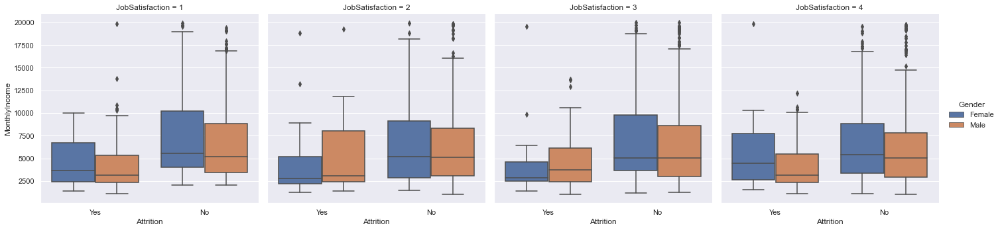

In [61]:
figure = sb.catplot(x="Attrition", y="MonthlyIncome", hue="Gender",col="JobSatisfaction",
                data=data, kind="box");

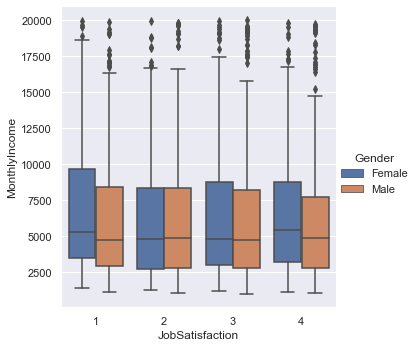

In [62]:
figure = sb.catplot(x="JobSatisfaction", y="MonthlyIncome", hue="Gender",
                data=data, kind="box");

###### What can we see from the first graph:
- for employees that have the lowest job satisfaction ( ranked 1) , the ones who want to attire have a significantly lower monthly income mean
     - in this category females have a higher pay than males.
- as the satisfaction increases, from the employees who dont want to attire, females still have a higher pay than the males. however the median pays are the same 
     - in the category 2 and 3, from the employees who want to attire, the females have a lower pay than the males

###### what we can see from the second graph:
- the male employees have a constant monthly income trend as the job satisfaction increases from 1 to 4, and then there is a slight but not drastic drop, even though the median is the same 
- for the females, the ones with the lowest job satisfaction have the highest monthly income, and as the satisfaction increases from 2 to 4, the income is slightly lower but stays more or less the same

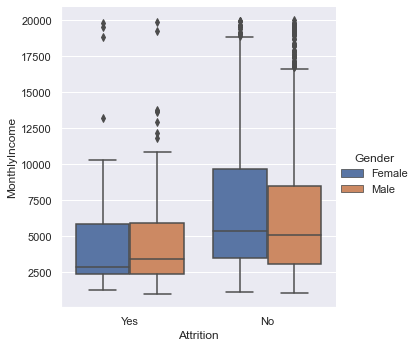

In [63]:
figure = sb.catplot(x="Attrition", y="MonthlyIncome", hue="Gender",
                data=data, kind="box");

###### what we can see:
- from this graph we cans see that from the employees who want to attire, their monthly income is singinficantly lower than those who dont want to attire. the monthly income for both the males and females are basically the same
- from those who dont want to attire, the median monthly income is the same for both genders, but the females have a higher variance, so they have a higher pay chance

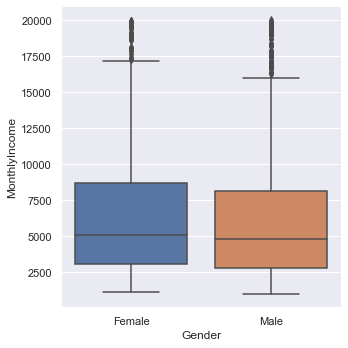

In [64]:
figure = sb.catplot(x="Gender", y="MonthlyIncome",
                data=data, kind="box");

but here we can see that there is no biasness with monthly income and gender and they are almost the exact same


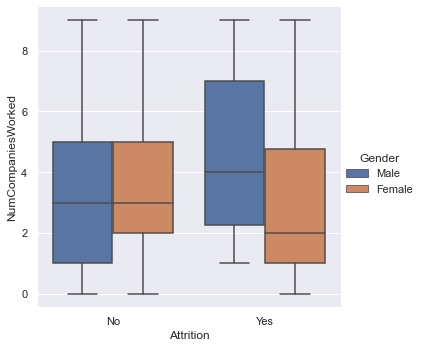

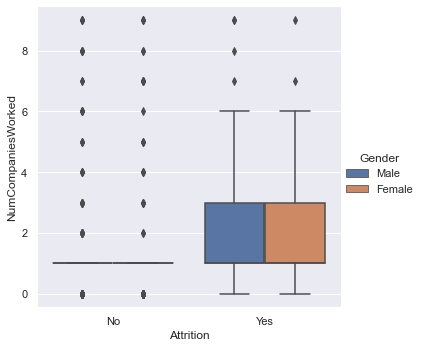

In [65]:
figure = sb.catplot(x="Attrition", y="NumCompaniesWorked", hue="Gender",
                data=older, kind="box");
figure = sb.catplot(x="Attrition", y="NumCompaniesWorked", hue="Gender",
                data=younger, kind="box")

###### what can we see from the older employees :
- from all this age category of 43+, we can see that the majority of male employees that want to attire have worked for the most number of companies
- for the employees who dont want to attire they have worked for more or less the same number of companies
- for both males and females that dont want to attire, their median worked companies is 3 and their upper quartile is 5

###### for the younger aged we can see:
- here we can see that the younger aged employees have worked for less companies compared to the older employees
- this may be because they are still working and getting more work oppertunities and experience, over time their number of worked companies may also increase
- for those who dont want to attrie, the median is constant at 1 company, and this the exact same trend for both males and females
- for those who want to attire, the male and females have worked for the same number of companies. they have the same graph structure and variance, if the outliers are excluded

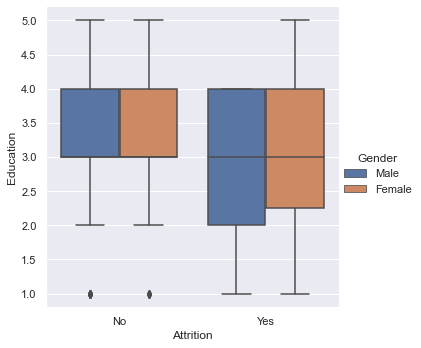

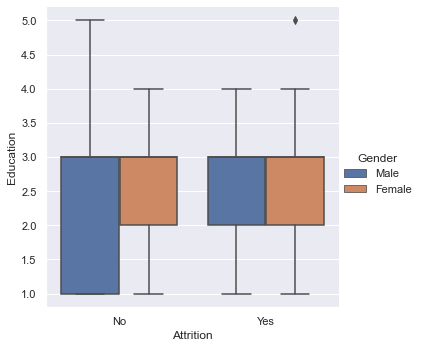

In [66]:
figure = sb.catplot(x="Attrition", y="Education", hue="Gender",
                data=older, kind="box");
figure = sb.catplot(x="Attrition", y="Education", hue="Gender",
                data=younger, kind="box");

###### what can see:
- the older males and females mwho dont want to attire are the most educated since the variance is smaller, and the median is about 3.5
- for those who want to attrie, the males are slightly more educated than the females, but they have the same median, just a higher variance for the better. the maximum education level for the older females who want to attire is 4
- for the younger employees, males and females who dont want to attire have the exact same level of education
- for the younger employees who want to attire,the males and females have the exact same education level trend, which is also the same for the females who dont want to attire
- for the younger males who dont want to attire they are the least educated who looking at the box plot, as their variance is larger

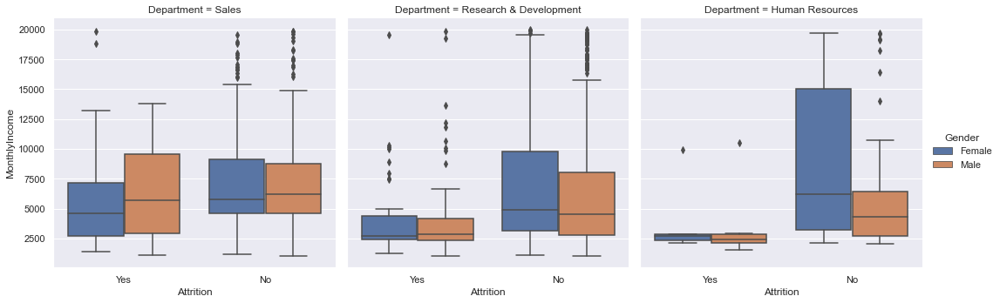

In [67]:
figure = sb.catplot(x="Attrition", y="MonthlyIncome", hue="Gender",col="Department",
                data=data, kind="box");

###### what can we see:
- a great clear trend can be spotted here
    - in the human resources departement all the employees that want to attire have the lowest possible income. the females in this department who dont want to attire have the highest possible income.
    - for research and development, the employees that want to attire also have the lowest income compared to those who dont want to attire.
    - for sales, the males who want to attire have the same median as those who dont want to attire, but their variance is greater, so chances of getting a higher or lower income is higher. as for the females, the ones who want to attire have a lower income
- the trend here is that the people want to attire when their departement pays them less

In [68]:
over36 = data[data['Age'] <= 36]
under36 = data[data['Age'] > 36]

In [69]:
male_over36 = over36[(over36['Gender'] == 'Male')]
female_over36 = over36[(over36['Gender'] == 'Female')]
male_under36 = under36[(under36['Gender'] == 'Male')]
female_under36 = under36[(under36['Gender'] == 'Female')]

In [70]:
print(len(male_over36))
print(len(female_over36))
print(len(male_under36))
print(len(female_under36))

488
310
394
278


###### what have we done here:
- we have split the ages from the median of 36
- after splitting we are looking at the level of attrition trend of the employees aged below the median and above the median

In [71]:
print(male_over36['Attrition'].value_counts(normalize=True))
print(female_over36['Attrition'].value_counts(normalize=True))
print(male_under36['Attrition'].value_counts(normalize=True))
print(female_under36['Attrition'].value_counts(normalize=True))

No     0.793033
Yes    0.206967
Name: Attrition, dtype: float64
No     0.790323
Yes    0.209677
Name: Attrition, dtype: float64
No     0.875635
Yes    0.124365
Name: Attrition, dtype: float64
No     0.920863
Yes    0.079137
Name: Attrition, dtype: float64


###### what can we see:
- males over 36 with attrition: 0.210
- females over 36 with attrition:0.210
- males under 36 with attrition: 0.124
- females under 36 with attrition: 0.080

##### Work Life Balance


In [72]:
worklifebalance=data['WorkLifeBalance']
int_only.insert(15,'worklifebalance', worklifebalance.values)

In [73]:
int_only.head()

,Age,DailyRate,DistanceFromHome,EmployeeNumber,HourlyRate,MonthlyIncome,MonthlyRate,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,worklifebalance
0,41,1102,1,1,94,5993,19479,11,0,8,0,6,4,0,5,1
1,49,279,8,2,61,5130,24907,23,1,10,3,10,7,1,7,3
2,37,1373,2,4,92,2090,2396,15,0,7,3,0,0,0,0,3
3,33,1392,3,5,56,2909,23159,11,0,8,3,8,7,3,0,3
4,27,591,2,7,40,3468,16632,12,1,6,3,2,2,2,2,3


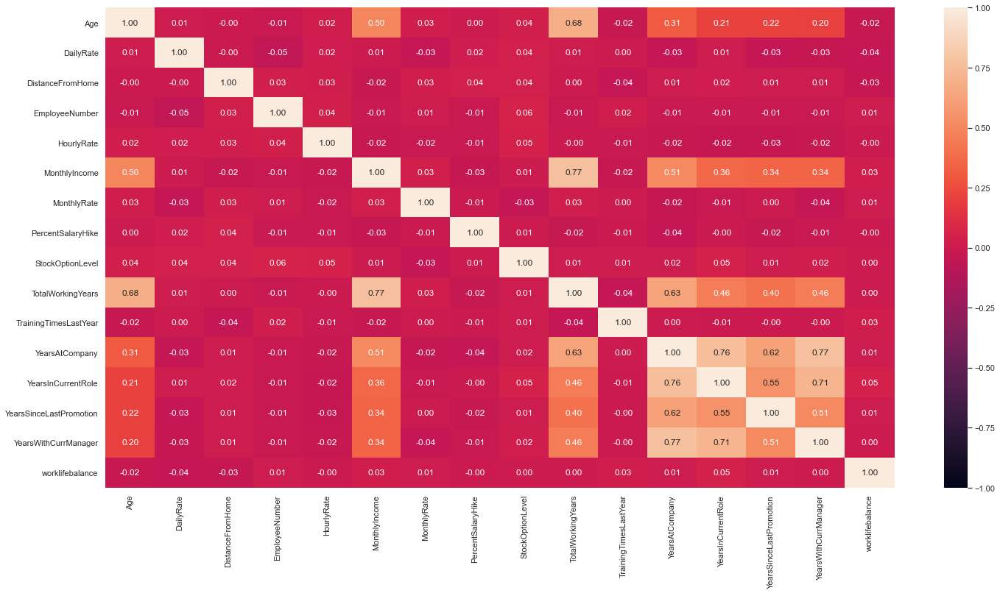

In [74]:
f,axes= plt.subplots(1,1, figsize=(24,12))
sb.heatmap(int_only.corr(), vmin=-1, vmax=1, annot=True, fmt='.2f')

work life balance has no correlation with any of the numeric varibles, as the correlation is significant to 0 with everything

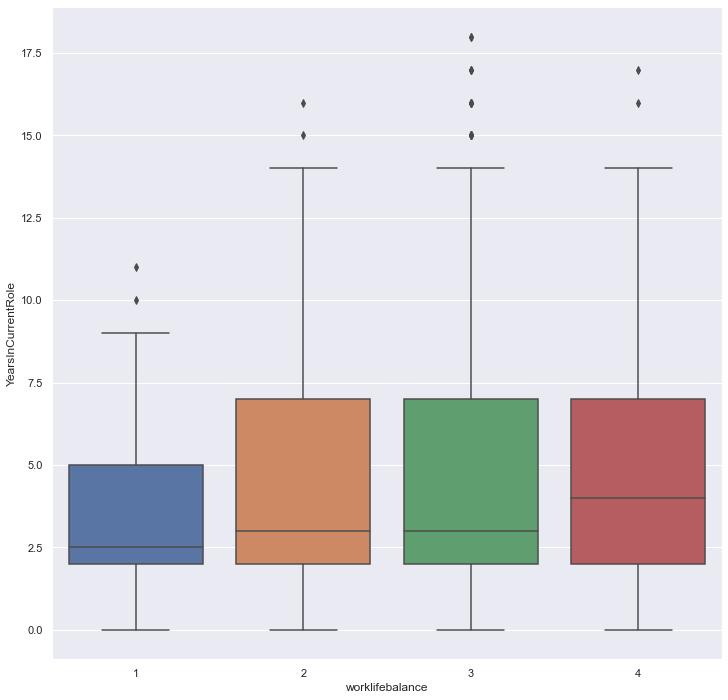

In [75]:
f, axes=plt.subplots(1,1, figsize=(12,12))
figure = sb.boxplot(x="worklifebalance", y="YearsInCurrentRole", data=int_only)

- as work life balance becomes better, the years in current role increase
- the work life balance stays the same for 2,3 and 4 ratings but the median of years in current role for 'best' work life is the highest. the varaince is all the same thoug
- employees that have a have a work life balance which is 'bad' have worked for the least amount of time when comparing the medians and overall variance


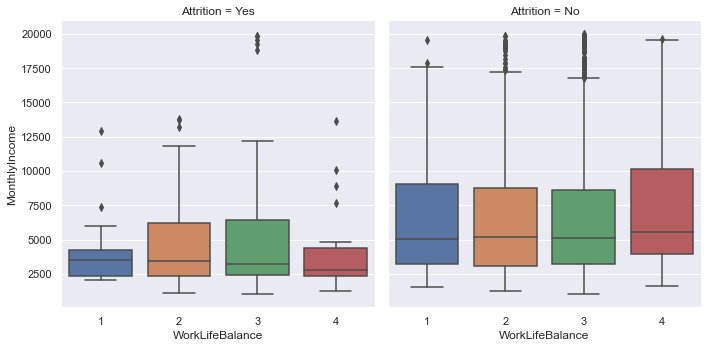

In [76]:
figure = sb.catplot(x="WorkLifeBalance", y="MonthlyIncome", col="Attrition",
                data=data, kind="box");

- comparing the employees with the same work life balance, those that want to attire have a lower monthly income that those who dont want to attire
- there is quite a difference in monthly income when comparing the medians 

In [77]:
work_yes = data[(data['Attrition'] == 'Yes')]
work_no = data[(data['Attrition'] == 'No')]

In [78]:
work_yes['WorkLifeBalance'].value_counts()

3    127
2     58
4     27
1     25
Name: WorkLifeBalance, dtype: int64

In [79]:
work_no['WorkLifeBalance'].value_counts()

3    766
2    286
4    126
1     55
Name: WorkLifeBalance, dtype: int64

##### Total Working Years

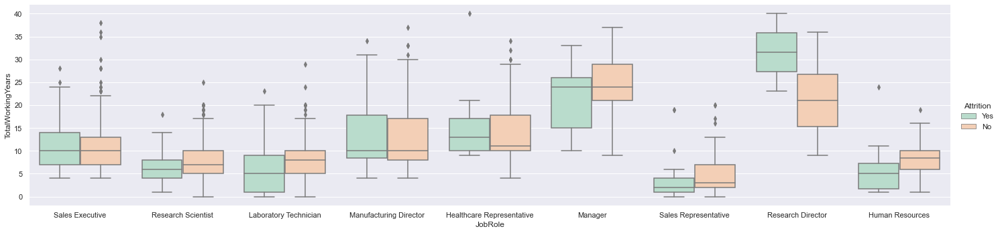

In [80]:
figure = sb.catplot(x="JobRole", y="TotalWorkingYears", hue="Attrition",
                data=data, kind="box",palette='Pastel2', aspect=4);

- only employees who have worked for higher years in the job role of a health care representative or research director want to attire 
- all the other job roles employees that want to attire have worked for either the same or less amount of years than those who dont want to attire (this is concluded by looking at the median)

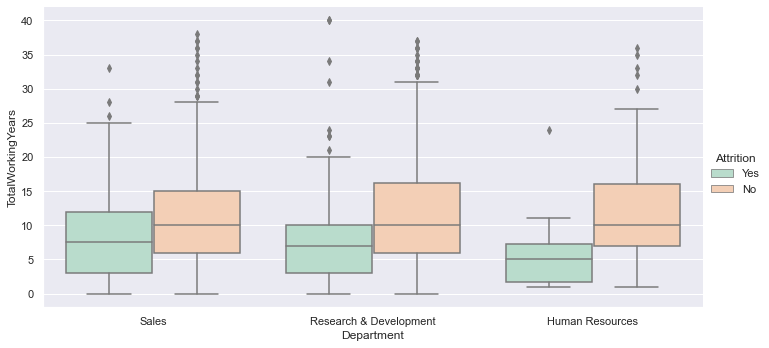

In [81]:
figure = sb.catplot(x="Department", y="TotalWorkingYears", hue="Attrition",
                data=data, kind="box",palette='Pastel2', aspect=2);

looking at the employees that want to attire, from all the departments the employees that have worked for the less amount of years are the ones who want to attire

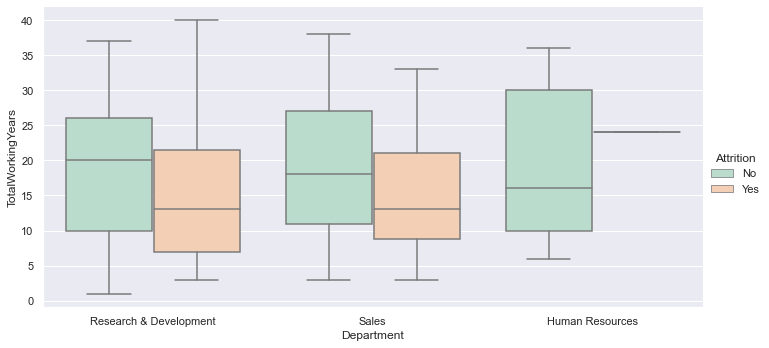

In [82]:
figure = sb.catplot(x="Department", y="TotalWorkingYears", hue="Attrition",
                data=older, kind="box",palette='Pastel2', aspect=2);

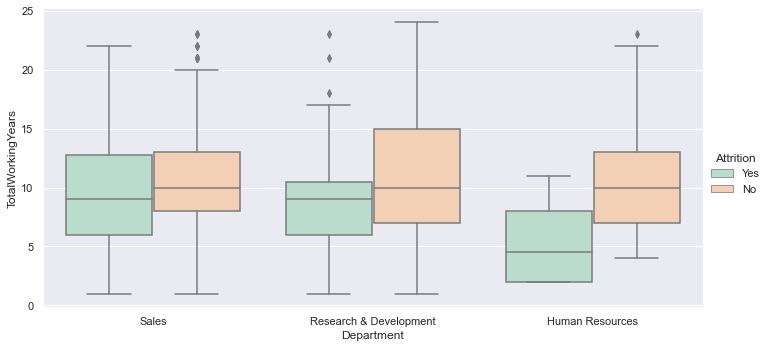

In [83]:
figure = sb.catplot(x="Department", y="TotalWorkingYears", hue="Attrition",
                data=middle, kind="box",palette='Pastel2', aspect=2);

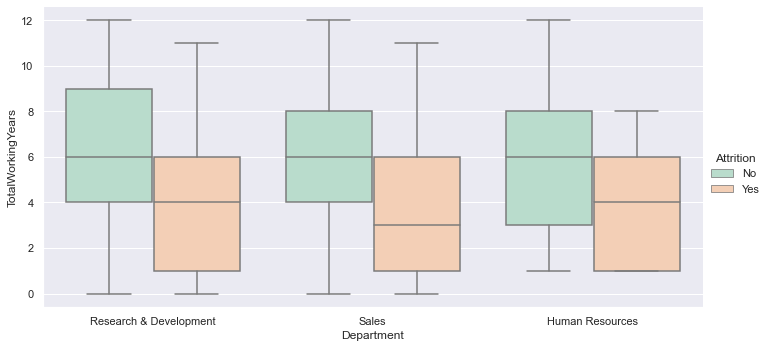

In [84]:
figure = sb.catplot(x="Department", y="TotalWorkingYears", hue="Attrition",
                data=younger, kind="box",palette='Pastel2', aspect=2);

even after splitting the ages into older, middle and younger categories, the employees that attire are the ones who have the lower number of total working years

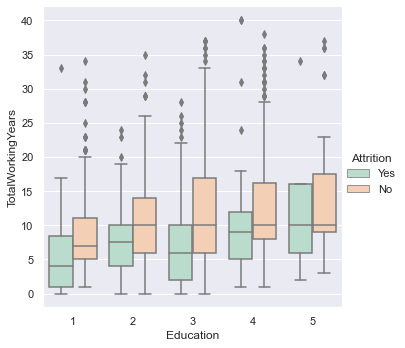

In [85]:
figure = sb.catplot(x="Education", y="TotalWorkingYears", hue="Attrition",
                data=data, kind="box",palette='Pastel2');

- as the education level increases, the gap of total working years between the employees that want to attire and who dont want to attire reduces
- employees with an education level of 4 and 5 have the smalllest total working years gap between those employees who are attiring and not attiring
- employees with education level of 3 has the highest toatl working years gap between those employees who are attiring and not attiring
- the median number of total working years stays constant from an education level of 2 - 5 for the employees who dont want to attire, but the variance is what changes
- for those that want to attire, there is no regular trend of increase or decrease with the total number of working years as the education level increases

##### Job Level

here we used box plots to see which categorical variables influenced JobLevel

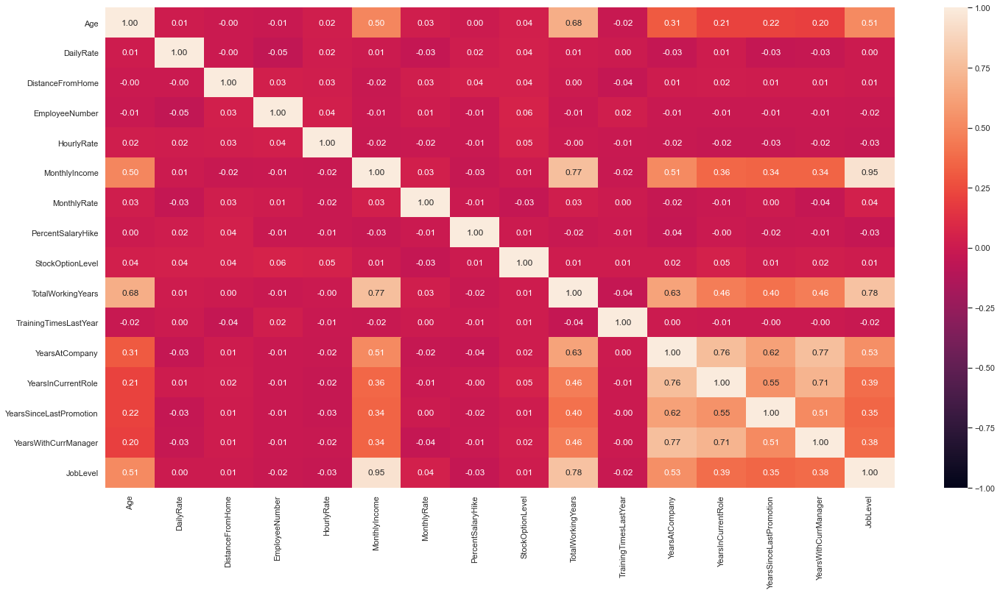

In [86]:
joblevel=pd.DataFrame(data[['Age','DailyRate','DistanceFromHome','EmployeeNumber','HourlyRate','MonthlyIncome','MonthlyRate','PercentSalaryHike','StockOptionLevel','TotalWorkingYears','TrainingTimesLastYear','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager','JobLevel']])
f,axes= plt.subplots(1,1, figsize=(24,12))
sb.heatmap(joblevel.corr(), vmin=-1, vmax=1, annot=True, fmt='.2f')

correlation of how numeric variables influence and are related to JobLevel

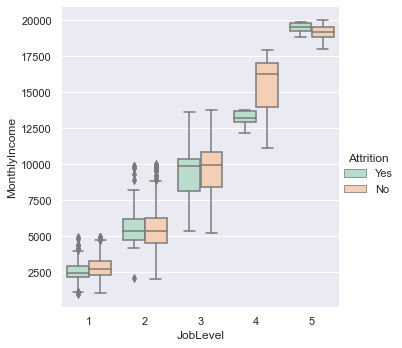

In [87]:
figure = sb.catplot(x="JobLevel", y="MonthlyIncome", hue="Attrition",
                data=data, kind="box",palette='Pastel2');

- from the numeric variables, monthly income had the highest correlation with job level (0.95)
- as the job level increases, the monthly income also increases
- the median monthly income stays more or less the same as the job level increases from 1-3, however from 3-4 there is a very big jump in median of the monthly income the empolyees recieve
- the employees that want to attire with a job level of 4 have a much lower monthly income
- the employees that wnat to attire with a job level of 5 actually have a higher monthly income than those who dont want to attire

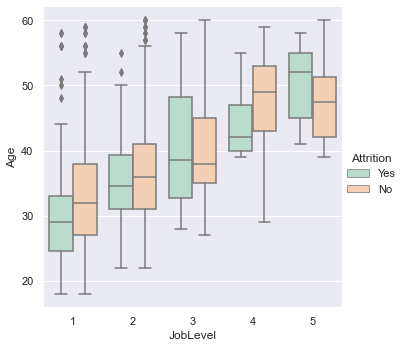

In [88]:
figure = sb.catplot(x="JobLevel", y="Age", hue="Attrition",
                data=data, kind="box",palette='Pastel2');

from this graph we can see:
- as the job level increases, the age also increases for both employees who want to attire and those who dont want to attire
- job levels of 3 and 5 have employees that are older who want to attire when comapring the medians with those who dont want to attire

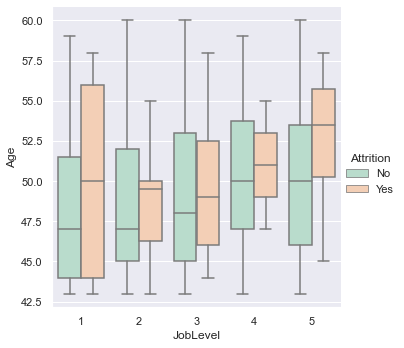

In [89]:
figure = sb.catplot(x="JobLevel", y="Age", hue="Attrition",
                data=older, kind="box",palette='Pastel2');

here we can see that when looking at the older aged employees, from all job levels, the employees that want to attire are older than those who dont want to attire

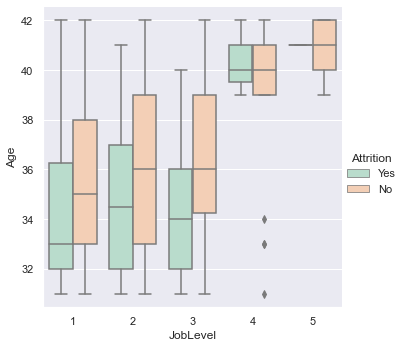

In [90]:
figure = sb.catplot(x="JobLevel", y="Age", hue="Attrition",
                data=middle, kind="box",palette='Pastel2');

here we can see that the employees that want to attire from the middle age group are actually younger than those who dont want to attire

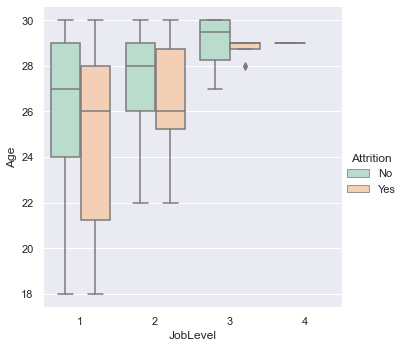

In [91]:
figure = sb.catplot(x="JobLevel", y="Age", hue="Attrition",
                data=younger, kind="box",palette='Pastel2');

here we can see that the employees that want to attire from the younger age group are actually younger than those who dont want to attire

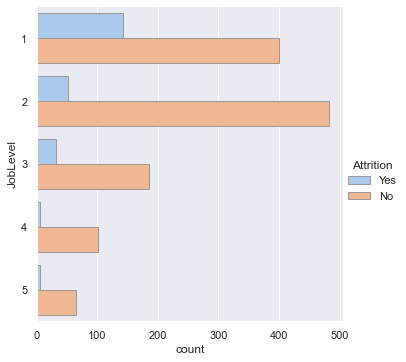

In [92]:
sb.catplot(y="JobLevel", hue="Attrition", kind="count",
            palette="pastel", edgecolor=".6",
            data=data)

this is just a graph to show that majority of the people who attire are having a job level of below 4 and 5

##### Categorical Part 1 

<Figure size 720x720 with 0 Axes>

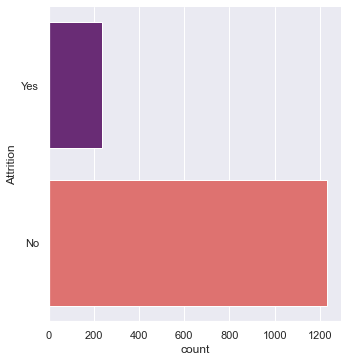

<Figure size 720x720 with 0 Axes>

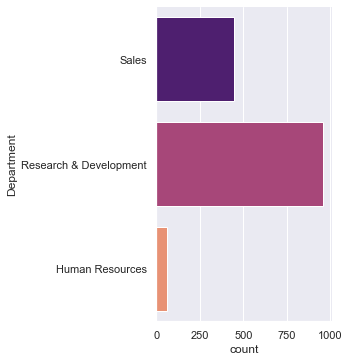

<Figure size 720x720 with 0 Axes>

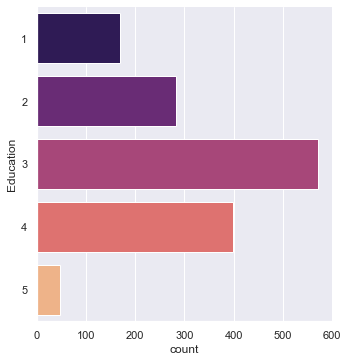

<Figure size 720x720 with 0 Axes>

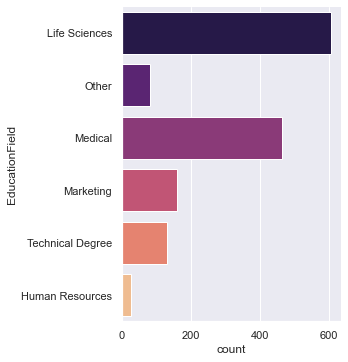

<Figure size 720x720 with 0 Axes>

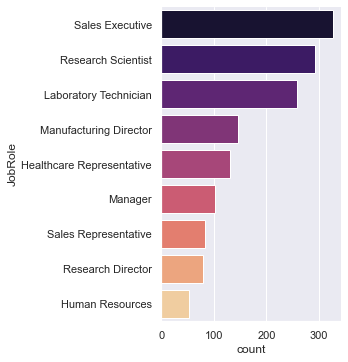

<Figure size 720x720 with 0 Axes>

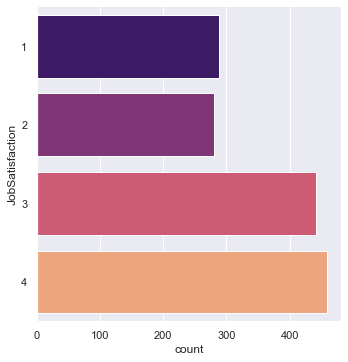

<Figure size 720x720 with 0 Axes>

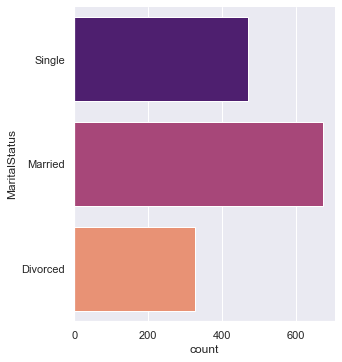

<Figure size 720x720 with 0 Axes>

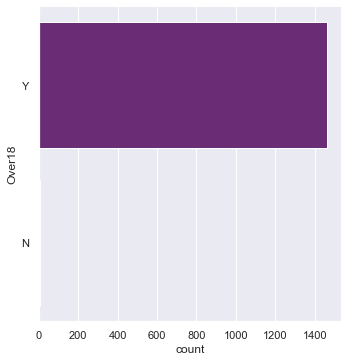

<Figure size 720x720 with 0 Axes>

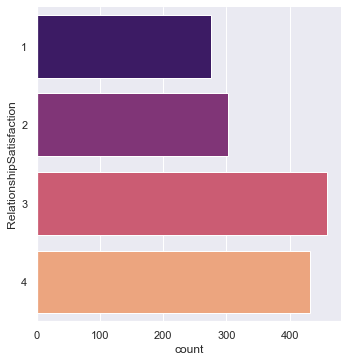

In [93]:
for var in cat_2:
    f = plt.figure(figsize=(10, 10))
    sb.catplot(y = var, data = employee, kind = "count", height = 5, palette="magma")

In [94]:
for var in cat_2:    
    print(employee[var].value_counts())
    print("\n")

No     1233
Yes     237
Name: Attrition, dtype: int64


Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


3    572
4    398
2    282
1    170
5     48
Name: Education, dtype: int64


Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64


Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64


4    459
3    442
1    289
2    280
Name: JobSatisfaction, dtype: int64


Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64


Y    1462
N       8
Name: Over18, dtype: int64


3    459
4    432
2    303
1 

#### Based on count plot:
1. Most people are **without attrition**
2. Most people are in **research & development**, followed by sales, lastly human resources
3. Most people with **3rd level of education (Bachelor)**, least with 5 (Doctorate)
4. Most people are from life sciences, least from human resources <br> *63 employees in human resources department, but only 27 studied about it, and 52 people work in human resources* <br>
5. Most people are **satisified** with their job (4 followed by 3), <br> *suprisingly more people voted for low satisfaction than medium*
6. Most people are **married**, then single, few divorced.
7. Most people are **over 18 years old**
8. Most people are **satisfied with their relationship**, fewest in low satisfaction

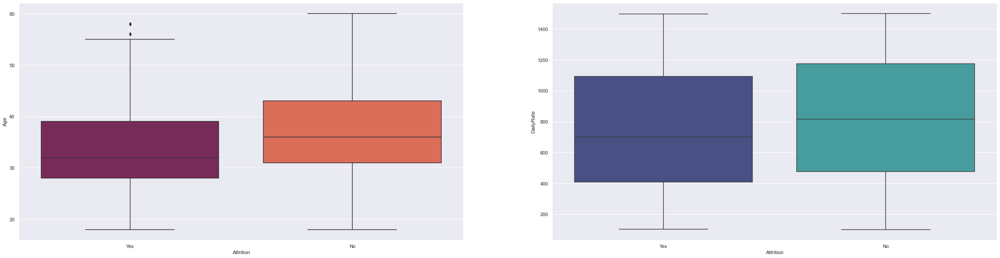

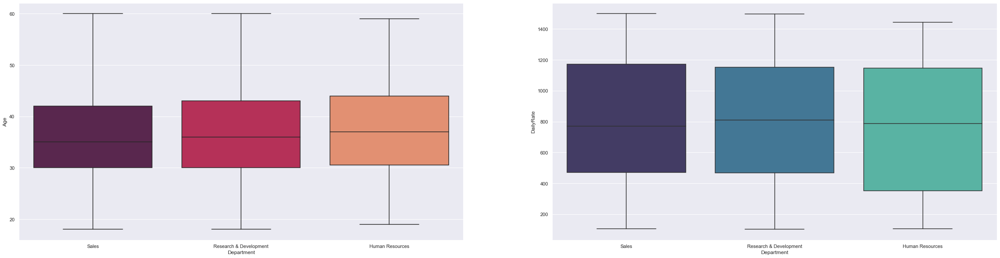

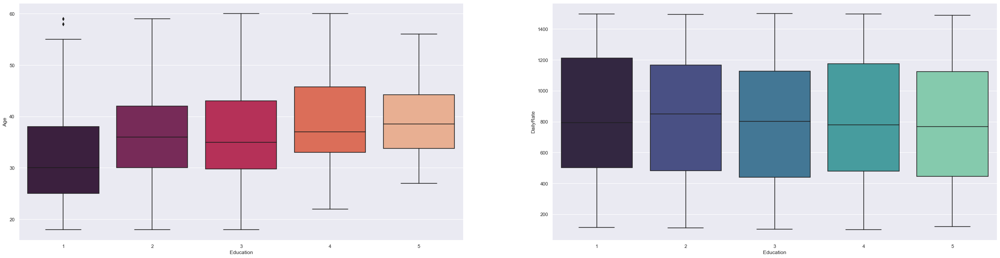

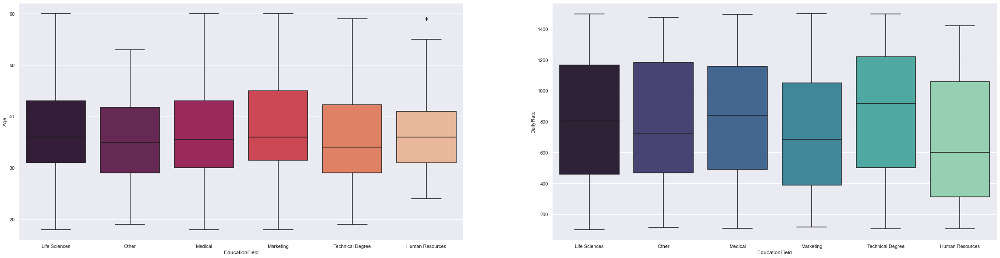

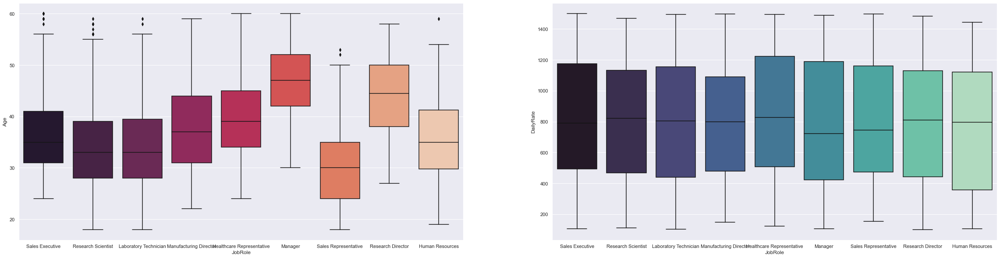

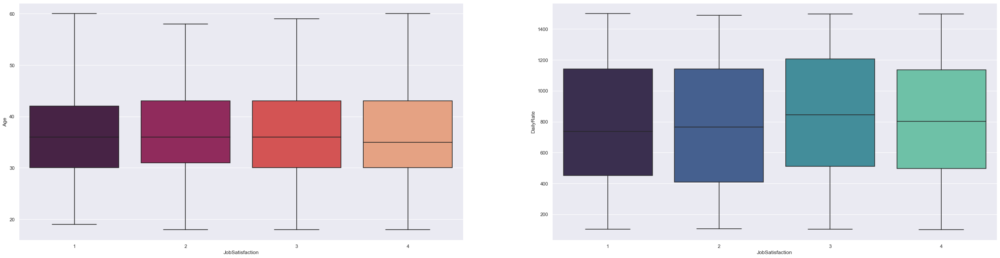

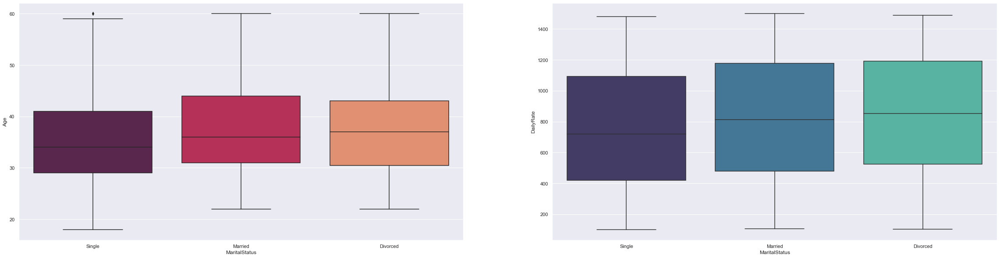

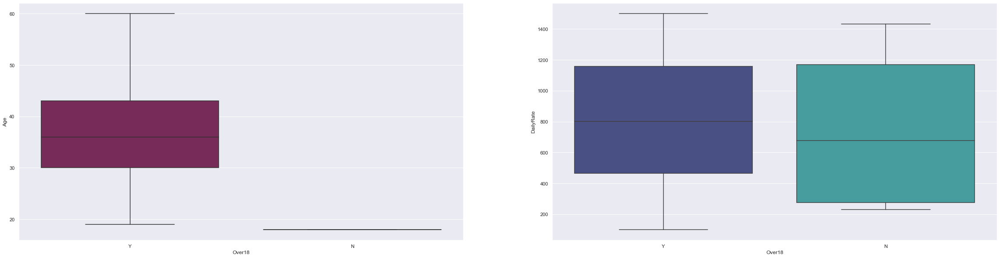

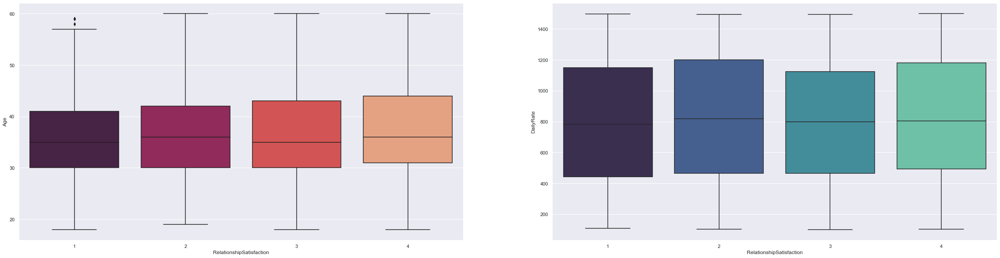

In [95]:
for var in cat_2:
    f, axes = plt.subplots(1,2, figsize=(40,10))
    sb.boxplot(x = var, y = 'Age', data = employee, ax=axes[0], palette="rocket")
    sb.boxplot(x = var, y = 'DailyRate', data = employee, ax=axes[1], palette="mako")

#### Age
seems to have some variation with:
1. JobRole <br>
**Managers** are mostly older (*above 30 years old*), <br>
followed by **Research directors** (*above 26-27 years old*). <br>
**Sales representatives** has the lowest median age among the other job roles.<br><br>
2. Education <br>
The higher the level of education, the older the employees. <br>
Those who earn a **Doctorate degree (education level 5)** are mostly older. <br>
*This completely makes sense because a doctorate degree takes longer years to complete, and we can observe that there seems to be a slight positive correlation between age and level of education. The higher the level of education, the longer the years spent studying for it.*<br><br>
3. Marital Status <br>
Divorced employees have a median age higher than those who are married, and the lowest median age are those who are single. <br><br>
4. Attrition <br>
The median age for people **attiring** is **lower** than those not attiring. <br>

***We will be going deeper into attrition in a separate section below.***

#### Daily rate
seems to have some variation with:
1. Education <br>
There is a lot of variation in daily rates for different education levels. No significant positive or negative trend is observed. <br><br>
2. Education Field<br>
Similar to Education, a lot of variation. It seems that those who studied Human Resources has the lowest daily rate and those with a Technical Degree has the highest.<br><br>
3. Attrition <br>
Those attiring have a lower median daily rate.<br><br>
4. Marital Status <br>
Median daily rate is lowest for employees who are single, followed by married, and lastly divorced. <br>
We are unable to think of a possible reason for this as it is very odd to assume that employees are getting paid more because they are divorced. We decided to treat this finding as something purely by chance.

In [96]:
manager= employee[employee["JobRole"]=="Manager"]
manager.shape

(102, 33)

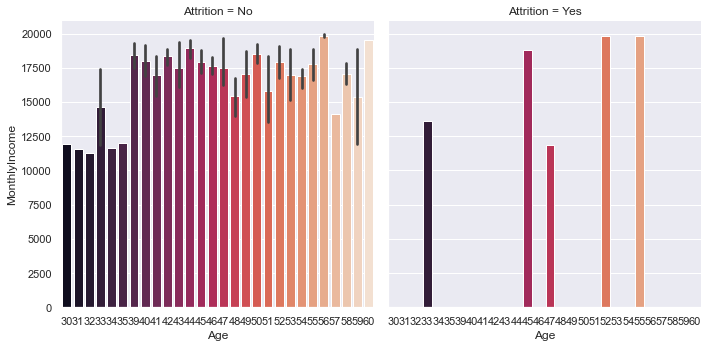

In [97]:
sb.catplot(x="Age", y="MonthlyIncome", col='Attrition',
                data=manager, kind="bar", palette= "rocket")

This is a barplot of monthly income against age among employees who are managers and separated into whether they are attiring or not. <br>
Out of 102 managers, 5 of them are attiring. Out of the 5, 4 are 45 years old and older. <br>
We see that the older attiring managers are actually receving a very high monthly income, even higher than those who are not attiring. Hence, it may be that these managers are attiring because of their old age.

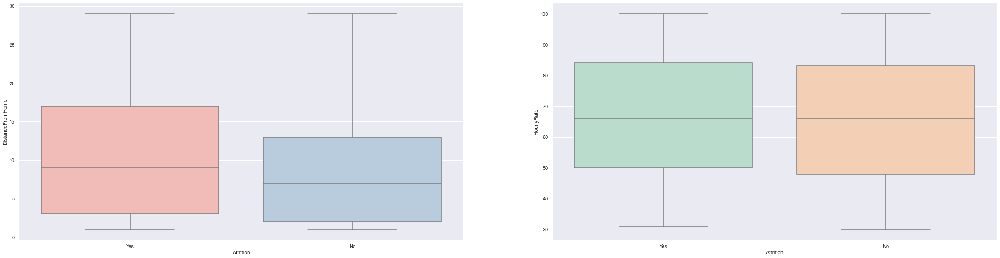

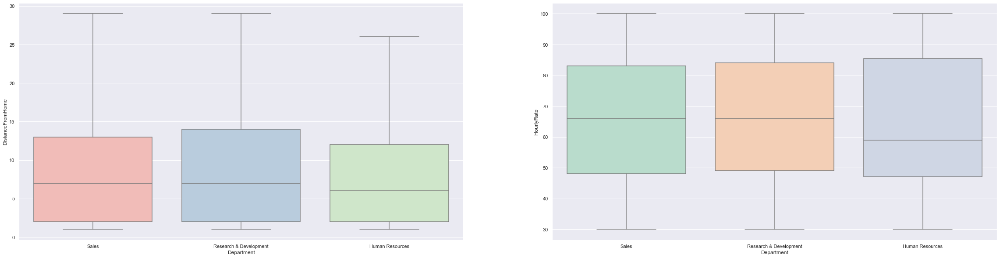

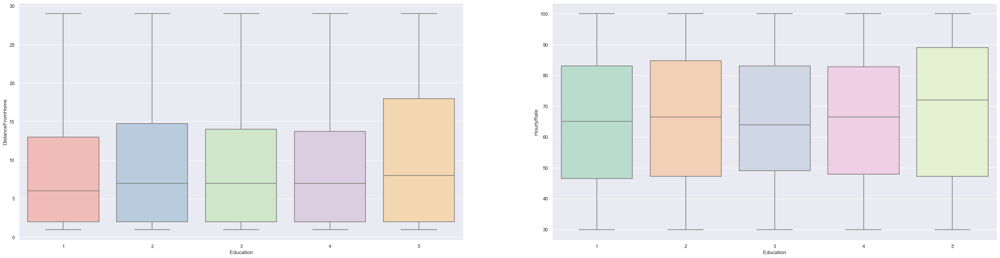

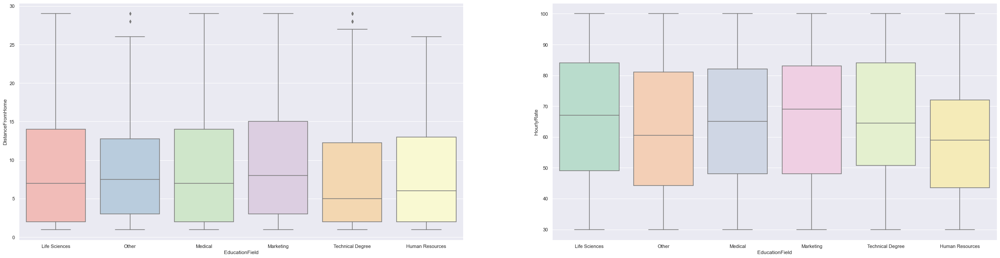

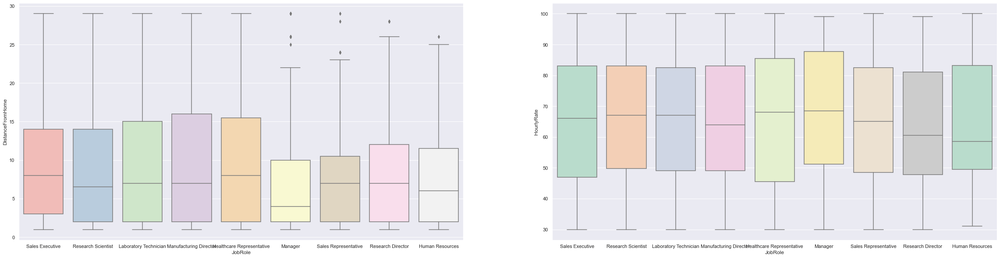

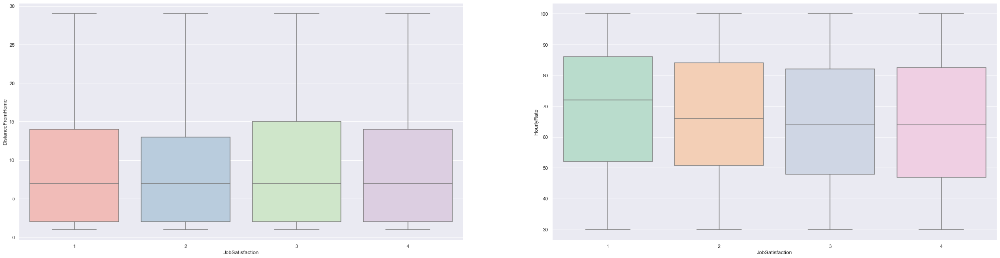

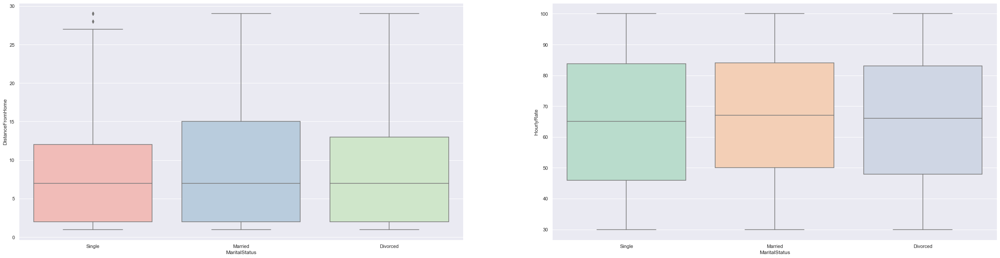

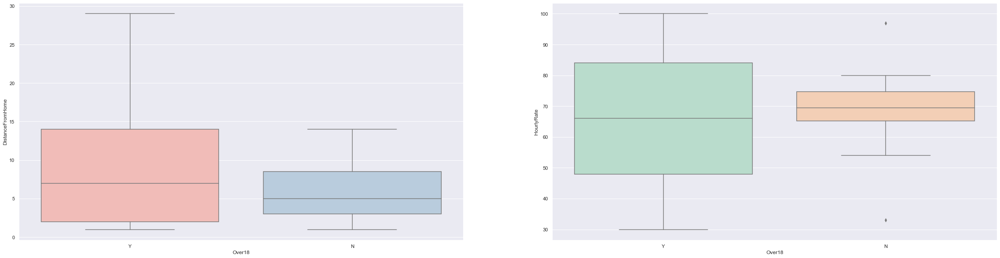

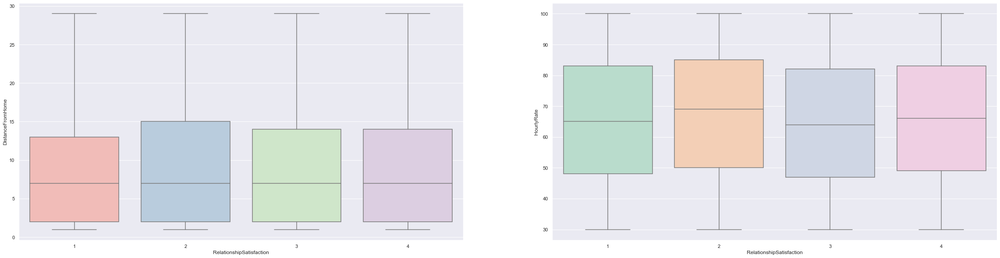

In [98]:
for var in cat_2:
    f, axes = plt.subplots(1,2, figsize=(40,10))
    sb.boxplot(x = var, y = 'DistanceFromHome', data = employee, ax=axes[0], palette="Pastel1")
    sb.boxplot(x = var, y = 'HourlyRate', data = employee, ax=axes[1], palette="Pastel2")

#### Distance from Home
seems to have some variation with:
1. JobRole 
**Managers** seem to live closer to their workplace than other job roles (*lowest median among all*). <br>
This may be because they have been working as a manager in the company for a long time, hence they may be more satisfied with their job role and decide to keep working there and so choose to live in an area close to work. <br><br>
2. Over18 <br>
Employees who are **18 years old** seem to live closer to the workplace. <br>
We assume that it is because its their first job and they may look for a workplace in an area they are more familiar with<br><br>
3. Attrition <br>
Employees **living further** away from work are more likely to **attire**.

#### Hourly Rate
seems to have some variation with:
1. Department <br>
**Human Resources** employees seem to have a lower hourly rate than the other departments (*based on its lower median*).<br><br>
2. Education <br>
**Doctorates** employees may have a slightly higher hourly rate than the other employees (*higher median*).<br><br>
3. EducationField <br>
Supporting point number 1, employees with **Human Resources** as their education field has a lower hourly rate.<br><br>
3. Over18 <br>
Those who are **18 years old** actually have a higher hourly rate than other employees. <br>
<br>

**Note:** <br>
There also seems to be an interestingly weird observation that people with low job satisfaction are actually those who have a higher hourly rate. Maybe there is a specific job role or department that the employees there all dislike, hence we will try to figure this out as we go along.

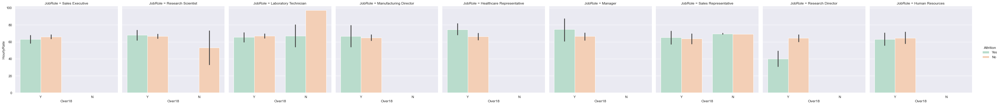

In [99]:
sb.catplot(x="Over18", y="HourlyRate", hue='Attrition',
                col="JobRole", data=employee, kind="bar", palette= "Pastel2")

There is no 18 year-old employee working in the Human Resources department. They are only working as either research scientists, laboratory technicians, or sales representatives. <br>
Here we observe that those employees aged 18 that are receiving a higher hourly rate than others are those working as sales representatives and laboratory technicians. <br>
Furthermore, these employees who are actually earning more than those older than them are the ones attiring. There is no employee retiring from being a research scientist even though they have a lower hourly rate. However, for laboratory technician, there is a very drastic difference in hourly rate between the one who is attiring and not attiring, thus it may be possible that the attiring employee left because they think that it is unfair. <br>
After plotting the same graph with y-axis of MonthlyIncome instead of HourlyRate, we found an even more interesting observation that may contradict the predictions made in this earlier paragraph.

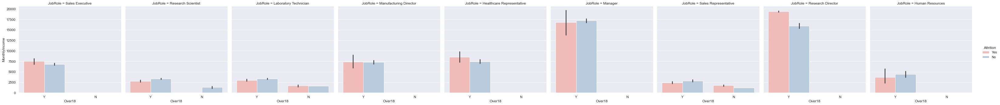

In [100]:
sb.catplot(x="Over18", y="MonthlyIncome", hue='Attrition',
                col="JobRole", data=employee, kind="bar", palette= "Pastel1")

The most important thing we find here is that a high hourly rate does not imply a high monthly income, in fact the results shown here are actually showing the opposite. <br>
Earlier we noticed that the employees aged 18 are having a higher hourly rate than those older than them. However, those employees are actually receiving a lower monthly income. Furthermore, 18 year-olds working as laboratory technician and sales representatives are attiring even though they have a higher monthly income than those not attiring. We assume that there are other factors causing these 18 years-old to attire.

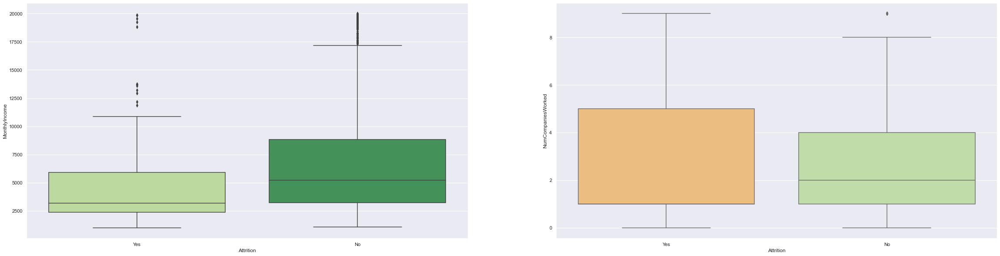

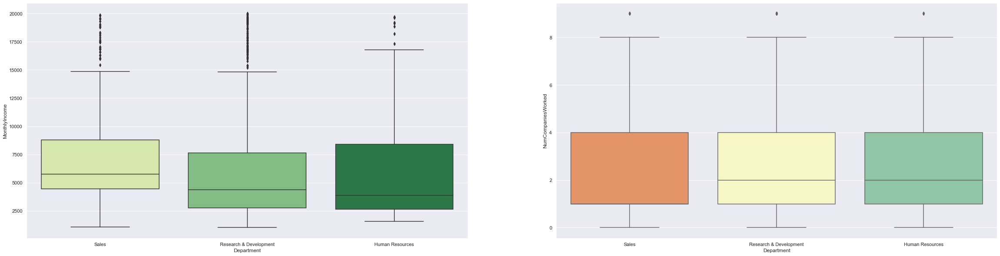

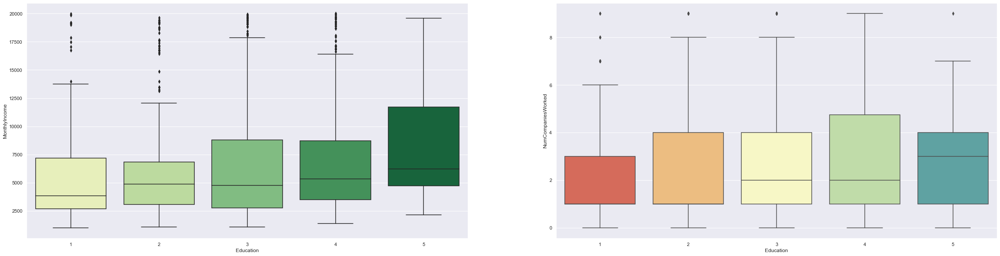

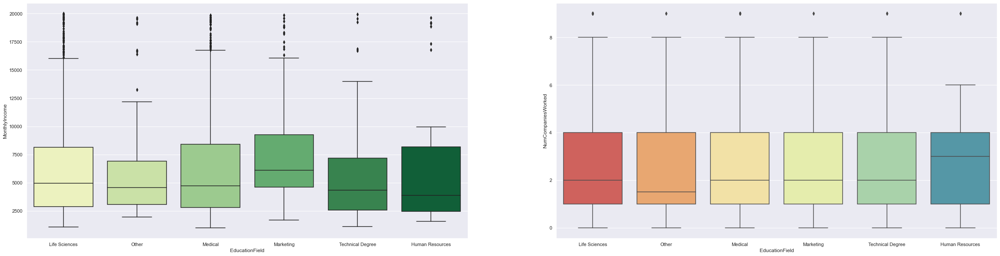

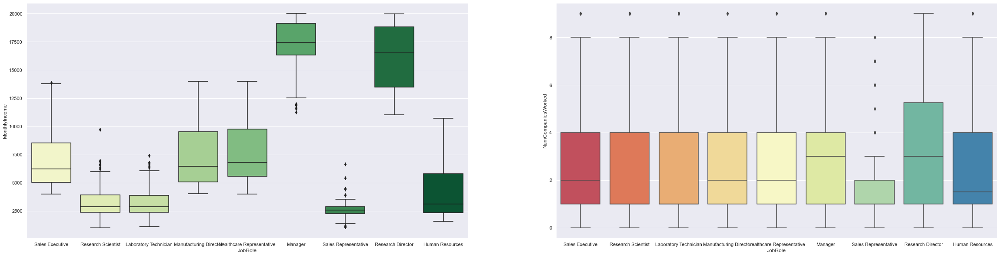

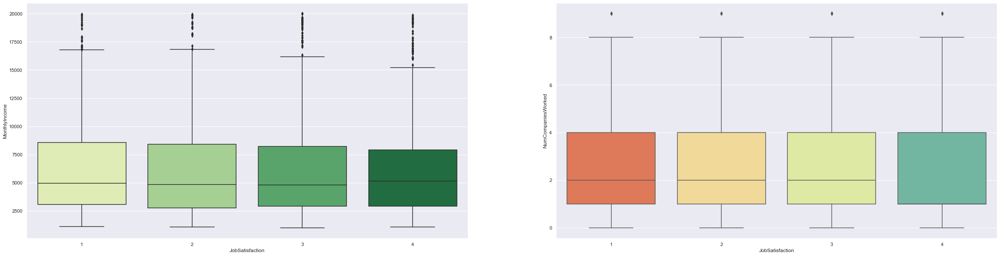

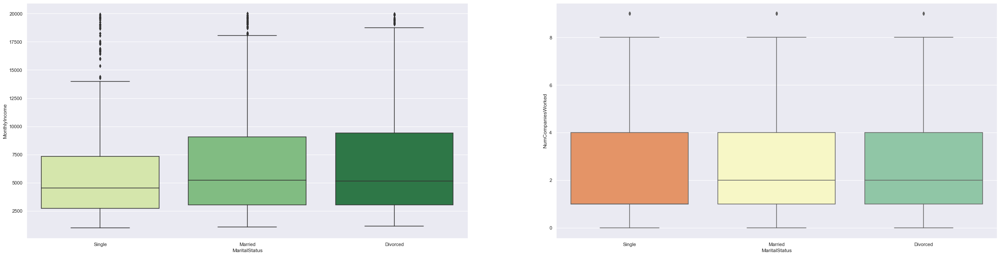

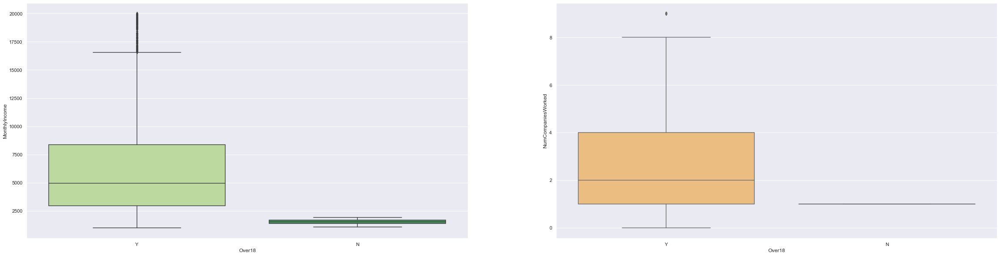

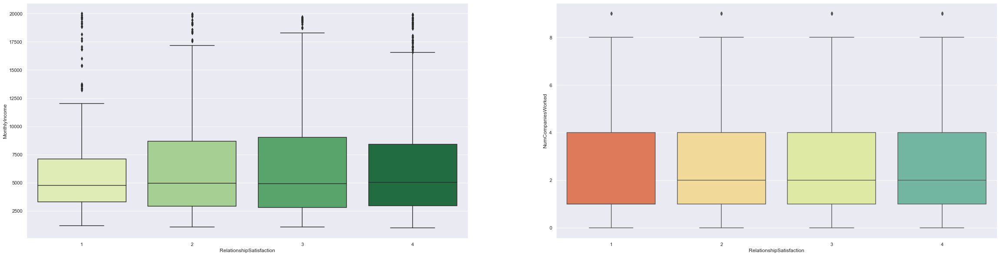

In [101]:
for var in cat_2:
    f, axes = plt.subplots(1,2, figsize=(40,10))
    sb.boxplot(x = var, y = 'MonthlyIncome', data = employee, ax=axes[0], palette="YlGn")
    sb.boxplot(x = var, y = 'NumCompaniesWorked', data = employee, ax=axes[1], palette="Spectral")

#### Monthly Income
seems to have some variation with:
1. Attrition <br><br>
2. Department <br>
Employees in the **Sales** department have a ***higher median monthly income*** than the other departments. <br>
Note that **Human Resources** both have the ***lowest hourly rate and monthly income***. <br><br>
3. Education <br>
**Doctorates** have the highest monthly income.<br>
***Small positive correlation*** between level of education and monthly income.<br><br>
4. Education Field <br>
Employees who studied **Marketing** have a higher median monthly income. <br>
Those who studied **Human Resources** still earn the least.<br><br>
5. JobRole <br>
Significant variance is observed! <br>
**Managers** have the ***highest*** monthly salary, followed by **Research Directors**. <br>
**Sales Representatives** have the ***lowest*** followed by **Research Scientist** and **Lab Technicians**, they are actually *lower than* **Human Resources**. <br>
Difference in income between managers and sales representatives is ***very high***!<br><br>
6. Over18 <br>
**18 years old** employees receive a ***much lower*** monthly income.<br>
**Note**:
This is weird because earlier they are actually receiving a higher hourly rate!
 
#### Number of Companies Worked
1. Majority of people **with attrition** worked in one company. 
<br>

2. All of the employees **aged 18** are working in their **first company**. <br>

**Note**<br>
There are points lying on the y-axis=0. <br>
What could this possibly mean? That they have not worked in a company before? <br>
If this is the case then employees aged 18 who has 0 total working years should also have number of companies worked as 0, but instead they have it as 1. <br>
Let us take a better look below:

In [102]:
zero= employee.loc[employee["NumCompaniesWorked"]==0]
zero.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,8,4,Male,79,3,1,Laboratory Technician,4,Single,3068,11864,0,Y,No,13,3,3,0,8,2,2,7,7,3,6
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,12,4,Male,44,2,3,Manufacturing Director,3,Single,9526,8787,0,Y,No,21,4,2,0,10,2,3,9,7,1,8
10,35,No,Travel_Rarely,809,Research & Development,16,3,Medical,14,1,Male,84,4,1,Laboratory Technician,2,Married,2426,16479,0,Y,No,13,3,3,1,6,5,3,5,4,0,3
11,29,No,Travel_Rarely,153,Research & Development,15,2,Life Sciences,15,4,Female,49,2,2,Laboratory Technician,3,Single,4193,12682,0,Y,Yes,12,3,4,0,10,3,3,9,5,0,8
13,34,No,Travel_Rarely,1346,Research & Development,19,2,Medical,18,2,Male,93,3,1,Laboratory Technician,4,Divorced,2661,8758,0,Y,No,11,3,3,1,3,2,3,2,2,1,2


In [103]:
zero["TotalWorkingYears"].value_counts()

6     34
10    27
4     23
5     15
3     14
9     13
8     11
7      8
21     7
12     7
16     5
2      4
14     3
23     3
17     3
11     2
1      2
13     2
15     2
19     2
20     2
22     2
34     2
37     1
25     1
28     1
38     1
Name: TotalWorkingYears, dtype: int64

In [104]:
zero["YearsAtCompany"].value_counts()

5     34
9     27
3     23
4     15
2     14
8     13
7     11
6      8
20     7
11     7
15     5
1      4
13     3
22     3
16     3
10     2
0      2
12     2
14     2
18     2
19     2
21     2
33     2
36     1
24     1
27     1
37     1
Name: YearsAtCompany, dtype: int64

This is interesting, the **count for TotalWorkingYears and YearsAtCompany are exactly the same**. The difference is found on the left column that represents the variety of total working years and years at company arranged in descending order of count. <br>
We can observe that for the first row of TotalWorkingYears and YearsAtCompany, the first column actually **defers by 1 year**. <br>
<br>
Total Working Years of 6 has 34 employees <br>
Years At Company of 5 also has 34 employees <br>
<br>
**This trend is observed until the very last row!**
<br>
If we assume that for every count in the second column, the employees are the same, what could 0 number of companies worked mean? Could this be a mismatched value? <br>
Every employee here have worked for n number of years, but they worked in the company for n-1 years. <br>
Meaning that there is 1 year where they must have worked somewhere else, most probably not for a company but like a part time job. Whatever job that may be, if those who are 18 years old have 0 total working years but they are counted as having worked in this current company, then the number of companies worked for the above case **should also be 1**. <br><br>
And so we will apply these changes to the dataset:

In [105]:
for i in range(len(employee)):
    if(employee.loc[i,"NumCompaniesWorked"]==0):
        employee.loc[i,"NumCompaniesWorked"]=1

In [106]:
employee["NumCompaniesWorked"].value_counts()

1    718
3    159
2    146
4    139
7     74
6     70
5     63
9     52
8     49
Name: NumCompaniesWorked, dtype: int64

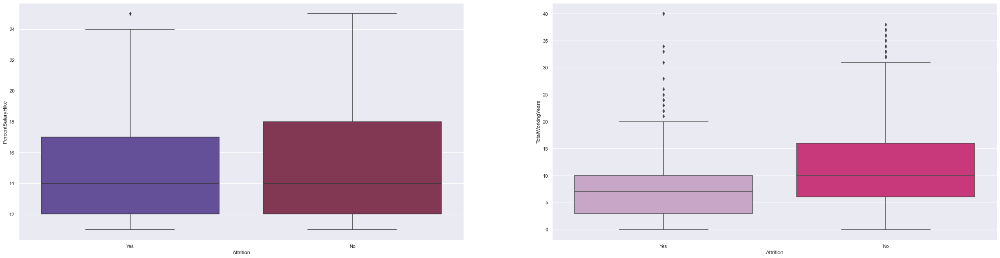

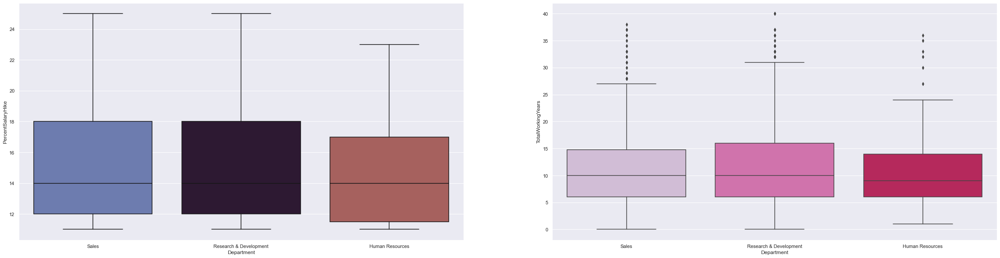

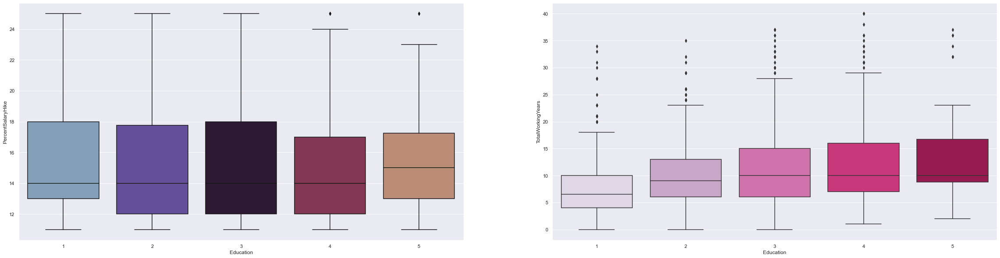

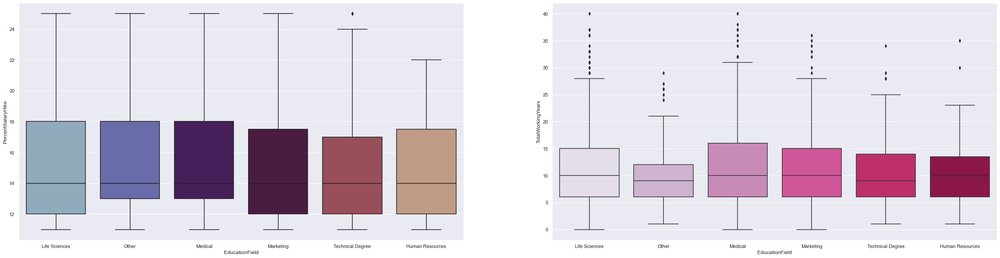

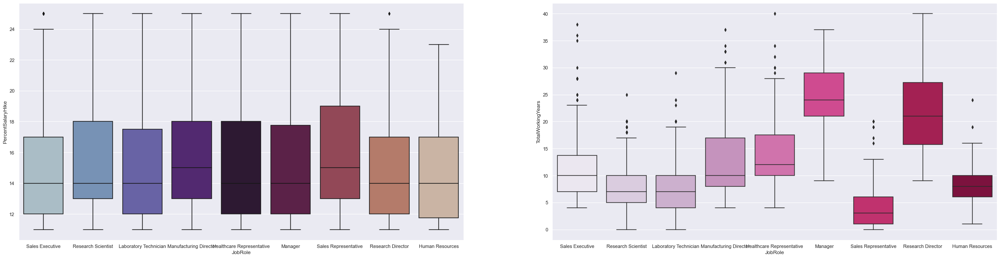

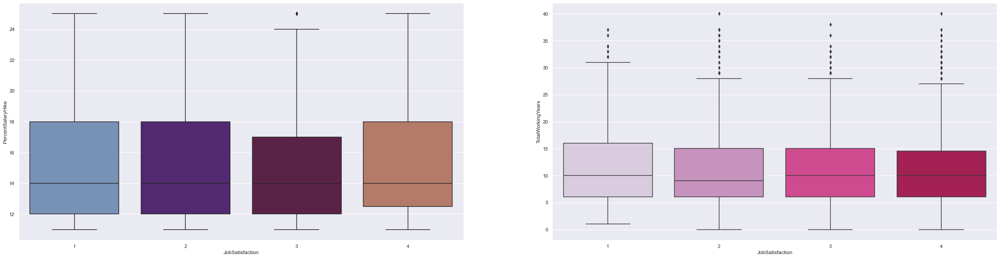

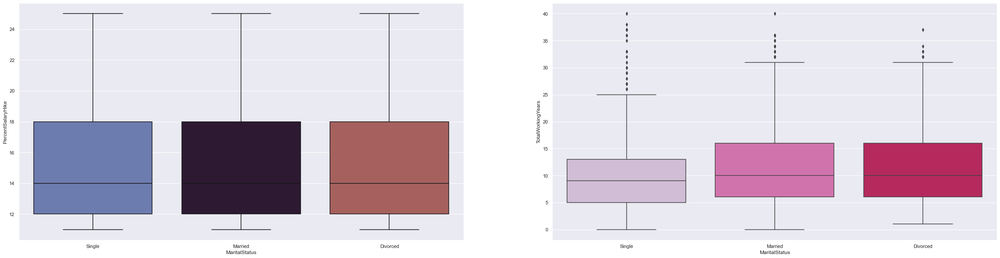

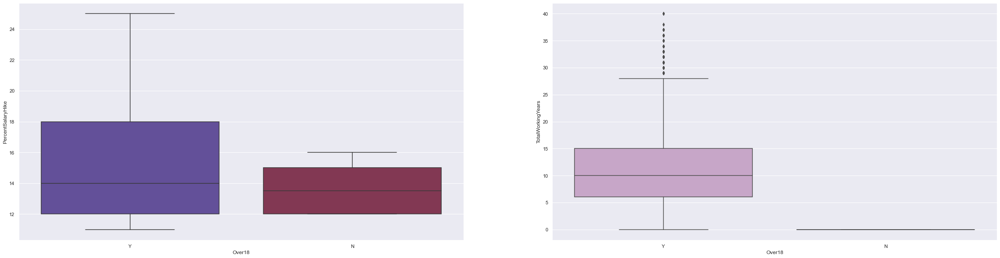

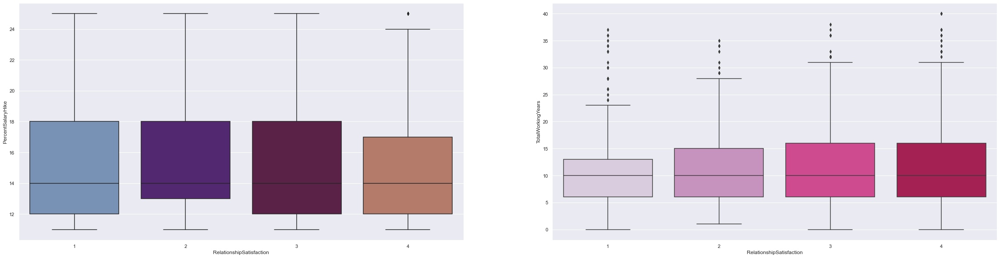

In [107]:
for var in cat_2:
    f, axes = plt.subplots(1,2, figsize=(40,10))
    sb.boxplot(x = var, y = 'PercentSalaryHike', data = employee, ax=axes[0], palette="twilight")
    sb.boxplot(x = var, y = 'TotalWorkingYears', data = employee, ax=axes[1], palette="PuRd")

#### Percent Salary Hike
seeems to have some variation with:
1. Education <br>
**Doctorates** seem to experience a slightly greater percent salary hike. <br><br>
2. Job Role <br>
**Sales Representative** has the ***highest median***, followed closely by **Manufacturing Director**. <br><br>
3. Over18 <br>
Employees **Over 18 years old** have a slightly higher percent salary hike.

#### Total Working Years
seems to have some variation with:
1. Attrition <br>
Employees **Without Attrition** have a much higher total working years. <br><br>
2. Education <br>
There is a **small positive correlation** between the two variables. <br>
The higher the level of education of an employee, the longer they tend to work. <br><br>
3. JobRole <br>
Significant variation! <br>
As expected, **Managers** have longer total working years, hence the most experience! <br>
Sales Representatives have the least. <br><br>
4. Over18 <br>
There is ***zero*** total working years for employees **aged 18**.<br>
Earlier, it was found that these employees are working in their first company. <br>
Thus it is safe to conclude that it has not been a year since they started working.

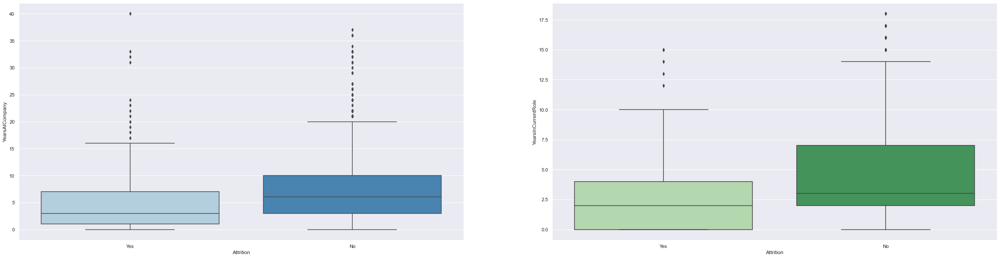

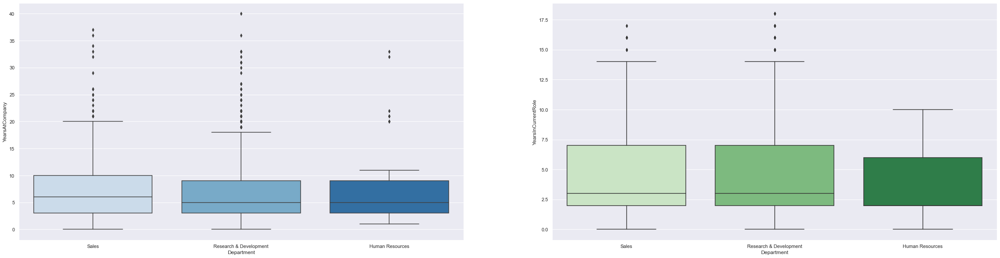

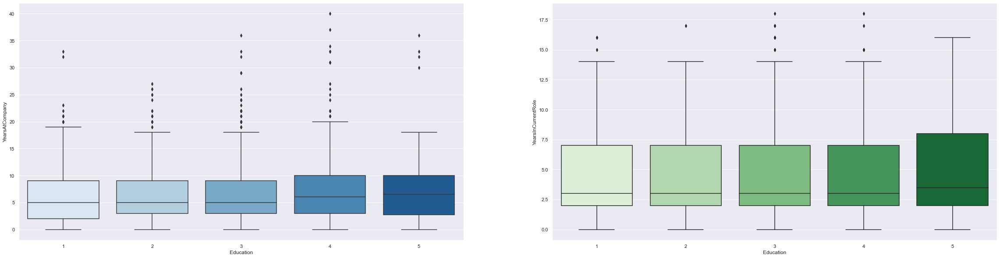

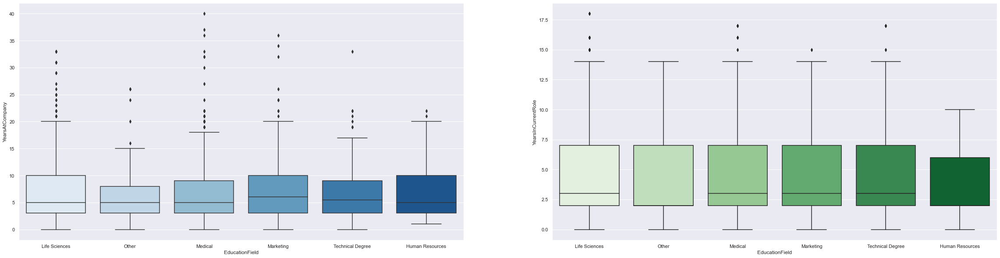

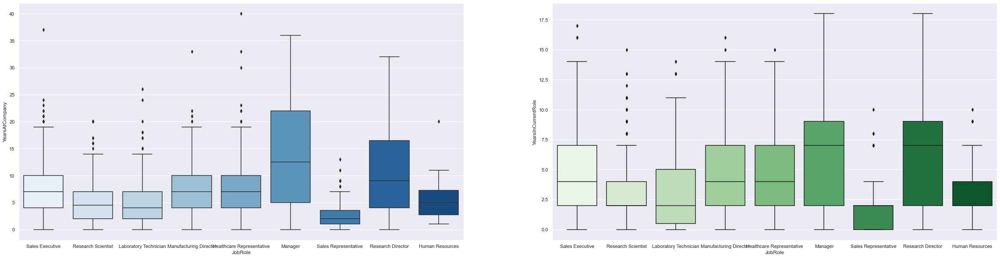

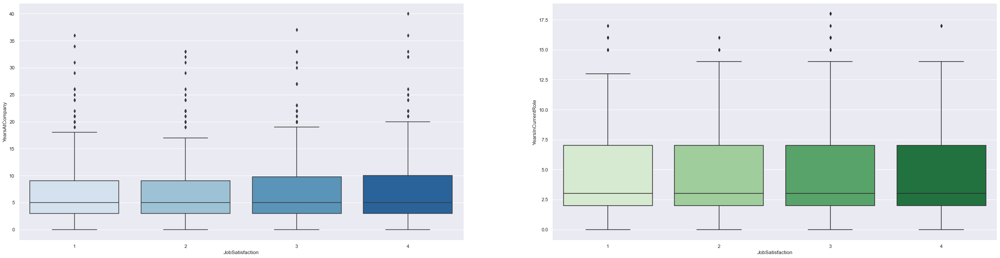

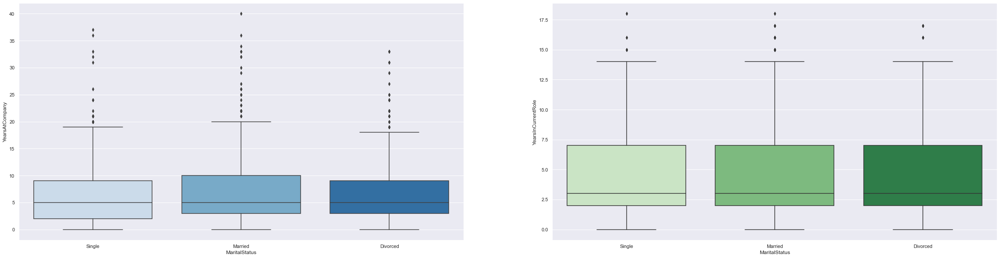

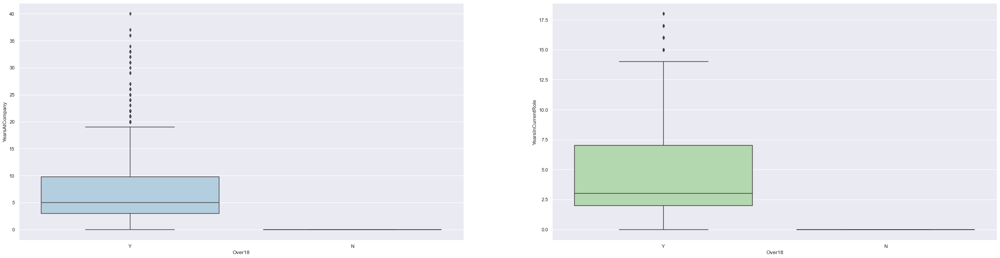

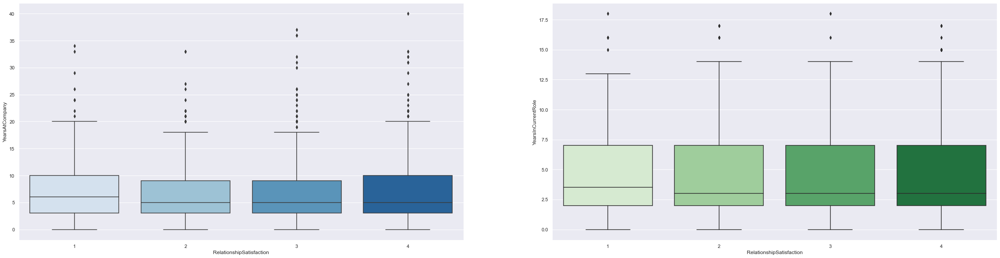

In [108]:
for var in cat_2:
    f, axes = plt.subplots(1,2, figsize=(40,10))
    sb.boxplot(x = var, y = 'YearsAtCompany', data = employee, ax=axes[0], palette="Blues")
    sb.boxplot(x = var, y = 'YearsInCurrentRole', data = employee, ax=axes[1], palette="Greens")

#### Years at Company
seems to have some variation with:
1. Attrition <br>
2. JobRole <br>
Not surprising, **Managers** have the ***longest*** years worked at company. <br>
**Sales Representatives** actually have the lowest, and this is consistent with the result from total working years. <br>
Maybe employees that are aged 18 are starting off as sales representatives (*this assumption will be confirmed in the separate section*)

#### Years in Current Role
seems to have some variation with:
1. Attrition
2. Department<br>
Employees from **Human Resources** seem to have lower years in current role. <br><br>
3. JobRole <br>
A lot of variation! <br>
**Managers and Research Directors** have the same box plot, hence they have the most experience in current role. <br>
The median of **Sales Representative** fall on zero years. As we know, the only employees that have zero working years are actually employees who are **aged 18**, thus this is also leading to the same conclusion as above.

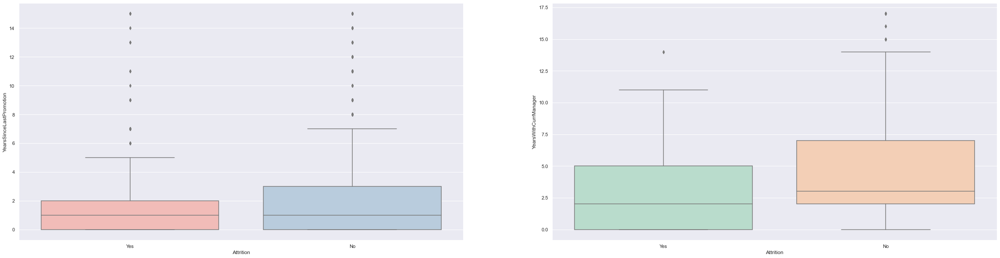

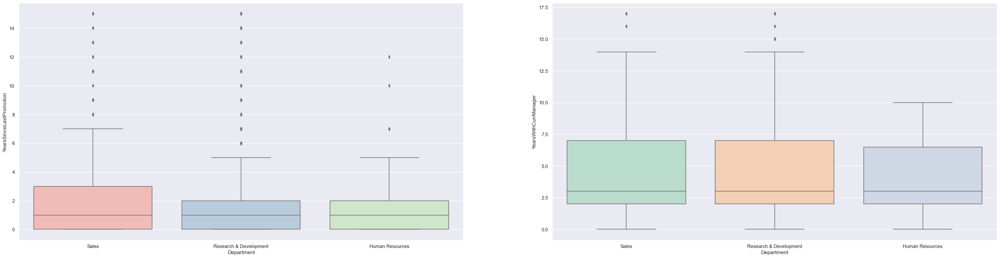

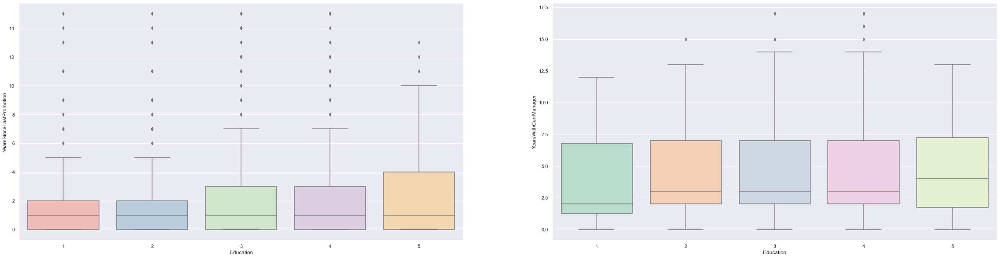

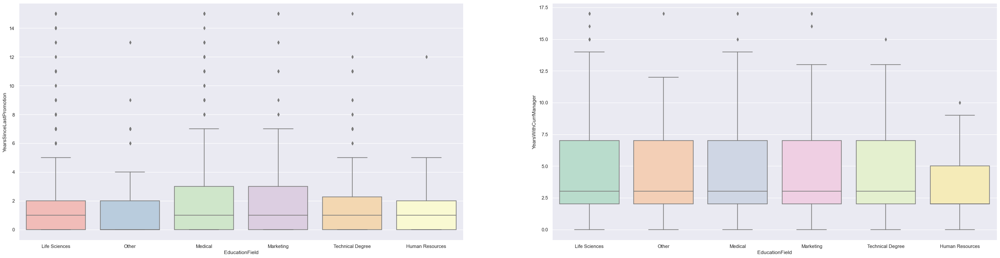

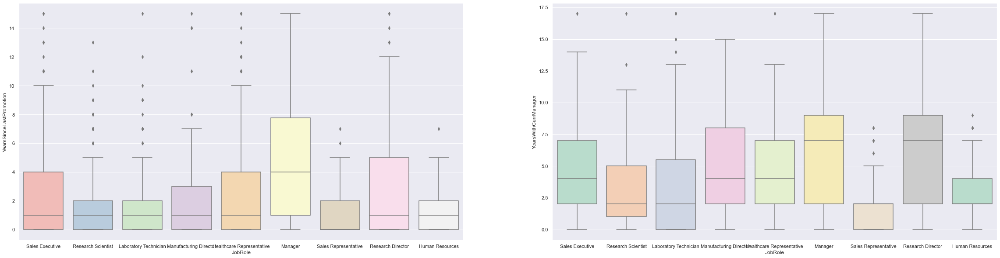

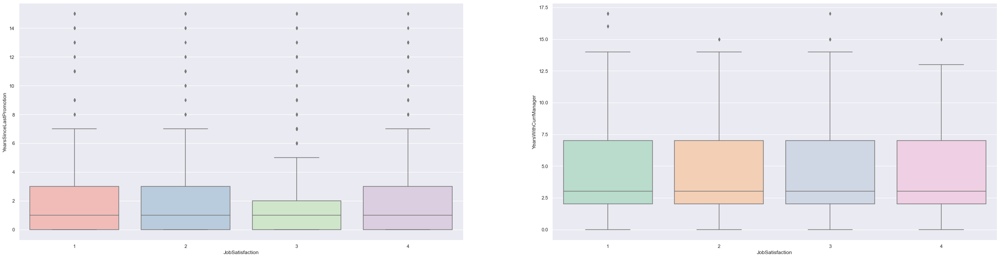

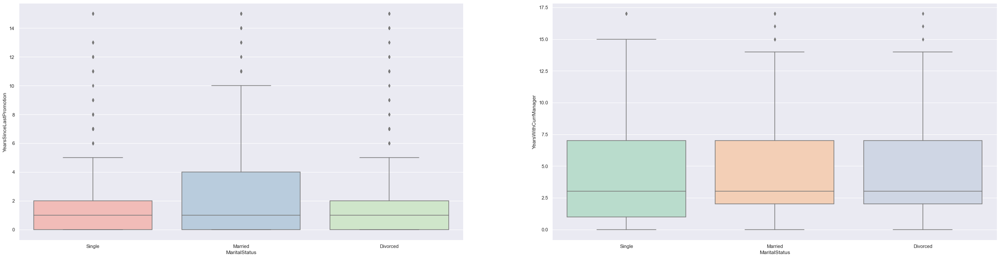

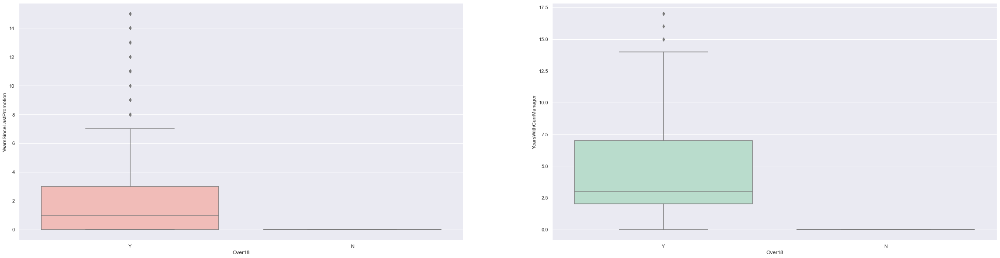

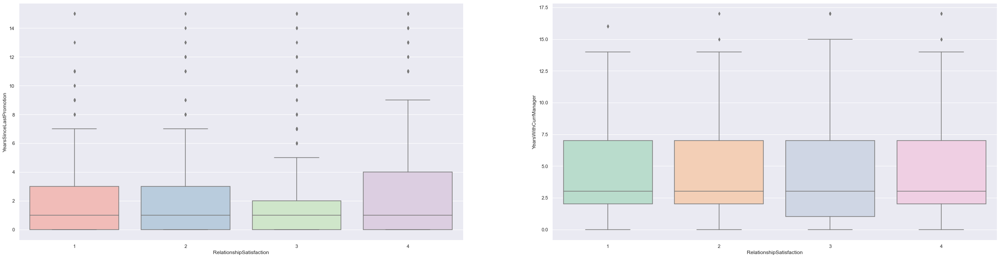

In [109]:
for var in cat_2:
    f, axes = plt.subplots(1,2, figsize=(40,10))
    sb.boxplot(x = var, y = 'YearsSinceLastPromotion', data = employee, ax=axes[0], palette="Pastel1")
    sb.boxplot(x = var, y = 'YearsWithCurrManager', data = employee, ax=axes[1], palette="Pastel2")

#### Years Since Last Promotion
seems to have some variation with:
1. JobRole <br>
**Managers** have the highest median because it is already the highest role to be achieved. 

#### Years with Current Manager
seems to have some variation with:
1. Attrition <br>
Employees **without attrition** have higher years with current manager. <br><br>
2. Education <br>
Employees **below college (education level 1)** have the lowest years with current manager. <br>
The median here may be lower because it includes the employees aged 18 who have just started working in the company.

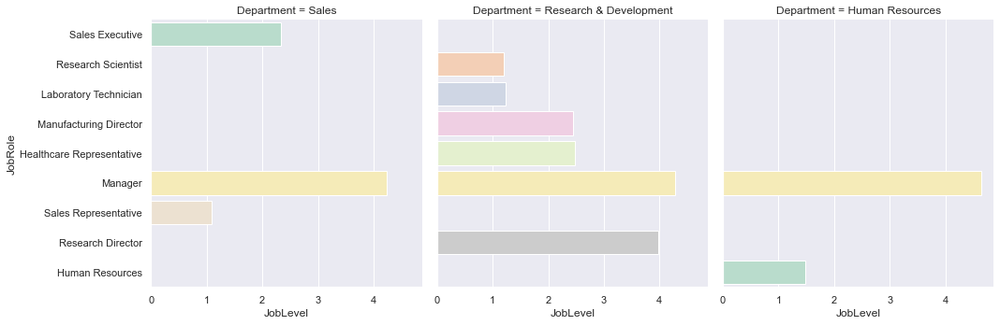

In [111]:
sb.catplot(x="JobLevel", y="JobRole", 
                col="Department", data=employee, kind="bar", palette= "Pastel2", ci=None)

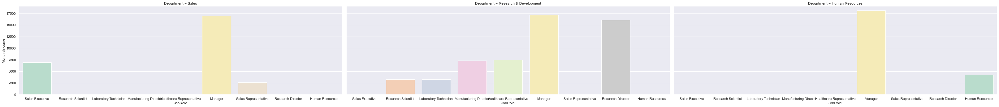

In [311]:
sb.catplot(x="JobRole", y="MonthlyIncome", 
                col="Department", data=employee, kind="bar", palette= "Pastel2", ci=None, aspect=3)

This barchart shows the distribution of job roles in each department and their respective monthly income. <br>
As mentioned earlier, managers are receiving the most, followed by research director. <br>
There are managers for every department and the least number of different job role is in Human Resources department.

##### Categorical Part 2

In [312]:
cat_1=pd.DataFrame(employee[["BusinessTravel","EnvironmentSatisfaction","Gender","JobInvolvement",
"JobLevel","PerformanceRating","OverTime","WorkLifeBalance","StockOptionLevel"]])

In [313]:
f,axes=plt.subplots(126,1,figsize=(20,800))
count=0
for var in cat_1:
    for i in num_data:
        sb.boxplot(data=employee,x=i,y=var,ax=axes[count],orient='h')
        count+=1

### Trends JobInvolvement
* **Job Involvement increases with age**
* **Higher Job Involvement** implies **higher Daily Rate** and **higher Hourly rate**
* Monthly Income has a weird trend and at JobInvolvement= 2 there is a higher income compared to others
* At JobInvolement= 1 and 4, we see that the NumOfCompaniesWorked are less 
* Percent Salary Hike has a weird trend
* JobInvolvement is higher if YearsfromLastPromotion is less
* JobInvolvement is more if YearsWithCurrentManager is not too high or too low

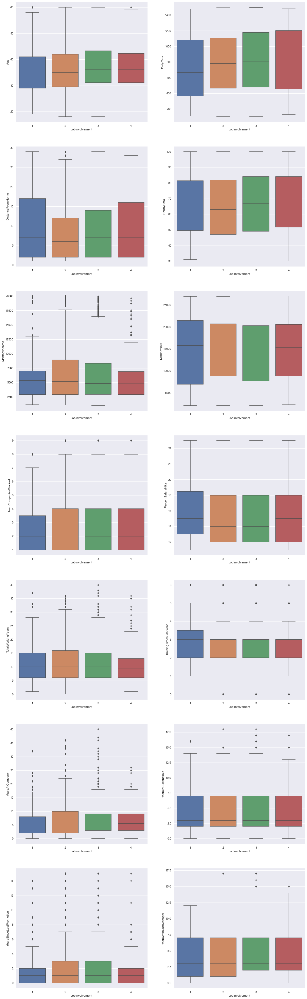

In [314]:
f,axes=plt.subplots(7,2,figsize=(20,70))
count=0

for i in num_data:
    sb.boxplot(data=employee,y=i,x="JobInvolvement",ax=axes[count//2][count%2])
    count+=1

### Trends Gender
* Average age of females in professional job is higher than Male, and from swarmplot we see we have comparatively less females working in low age than males. There are more in middle-age.
* Daily Rate, Monthly Rate , Monthly Income is almost the same but the median of male is a little lower than females for all, it may be because of the higher number of male employees in the data.
* Other variables do not show any significant difference

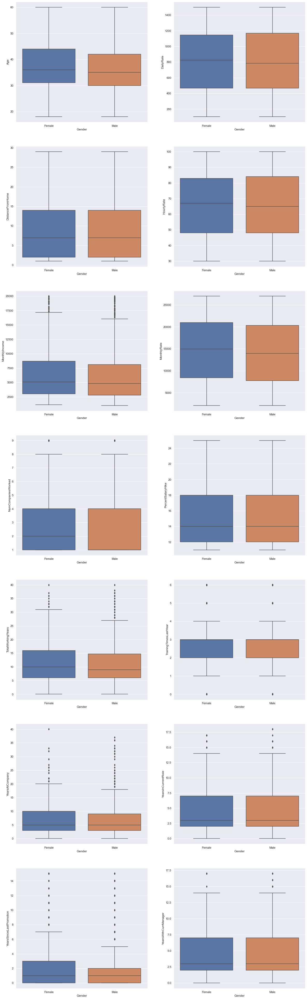

In [113]:
f,axes=plt.subplots(7,2,figsize=(20,70))
count=0

for i in num_data:
    sb.boxplot(data=employee,y=i,x="Gender",ax=axes[count//2][count%2])
    count+=1

### Trend JobLevel
* Clear trend that older employees are more likely to be in higher JobLvels
* Daily rate, Hourly rate, Monthly Rate has weird trend
* We see distancefromhome has significantly less employees with JobLevel=5
* Monthly Income shows clear trend of higher income with higher JobLevel
* PercentSalaryHike in salary is low for high JobLevel
* Total Working years is high for high JobLevel
* High JobLevel implies the employee has worked more year at the same company

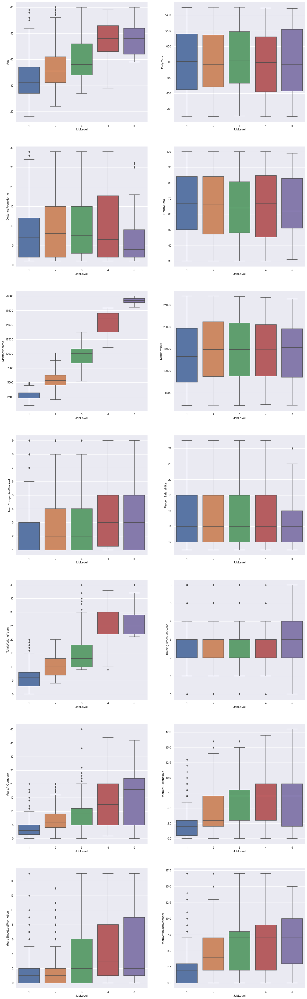

In [114]:
f,axes=plt.subplots(7,2,figsize=(20,70))
count=0

for i in num_data:
    sb.boxplot(data=employee,y=i,x="JobLevel",ax=axes[count//2][count%2])
    count+=1

In [115]:
employee["JobLevel"].value_counts()

1    543
2    534
3    218
4    106
5     69
Name: JobLevel, dtype: int64

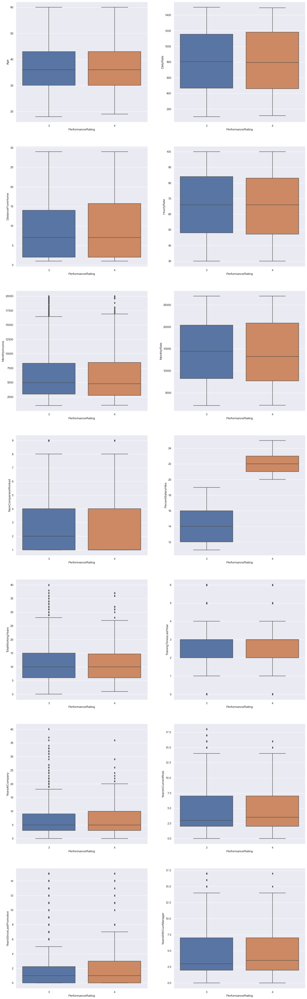

In [116]:
f,axes=plt.subplots(7,2,figsize=(20,70))
count=0

for i in num_data:
    sb.boxplot(data=employee,y=i,x="PerformanceRating",ax=axes[count//2][count%2])
    count+=1

### Trend:
* Main trend is **employee with PerformanceRating= 3** have a **lower PercentageSalaryHike** compared to those with Rating= 4

## Now we are going to move into machine learning, <br>
Angelin:

## 1. Attrition
##### What does it mean?
Attrition is the gradual reduction of a workforce as employees leave or retire. <br>
Most employers want a low attrition rate because it means that employees are satisfied and they don't have to train new people.
<br> 
Employee attrition is a situation that occurs when there is a reduction in the number of staff members over time, owing to certain unavoidable reasons. Employees may resign from work due to retirement or other personal reasons. <br>

Source: <br>
https://talenx.io/2020/06/18/what-is-employee-attrition/ <br>
and <br>
https://www.betterteam.com/what-is-attrition#:~:text=Attrition%20is%20the%20gradual%20reduction%20of%20a%20workforce,and%20they%20don%27t%20have%20to%20train%20new%20people.

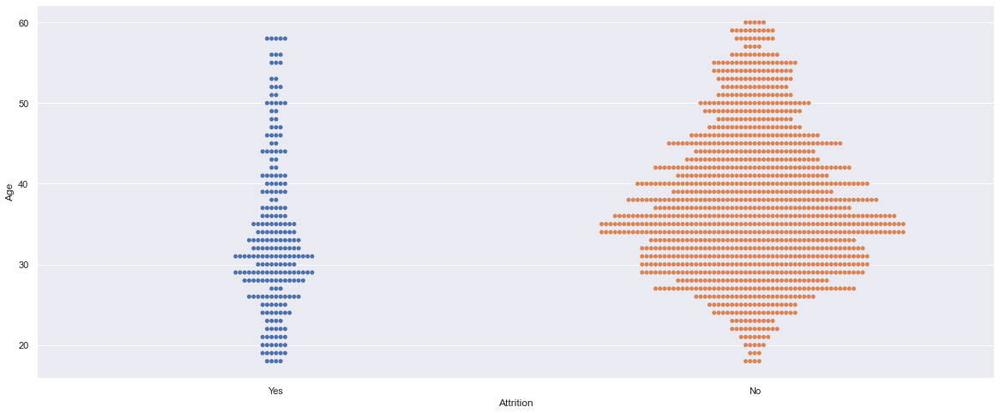

In [117]:
f = plt.figure(figsize=(20, 8))
sb.swarmplot(x = 'Attrition', y = 'Age', data = employee)

There seems to be more **younger people with attrition**. <br>
This means that retirement is not the main reason for attrition. <br>
Then what may be other possible reasons for attrition?
<br><br>
According to a blog posted by Mahidhar Reddy,
Source: https://www.linkedin.com/pulse/top-5-reasons-employee-attrition-how-deal-mahidhar-reddy <br>
the top factors for attrition are listed below:<br>
1. Money (other companies may be willing to pay more)
2. Quality of Work (mismatches between employees' capabilities and actual work)
3. Performance Pressure (pressured by high performing co-workers and demanding manager)
4. Friends (friend group may influence job change)
5. Location (company may be too far)<br>
<br>

We shall look into variables related to these factors.

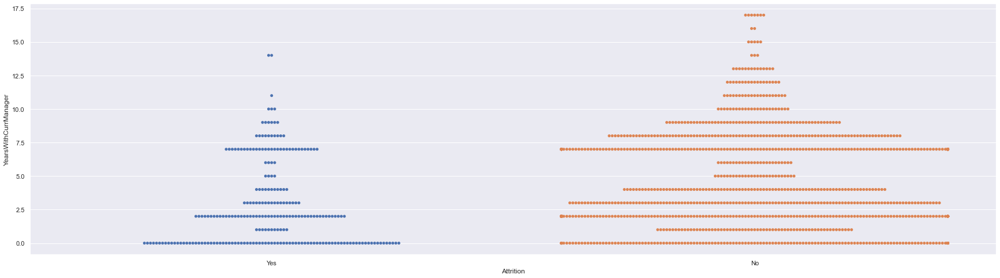

In [118]:
f = plt.figure(figsize=(30, 8))
sb.swarmplot(x = 'Attrition', y = 'YearsWithCurrManager', data = employee)

There are actually more people with attrition who have not spent one year with the current manager, <br>
and recall that previously we have also found that a large number of people with attrition are working in their first company. <br>
From this information, performance pressure may not be the main cause for attrition, instead our hypothesis is that people are probably just looking for other job opportunities. This hypothesis will be investigated below.

### Attrition and Count plot

In [119]:
attrition= employee.loc[employee["Attrition"]=='Yes']
attrition.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,0,8,0,1,6,4,0,5
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,0,7,3,3,0,0,0,0
14,28,Yes,Travel_Rarely,103,Research & Development,24,3,Life Sciences,19,3,Male,50,2,1,Laboratory Technician,3,Single,2028,12947,5,Y,Yes,14,3,2,0,6,4,3,4,2,0,3
21,36,Yes,Travel_Rarely,1218,Sales,9,4,Life Sciences,27,3,Male,82,2,1,Sales Representative,1,Single,3407,6986,7,Y,No,23,4,2,0,10,4,3,5,3,0,3
24,34,Yes,Travel_Rarely,699,Research & Development,6,1,Medical,31,2,Male,83,3,1,Research Scientist,1,Single,2960,17102,2,Y,No,11,3,3,0,8,2,3,4,2,1,3


<Figure size 360x360 with 0 Axes>

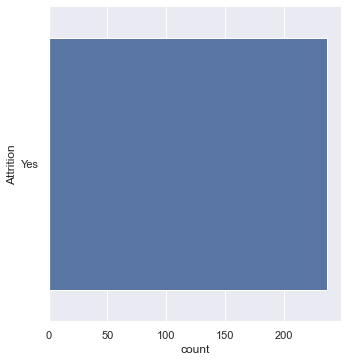

<Figure size 360x360 with 0 Axes>

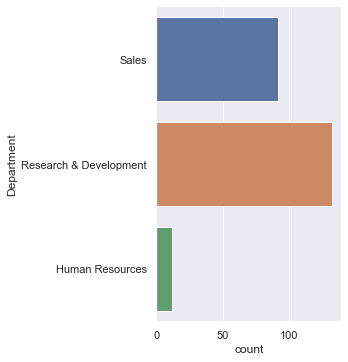

<Figure size 360x360 with 0 Axes>

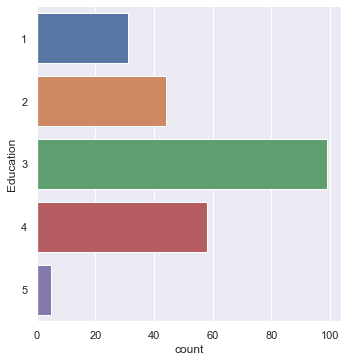

<Figure size 360x360 with 0 Axes>

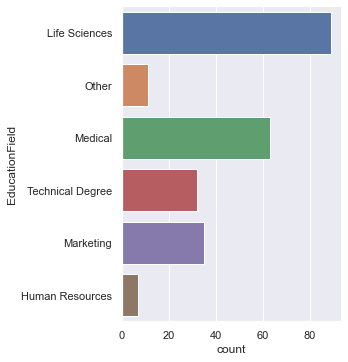

<Figure size 360x360 with 0 Axes>

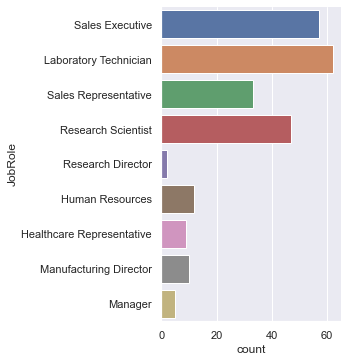

<Figure size 360x360 with 0 Axes>

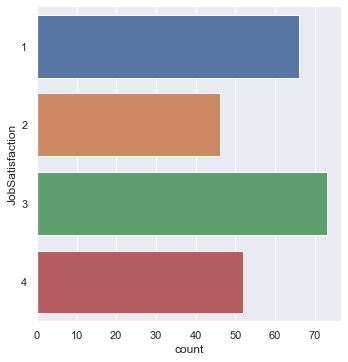

<Figure size 360x360 with 0 Axes>

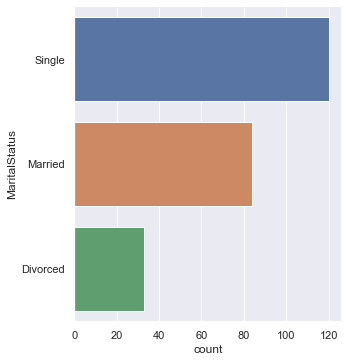

<Figure size 360x360 with 0 Axes>

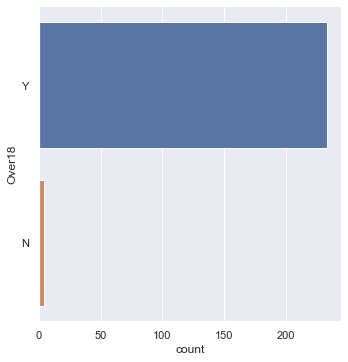

<Figure size 360x360 with 0 Axes>

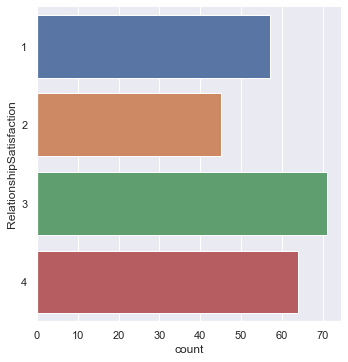

In [120]:
for var in cat_2:
    f = plt.figure(figsize=(5, 5))
    sb.catplot(y = var, data = attrition, kind = "count", height = 5)

Most of the people with attrition have the following similarities:
1. From **Research & Development** department, followed by **Sales** and lastly Human Resources 
2. Have an Education level of 3 (**Bachelor**)
3. Graduated from **Life Sciences**
4. Are currently working as **Lab Technicians** / **Research Scientist** / **Sales Representative**
5. Have a **Job Satisfaction of 3**, followed by **1 (least satisfied)**

Notes:<br>
It seems that it is least likely for research directors and managers to have attrition, <br>
probably because they are receiving the highest monthly income and highest job level possible. <br>
A possible reason for managers/research directors with attrition may be retirement as most of them are older than the other employees.

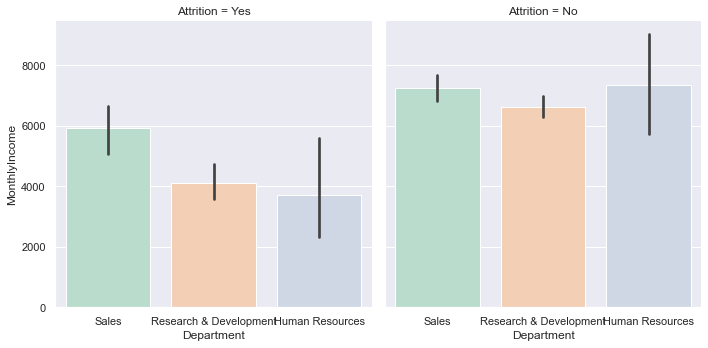

In [121]:
sb.catplot(x="Department", y="MonthlyIncome",
                col="Attrition", data=employee, kind="bar", palette= "Pastel2")

From this barplot, we observe that those with attrition are receiving a lower monthly income than those without attrition. <br>
In addition, among employees without attrition, those from human resources department are earning more than sales and research. However among those with attrition, monthly income for human resources is the lowest. <br><br>

With just barplots and boxplots alone, our prediction may not be accurate because the height or size of the plots may be affected by the number of employees corresponding to that category (ex. there are very few employees without attrition, hence there may be bias in the boxplots) <br>
Therefore we decided to create a random forest for a better classification accuracy of people with and without attrition. <br>
The first step is to encode the numerical variables and then balancing.

### OneHotEncoding <br>
Angelin and Pratham:

In [122]:
categorical.head()

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime,Education,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,PerformanceRating,RelationshipSatisfaction,WorkLifeBalance,JobLevel,StockOptionLevel
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes,2,2,3,4,3,1,1,2,0
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No,1,3,2,2,4,4,3,2,1
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes,2,4,2,3,3,2,3,1,0
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes,4,4,3,3,3,3,3,1,0
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No,1,1,3,2,3,4,3,1,1


In [123]:
for i in range(len(categorical)):
    if(categorical.loc[i, "OverTime"]=="No"):
        categorical.loc[i,"OverTime"]=0
    else:
        categorical.loc[i,"OverTime"]=1

In [124]:
for i in range(len(categorical)):
    if(categorical.loc[i,"Gender"]=="Male"):
        categorical.loc[i,"Gender"]=1
    else:
        categorical.loc[i,"Gender"]=0

In [125]:
for i in range(len(categorical)):
    if(categorical.loc[i,"Over18"]=="Y"):
        categorical.loc[i,"Over18"]=1
    else:
        categorical.loc[i,"Over18"]=0

In [126]:
for i in range(len(categorical)):
    if(categorical.loc[i,"PerformanceRating"]==4):
        categorical.loc[i,"PerformanceRating"]=1
    else:
        categorical.loc[i,"PerformanceRating"]=0

In [127]:
for i in range(len(categorical)):
    if(categorical.loc[i,"Attrition"]=="Yes"):
        categorical.loc[i,"Attrition"]=1
    else:
        categorical.loc[i,"Attrition"]=0

In [128]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder()

# OneHotEncoding of categorical predictors (not the response)
encoded_data = categorical[['BusinessTravel','Department', 'EducationField','JobRole', 'MaritalStatus']]
ohe.fit(encoded_data)
encoded_data_ohe = pd.DataFrame(ohe.transform(encoded_data).toarray(), 
                                  columns=ohe.get_feature_names(encoded_data.columns))

# Check the encoded variables
encoded_data_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 24 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   BusinessTravel_Non-Travel          1470 non-null   float64
 1   BusinessTravel_Travel_Frequently   1470 non-null   float64
 2   BusinessTravel_Travel_Rarely       1470 non-null   float64
 3   Department_Human Resources         1470 non-null   float64
 4   Department_Research & Development  1470 non-null   float64
 5   Department_Sales                   1470 non-null   float64
 6   EducationField_Human Resources     1470 non-null   float64
 7   EducationField_Life Sciences       1470 non-null   float64
 8   EducationField_Marketing           1470 non-null   float64
 9   EducationField_Medical             1470 non-null   float64
 10  EducationField_Other               1470 non-null   float64
 11  EducationField_Technical Degree    1470 non-null   float

In [129]:
rest=categorical.copy()

In [130]:
rest.drop(columns=['BusinessTravel','Department', 'EducationField','JobRole', 'MaritalStatus'],inplace=True)

In [131]:
rest.head()

,Attrition,Gender,Over18,OverTime,Education,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,PerformanceRating,RelationshipSatisfaction,WorkLifeBalance,JobLevel,StockOptionLevel
0,1,0,1,1,2,2,3,4,0,1,1,2,0
1,0,1,1,0,1,3,2,2,1,4,3,2,1
2,1,1,1,1,2,4,2,3,0,2,3,1,0
3,0,0,1,1,4,4,3,3,0,3,3,1,0
4,0,1,1,0,1,1,3,2,0,4,3,1,1


In [132]:
final=pd.concat([num_data,rest,encoded_data_ohe],axis=1)
final.shape

(1470, 51)

In [133]:
pd.set_option('display.max_columns', None)
final.head()

,Age,DailyRate,DistanceFromHome,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,Gender,Over18,OverTime,Education,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,PerformanceRating,RelationshipSatisfaction,WorkLifeBalance,JobLevel,StockOptionLevel,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,41,1102,1,94,5993,19479,8,11,8,0,6,4,0,5,1,0,1,1,2,2,3,4,0,1,1,2,0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,49,279,8,61,5130,24907,1,23,10,3,10,7,1,7,0,1,1,0,1,3,2,2,1,4,3,2,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,37,1373,2,92,2090,2396,6,15,7,3,0,0,0,0,1,1,1,1,2,4,2,3,0,2,3,1,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,33,1392,3,56,2909,23159,1,11,8,3,8,7,3,0,0,0,1,1,4,4,3,3,0,3,3,1,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,27,591,2,40,3468,16632,9,12,6,3,2,2,2,2,0,1,1,0,1,1,3,2,0,4,3,1,1,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [134]:
final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 51 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                1470 non-null   int64  
 1   DailyRate                          1470 non-null   int64  
 2   DistanceFromHome                   1470 non-null   int64  
 3   HourlyRate                         1470 non-null   int64  
 4   MonthlyIncome                      1470 non-null   int64  
 5   MonthlyRate                        1470 non-null   int64  
 6   NumCompaniesWorked                 1470 non-null   int64  
 7   PercentSalaryHike                  1470 non-null   int64  
 8   TotalWorkingYears                  1470 non-null   int64  
 9   TrainingTimesLastYear              1470 non-null   int64  
 10  YearsAtCompany                     1470 non-null   int64  
 11  YearsInCurrentRole                 1470 non-null   int64

In [135]:
for var in ["Attrition", "Gender", "Over18", "OverTime"]:
    final[var]= final[var].astype('int')

In [136]:
final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 51 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                1470 non-null   int64  
 1   DailyRate                          1470 non-null   int64  
 2   DistanceFromHome                   1470 non-null   int64  
 3   HourlyRate                         1470 non-null   int64  
 4   MonthlyIncome                      1470 non-null   int64  
 5   MonthlyRate                        1470 non-null   int64  
 6   NumCompaniesWorked                 1470 non-null   int64  
 7   PercentSalaryHike                  1470 non-null   int64  
 8   TotalWorkingYears                  1470 non-null   int64  
 9   TrainingTimesLastYear              1470 non-null   int64  
 10  YearsAtCompany                     1470 non-null   int64  
 11  YearsInCurrentRole                 1470 non-null   int64

In [137]:
att= employee.loc[employee["Attrition"]=="Yes"]

In [138]:
no_att= employee.loc[employee["Attrition"]=="No"]

In [139]:
y = pd.DataFrame(final['Attrition'])
X = pd.DataFrame(final.drop(columns=['Attrition']))

In [140]:
y.shape

(1470, 1)

In [141]:
X.shape

(1470, 50)

## Correlation with Attrition <br>
Angelin:

In [142]:
final.drop('Attrition', axis=1).corrwith(final.Attrition).sort_values()

TotalWorkingYears                   -0.171063
JobLevel                            -0.169105
YearsInCurrentRole                  -0.160545
MonthlyIncome                       -0.159840
Age                                 -0.159205
YearsWithCurrManager                -0.156199
StockOptionLevel                    -0.137145
YearsAtCompany                      -0.134392
JobInvolvement                      -0.130016
JobSatisfaction                     -0.103481
EnvironmentSatisfaction             -0.103369
MaritalStatus_Married               -0.090984
JobRole_Research Director           -0.088870
MaritalStatus_Divorced              -0.087716
Department_Research & Development   -0.085293
JobRole_Manager                     -0.083316
JobRole_Manufacturing Director      -0.082994
JobRole_Healthcare Representative   -0.078696
BusinessTravel_Non-Travel           -0.074457
Over18                              -0.068147
WorkLifeBalance                     -0.063939
TrainingTimesLastYear             

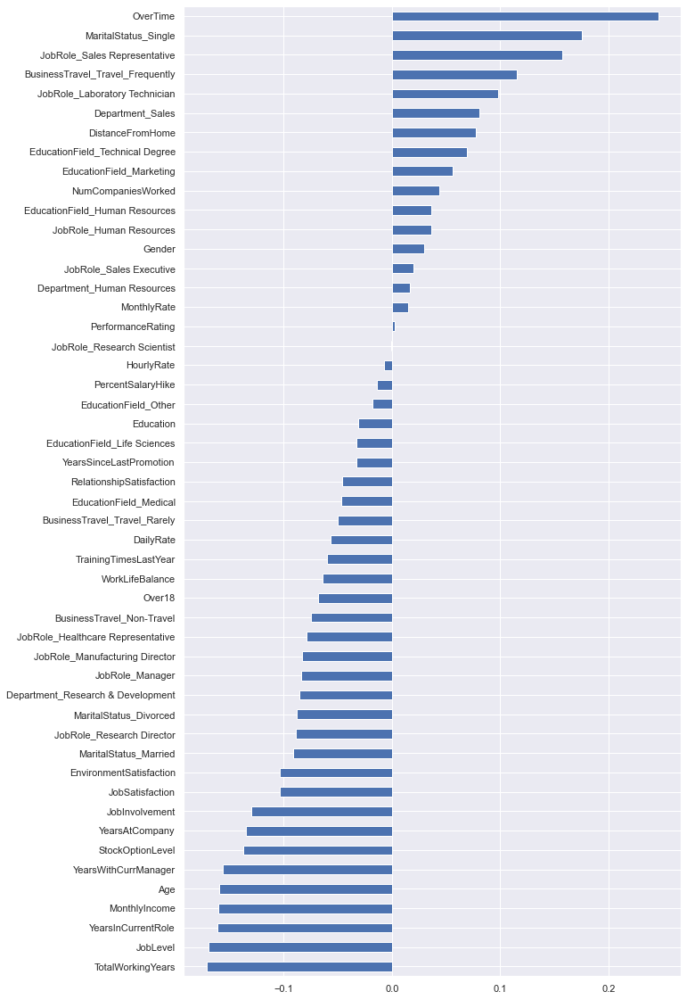

In [143]:
final.drop('Attrition', axis=1).corrwith(final.Attrition).sort_values().plot(kind= 'barh', figsize=(10,20))

According to the plot, the following variables have a significant correlation with atrition: <br>
*variables are chosen based on correlation less than -0.12 and greater than 0.12*
1. OverTime
2. MaritalStatus_Single
3. TotalWorkingYears  
4. JobLevel              
5. YearsInCurrentRole        
6. MonthlyIncome   
7. Age   
8. JobRole_SalesRepresentative   
9. YearsWithCurrManager   
10. StockOptionLevel  
11. YearsAtCompany  
12. JobInvolvement  

*variables are arranged in descending order, ignoring the positive negative sign* <br>
Now let us comfirm these variables by plotting a decision tree!

## Plotting a Classification Decision Tree to predict attrition <br>
Angelin:

In [144]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state= 1)
dectree = DecisionTreeClassifier(max_depth = 3)  
dectree.fit(X_train, y_train)                   

DecisionTreeClassifier(max_depth=3)

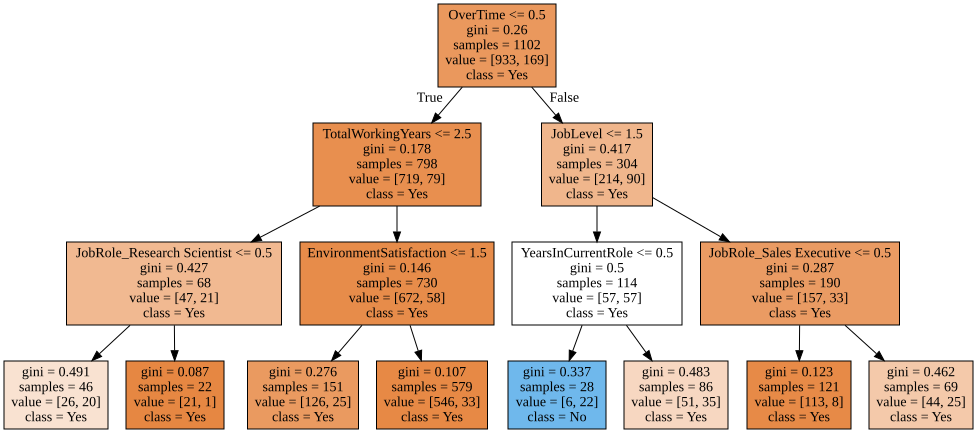

In [145]:
treedot= export_graphviz(dectree,
          feature_names= X_train.columns,
          out_file=None,
          filled=True,
          class_names=["Yes","No"])

import graphviz                  
graphviz.Source(treedot)                 

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.8611615245009074

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.8260869565217391



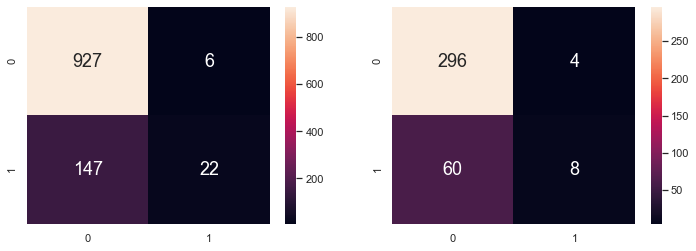

In [146]:
# Predict Legendary values corresponding to Total
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

As we have found in our exploratory data analysis section when we plotted a countplot for Attrition, the dataset is imbalanced.
Here the correlation matrix also shows that it is very imbalanced (leaning to the left), meaning that there are more chances of predicting a negative outcome. Those who actually have attrition are being classified as having no attrition (false negative). <br>
Therefore we must balance the tree to have a higher chance of classifying the employees correctly. <br>

### Balancing

In [147]:
no= final[final["Attrition"]==0]
yes= final[final["Attrition"]==1]
from sklearn.utils import resample

dataN_upsample= resample(yes, n_samples= no.shape[0])
data_upsample= pd.concat([no, dataN_upsample])

data_upsample.shape

(2466, 51)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7306652244456463

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7374392220421394



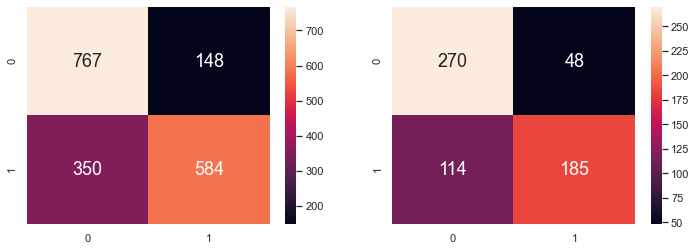

In [148]:
y = pd.DataFrame(data_upsample['Attrition'])
X = pd.DataFrame(data_upsample.drop(columns=['Attrition']))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state= 1)


dectree = DecisionTreeClassifier(max_depth = 3)  
dectree.fit(X_train, y_train)                   

y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

Now the tree is more balanced and we can move on to our random forest. <br>
In order to have the most ideal number of trees and depth, we use GridSearchCV

In [149]:
from sklearn.ensemble import RandomForestClassifier

param_grid= {
    'n_estimators': np.arange(100, 250, 50),
    'max_depth': np.arange(2,8),
}

rforest = RandomForestClassifier()       

from sklearn.model_selection import GridSearchCV
CV_rfr= GridSearchCV(estimator= rforest, param_grid= param_grid)
CV_rfr.fit(X_train, y_train.Attrition.ravel())

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_depth': array([2, 3, 4, 5, 6, 7]),
                         'n_estimators': array([100, 150, 200])})

In [150]:
CV_rfr.best_params_

{'max_depth': 7, 'n_estimators': 150}

In [151]:
rforest = RandomForestClassifier(n_estimators = 100, max_depth = 7)       
rforest.fit(X_train, y_train.Attrition.ravel()) 

RandomForestClassifier(max_depth=7)

Train Data
Accuracy  :	 0.950784207679827

TPR Train :	 0.9336188436830836
TNR Train :	 0.9683060109289617

FPR Train :	 0.03169398907103825
FNR Train :	 0.06638115631691649


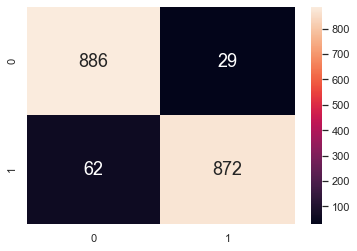

In [152]:
# Import confusion_matrix from Scikit-Learn
from sklearn.metrics import confusion_matrix

# Predict the Response corresponding to Predictors
y_train_pred = rforest.predict(X_train)

# Print the Classification Accuracy
print("Train Data")
print("Accuracy  :\t", rforest.score(X_train, y_train))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y_train, y_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

In [153]:
from sklearn.metrics import classification_report

print(classification_report(y_train, y_train_pred))
# precision – What percent of your predictions were correct?
# f1- What percent of positive predictions were correct?
# recall – What percent of the positive cases did you catch? 

              precision    recall  f1-score   support

           0       0.93      0.97      0.95       915
           1       0.97      0.93      0.95       934

    accuracy                           0.95      1849
   macro avg       0.95      0.95      0.95      1849
weighted avg       0.95      0.95      0.95      1849



Test Data
Accuracy  :	 0.9011345218800648

TPR Test :	 0.8929765886287625
TNR Test :	 0.9088050314465409

FPR Test :	 0.09119496855345911
FNR Test :	 0.10702341137123746


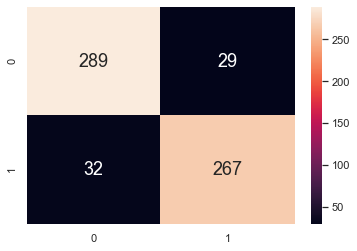

In [154]:
y_test_pred = rforest.predict(X_test)

print("Test Data")
print("Accuracy  :\t", rforest.score(X_test, y_test))
print()

cmtest = confusion_matrix(y_test, y_test_pred)
tptest = cmtest[1][1] # True Positives : Good (1) predicted Good (1)
fptest = cmtest[0][1] # False Positives : Bad (0) predicted Good (1)
tntest = cmtest[0][0] # True Negatives : Bad (0) predicted Bad (0)
fntest = cmtest[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Test :\t", (tptest/(tptest + fntest)))
print("TNR Test :\t", (tntest/(tntest + fptest)))
print()

print("FPR Test :\t", (fptest/(tntest + fptest)))
print("FNR Test :\t", (fntest/(tptest + fntest)))

sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

In this correlation matrix, we observe that we have a very high accuracy, with a high true positive and true negative rate. <br>
Meaning that we have a better chance of identifying the employees with and without attrition correctly.<br>

In [155]:
print(classification_report(y_test, y_test_pred))
# precision – What percent of your predictions were correct?
# f1- What percent of positive predictions were correct?
# recall – What percent of the positive cases did you catch? 

              precision    recall  f1-score   support

           0       0.90      0.91      0.90       318
           1       0.90      0.89      0.90       299

    accuracy                           0.90       617
   macro avg       0.90      0.90      0.90       617
weighted avg       0.90      0.90      0.90       617



Confusion matrix uses a fixed threshold of 0.5, <br>
how about we use a ROC curve to look for the best threshold? <br>
<br>
*threshold at 0.5 (default) means that it classifies everything above 0.5 as admitted and everything below 0.5 as not admitted*

In [156]:
import plotly.express as px
from sklearn.metrics import roc_curve, auc
y_trainscore = rforest.predict_proba(X_train)[:, 1]
fpr, tpr, thresholds = roc_curve(y_train, y_trainscore)
gmeans = np.sqrt(tpr * (1-fpr)) 

index = np.argmax(gmeans) #index of largest g-mean
print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[index], gmeans[index]))

Best Threshold=0.521287, G-Mean=0.953


Geometric mean is the measure of imbalanced classification <br>
An optimal G-Mean will look for a balance between sensitivity (recall) and specificity <br>
Sensitivity= True Positive Rate <br>
Specificity= 1- False Positive Rate<br>
<br>
Receiver Operating Characteristic curve (ROC) <br>
false-positive rate on the x-axis, true positive rate on the y-axis <br>
The diagonal, dashed line = no-skill (random) classifier (worse case 0.5), and a point in the top left (1.0) = perfect skill.

In [157]:
fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve for Train (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)

fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

In [158]:
from sklearn.metrics import roc_curve, auc
y_testscore = rforest.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_testscore)
fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve for Test (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

In [159]:
importances = rforest.feature_importances_
std = np.std([tree.feature_importances_ for tree in rforest.estimators_],
             axis=0)

Let us take a look at the important factors that determines attrition!

In [160]:
importance=pd.DataFrame()
importance['Predictors']=X.columns
importance['Importance']=std

In [161]:
importance

,Predictors,Importance
0,Age,0.037137
1,DailyRate,0.026758
2,DistanceFromHome,0.023812
3,HourlyRate,0.020417
4,MonthlyIncome,0.057328
5,MonthlyRate,0.018851
6,NumCompaniesWorked,0.022437
7,PercentSalaryHike,0.021951
8,TotalWorkingYears,0.046028
9,TrainingTimesLastYear,0.012576


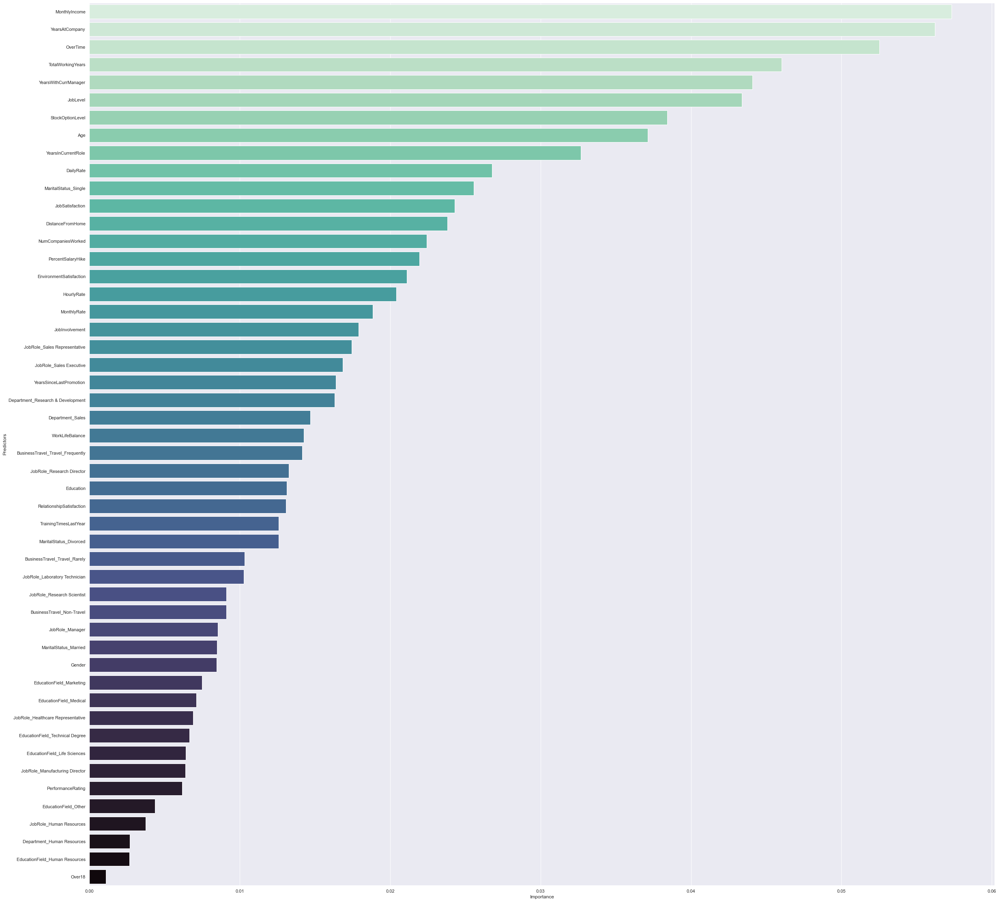

In [162]:
importance.sort_values(by=['Importance'], ascending=False,inplace=True)
f = plt.figure(figsize=(40, 40))
sb.barplot(x=importance["Importance"], y=importance["Predictors"], palette= "mako_r")

#### Variable Importance  (AFTER BALANCING)

1. Overtime
2. Monthly Income
3. Years At Company
4. Job Level
5. Age
6. Years In Current Role
7. Total Working Years
8. Stock Option Level
9. Years With Current Manager

These are the top factors affecting attrition. <br><br>
*Train Test Split has been fixed with random state of 1.<br>
Without random state, these 9 variables are still in the top 9 importance but may be in different ranks.<br>
(ex. Monthly Income may become more important than Overtime, but is still within the 9 ranks)*<br>
<br>
Let us now observe the correlation!

### 1. Attrition and Monthly Income

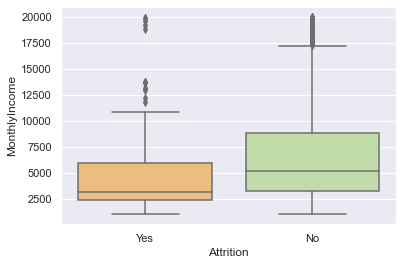

In [163]:
sb.boxplot(x = "Attrition", y = "MonthlyIncome", data = employee, palette='Spectral')

From the correlation plot earlier, the **correlation** with monthly income is also **negative**. <br>
Employees **with attrition** have **lower monthly income**. <br>
We predict that employees are leaving the company to look for better offers from other companies.

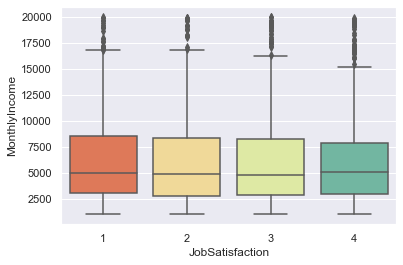

In [164]:
sb.boxplot(x = "JobSatisfaction", y = "MonthlyIncome", data = employee, palette='Spectral')

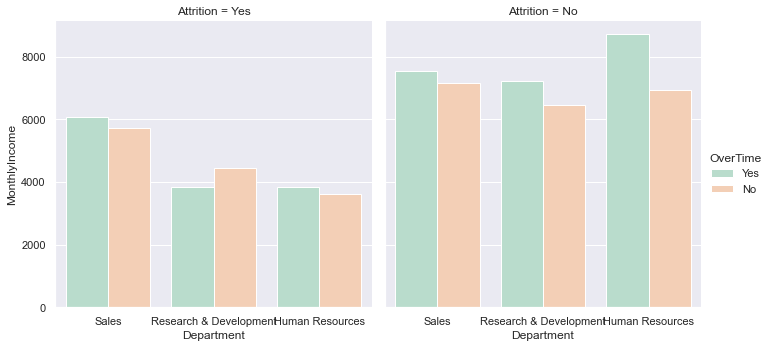

In [165]:
sb.catplot(x="Department", y="MonthlyIncome",hue='OverTime',
                col="Attrition", data=employee, kind="bar", palette= "Pastel2", ci=None)

Attired employees from Research department and working overtime are actually receiving less than those who are not working overtime. They may have felt it was unfair to be receiving less even after working overtime, hence they attire.

### 2. Attrition and Years With Current Manager

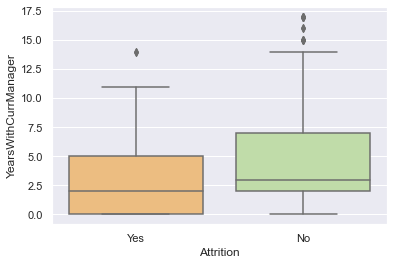

In [166]:
sb.boxplot(x = "Attrition", y = "YearsWithCurrManager", data = employee, palette='Spectral')

From the correlation plot earlier, the **correlation** with years with current manager is also **negative**. <br>
Employees **with attrition** have **lower years with current manager**.

### 3. Attrition and Total Working Years

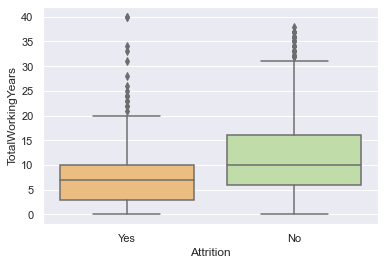

In [167]:
sb.boxplot(x = "Attrition", y = "TotalWorkingYears", data = employee, palette='Spectral')

From the correlation plot earlier, the **correlation** with total working years is also **negative**. <br>
Employees **with attrition** have **lower total working years**.

### 4. Attrition and Years At Company

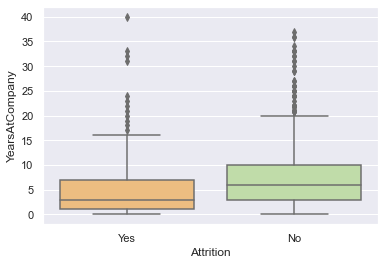

In [168]:
sb.boxplot(x = "Attrition", y = "YearsAtCompany", data = employee, palette='Spectral')

From the correlation plot earlier, the **correlation** with years at company is also **negative**. <br>
Employees **with attrition** have **lower working years at the company**. <br>
#2, #3, #4 all shows evidence that employees with less work experience are leaving the company. <br>
We believe that it is because the employees want to explore other job opportunities and different work environment.

### 5. Attrition and Job Level

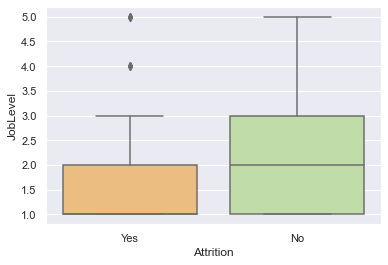

In [169]:
sb.boxplot(x = "Attrition", y = "JobLevel", data = employee, palette='Spectral')

From the correlation plot earlier, the **correlation** with job level is also **negative**. <br>
Employees with a **lower job level** are most likely to **attire**. <br>
This is probably because they are not satisfied with the position they are in now, and want to look for a company that may give them a promotion or better opportunities.

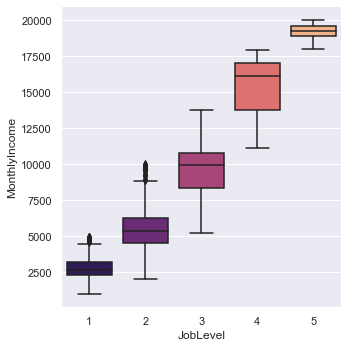

In [170]:
sb.catplot(x="JobLevel", y="MonthlyIncome", kind="box", data=employee, palette="magma", ci=None)

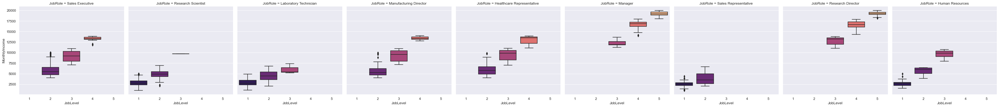

In [171]:
sb.catplot(x="JobLevel", y="MonthlyIncome", col= "JobRole", kind="box", data=employee, palette="magma", ci=None)

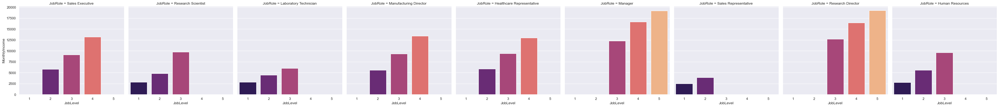

In [172]:
sb.catplot(x="JobLevel", y="MonthlyIncome", col= "JobRole", kind="bar", data=employee, palette="magma", ci=None)

##### Job Level
is the classification of authority and/or salary levels of positions in an organization. <br>
Ex. senior executives, executive, middle management, advisors, associate <br><br>
Each job role has different job levels. <br>
Ex. Senior Executive Manager or Executive Manager <br><br>
Different job levels have different monthly income.<br>
The higher your job level, the higher your monthly income. <br><br>
From the bar charts we can also see 4 hierarchy: <br>
Highest- Managers and Research Directors <br>
2nd- Sales Executive, Manufacturing Director, Healthcare Representative<br>
3rd- Research Scientist, Lab Technician, Human Resources

In [173]:
fig = px.box(employee, x="JobLevel", y="MonthlyIncome", points="all", color="Attrition")
fig.show()

**Difference in Median Monthly Income (Not Attiring - Attiring)** <br>
<br>

Job Level 1: <br>
2719-2437= 282 <br>
<br>
Job Level 2: <br>
5334.5-5346= -11.5<br>
<br>
Job Level 3: <br>
9.9825k-9.887k= 0.0955k= 95.9<br>
<br>
Job Level 4:<br>
16.307k-13.194k= 3113<br>
<br>
Job Level 5: <br>
19.1995k-19.545k= -0.3455k= -345.5

<br><br>
From this boxplot, we can see how every job level almost has a corresponding range of monthly income. <br>
The difference in median monthly income (No Attrition - Attrition ) is greatest for Job Level= 4 followed by Job Level= 1. <br>
A possible reason for high attrition rate at Job Level 1 may be that they feel it is unfair to be receiving a lower monthly income than others in the same job level. <br>
How about Job level 2 then? The monthly income for both are almost equal, so what could be the reason for them attiring? <br>
Also, if Job Level 4 has such a huge difference, why is the attrition rate low?

In [174]:
joblevel2= employee.loc[employee["JobLevel"]==2]

In [175]:
fig = px.box(joblevel2, x="JobRole", y="StockOptionLevel", color="Attrition", title= "Job Level 2 and Stock Options")
fig.show()

Even though those with Job Level 2 have nearly the same median monthly income, it turns out that for all the different Job Roles in this level, employees here with attrition have a lower median stock option level compared to those not attiring.

In [176]:
joblevel4= employee.loc[employee["JobLevel"]==4]

In [177]:
fig = px.box(joblevel4, x="StockOptionLevel", y="MonthlyIncome", points='all', color="Attrition", title= "Job Level 4")
fig.show()

Possible reason for low attrition in Job Level 4: <br>
Even though there is a huge gap in median monthly income, most of the employees there have a high monthly income that may compensate for a lower stock option level. The red, box for those with attrition have no stocks and  a much lower monthly income compared to the rest.

### 6. Attrition and Age

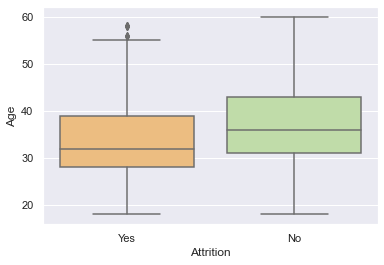

In [178]:
sb.boxplot(x = "Attrition", y = "Age", data = employee, palette='Spectral')

From the correlation plot earlier, the **correlation** with age is also **negative**. <br>
There are more **younger** people with **attrition**, meaning that retirement may not be a big influence to attirement. <br>
Younger employees may attire to explore better job opportunities until they find a company they are looking for.

### 7. Attrition and OverTime
##### using a Classification Decision Tree

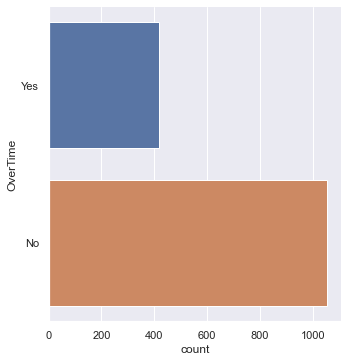

In [179]:
sb.catplot(y = 'OverTime', data = employee, kind = "count", height = 5)

In [180]:
no= final[final["OverTime"]==0]
yes= final[final["OverTime"]==1]
from sklearn.utils import resample

dataN_upsample= resample(yes, n_samples= no.shape[0])
data_upsample= pd.concat([no, dataN_upsample])

data_upsample.shape

(2108, 51)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6040480708412397

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5958254269449715



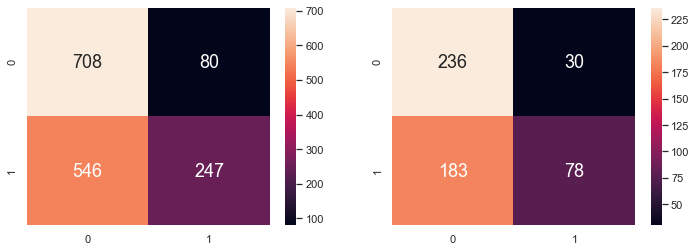

In [181]:
y = pd.DataFrame(data_upsample['OverTime'])
X = pd.DataFrame(data_upsample.drop(columns=['OverTime']))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state= 1)


dectree = DecisionTreeClassifier(max_depth = 1)  
dectree.fit(X_train, y_train)                   

y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [182]:
param_grid= {
    'n_estimators': np.arange(100, 250, 50),
    'max_depth': np.arange(2,8),
}

rforest = RandomForestClassifier()       

CV_rfr= GridSearchCV(estimator= rforest, param_grid= param_grid)
CV_rfr.fit(X_train, y_train.OverTime.ravel())

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_depth': array([2, 3, 4, 5, 6, 7]),
                         'n_estimators': array([100, 150, 200])})

In [183]:
CV_rfr.best_params_

{'max_depth': 7, 'n_estimators': 200}

In [184]:
rforest = RandomForestClassifier(n_estimators = 200, max_depth = 7)       
rforest.fit(X_train, y_train.OverTime.ravel()) 

RandomForestClassifier(max_depth=7, n_estimators=200)

Train Data
Accuracy  :	 0.9449715370018975

TPR Train :	 0.9331651954602774
TNR Train :	 0.9568527918781726

FPR Train :	 0.04314720812182741
FNR Train :	 0.06683480453972257


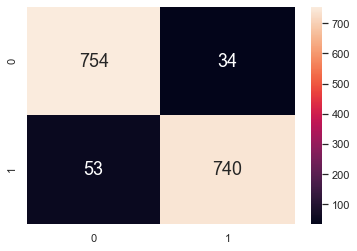

In [185]:
y_train_pred = rforest.predict(X_train)

print("Train Data")
print("Accuracy  :\t", rforest.score(X_train, y_train))
print()

cmTrain = confusion_matrix(y_train, y_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

In [186]:
importances = rforest.feature_importances_
std = np.std([tree.feature_importances_ for tree in rforest.estimators_],
             axis=0)

In [187]:
importance=pd.DataFrame()
importance['Predictors']=X.columns
importance['Importance']=std

In [188]:
importance

,Predictors,Importance
0,Age,0.029194
1,DailyRate,0.042319
2,DistanceFromHome,0.034421
3,HourlyRate,0.042565
4,MonthlyIncome,0.039185
5,MonthlyRate,0.038885
6,NumCompaniesWorked,0.025814
7,PercentSalaryHike,0.027820
8,TotalWorkingYears,0.028140
9,TrainingTimesLastYear,0.028135


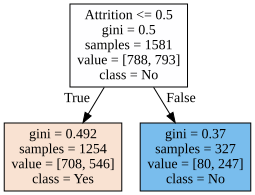

In [189]:
treedot= export_graphviz(dectree,
          feature_names= X_train.columns,
          out_file=None,
          filled=True,
          class_names=["Yes","No"])

import graphviz                  
graphviz.Source(treedot)                 

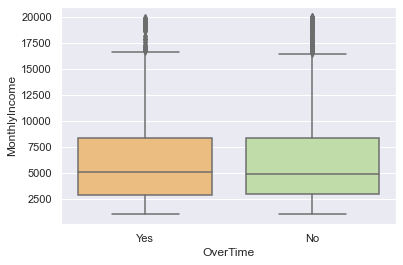

In [190]:
sb.boxplot(data=employee,y= 'MonthlyIncome',x="OverTime", palette= "Spectral")

Here we can observe that attrition is the most important variable, its importance value factor is even significantly higher than all the other variables. <br>
As we have found from the previous tree, overtime and attrition have a strong correlation with one another. <br>
From the correlation plot earlier, the **correlation** with overtime is **positive**. <br>
Employees **with attrition** are more likely those that **do not have overtime**. <br>
Possible reasons for this interesting finding may be that some employees want to work overtime to earn more but they don't see much of a difference in monthly income if they do. Or they want to work overtime but are not given the opportunity to as there are only limited allowance. Hence, employees may leave the company to look for other companies which allows them to work overtime and can earn much more by doing so.

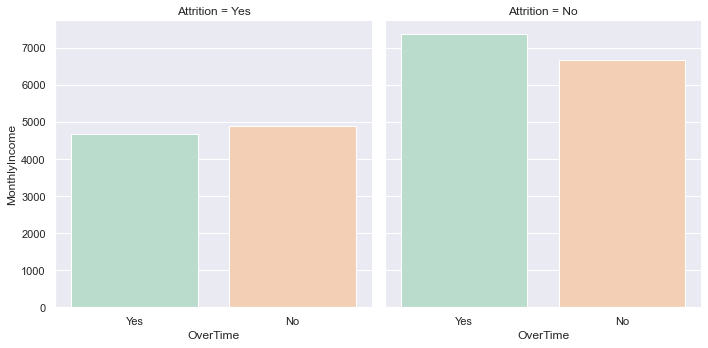

In [191]:
sb.catplot(x="OverTime", y="MonthlyIncome", col="Attrition", data=employee, kind="bar", palette= "Pastel2", ci=None, aspect= 1)

In [192]:
import plotly.express as px
noovertime= employee[employee["OverTime"]=="No"]

noovertime_level1 = noovertime[noovertime["JobLevel"]==1]
fig = px.box(noovertime_level1, x="JobInvolvement", y="MonthlyIncome", points='all', color="Attrition", title= "Job Level 1 Employees Not Working Overtime")
fig.show()

noovertime_level2 = noovertime[noovertime["JobLevel"]==2]
fig = px.box(noovertime_level2, x="JobInvolvement", y="MonthlyIncome", points='all', color="Attrition", title= "Job Level 2 Employees Not Working Overtime")
fig.show()

noovertime_level3 = noovertime[noovertime["JobLevel"]==3]
fig = px.box(noovertime_level3, x="JobInvolvement", y="MonthlyIncome", points='all', color="Attrition", title= "Job Level 3 Employees Not Working Overtime")
fig.show()

noovertime_level4 = noovertime[noovertime["JobLevel"]==4]
fig = px.box(noovertime_level4, x="JobInvolvement", y="MonthlyIncome", points='all', color="Attrition", title= "Job Level 4 Employees Not Working Overtime")
fig.show()

fig = px.box(employee, x="Attrition", y="JobSatisfaction", points='all', color="OverTime")
fig.show()


Employees without attrition, whether working overtime or not have a median job satisfaction at 3. <br>
<br>
However, those with attrition, have a different job satisfaction depending on whether or not they work overtime. <br>
Attiring employees not working overtime are actually less satisfied with their job than those working overtime. <br>
<br>
Reasons for dissatisfaction are as follows: <br>
In the box plot, we can see how job level 1 employees with attrition have a much lower median monthly income for every job involvement value.<br>
<br>
This could mean that attiring employees feel unfair because they are being paid less than people in the same job level who are also not working overtime and with the same job involvement.
<br>
This trend is observed for all the job levels.

### 8. Attrition and StockOptionLevel
##### using a Classification Decision Tree

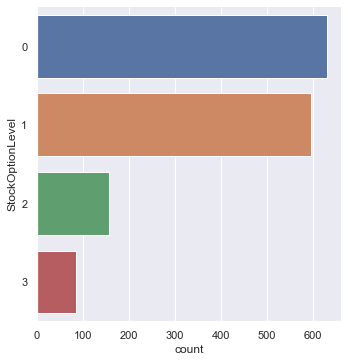

In [193]:
sb.catplot(y = 'StockOptionLevel', data = employee, kind = "count", height = 5)

In [194]:
stock= pd.get_dummies(final.StockOptionLevel, prefix= "Stock")

In [195]:
stock.head()

,Stock_0,Stock_1,Stock_2,Stock_3
0,1,0,0,0
1,0,1,0,0
2,1,0,0,0
3,1,0,0,0
4,0,1,0,0


In [196]:
final2= final.copy()
final2= pd.concat([final2, stock], axis=1)
del final2["StockOptionLevel"]
final2.head()

,Age,DailyRate,DistanceFromHome,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,Gender,Over18,OverTime,Education,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,PerformanceRating,RelationshipSatisfaction,WorkLifeBalance,JobLevel,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Stock_0,Stock_1,Stock_2,Stock_3
0,41,1102,1,94,5993,19479,8,11,8,0,6,4,0,5,1,0,1,1,2,2,3,4,0,1,1,2,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1,0,0,0
1,49,279,8,61,5130,24907,1,23,10,3,10,7,1,7,0,1,1,0,1,3,2,2,1,4,3,2,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0,1,0,0
2,37,1373,2,92,2090,2396,6,15,7,3,0,0,0,0,1,1,1,1,2,4,2,3,0,2,3,1,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0
3,33,1392,3,56,2909,23159,1,11,8,3,8,7,3,0,0,0,1,1,4,4,3,3,0,3,3,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1,0,0,0
4,27,591,2,40,3468,16632,9,12,6,3,2,2,2,2,0,1,1,0,1,1,3,2,0,4,3,1,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,1,0,0


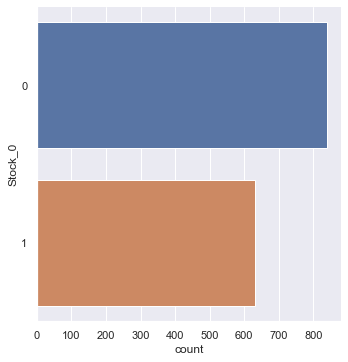

In [197]:
sb.catplot(y = 'Stock_0', data = final2, kind = "count", height = 5)

In [198]:
withstock= final2[final2["Stock_0"]==0]
nostock= final2[final2["Stock_0"]==1]
from sklearn.utils import resample

dataN_upsample= resample(withstock, n_samples= nostock.shape[0])
data_upsample= pd.concat([nostock, dataN_upsample])

data_upsample.shape

(1262, 54)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.5486257928118393

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5791139240506329



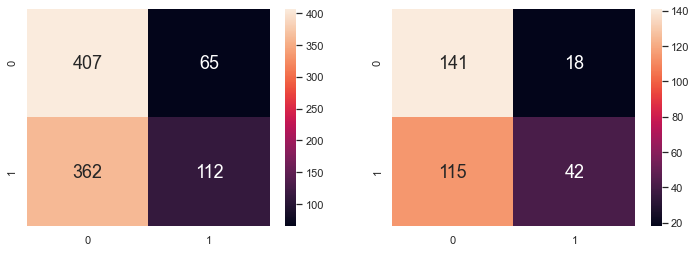

In [199]:
y = pd.DataFrame(data_upsample['Stock_0'])
X = pd.DataFrame(data_upsample['Attrition'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state= 1)


dectree = DecisionTreeClassifier(max_depth = 2)  
dectree.fit(X_train, y_train)                   

y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

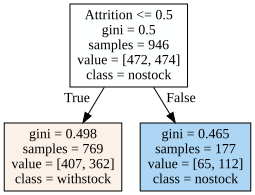

In [200]:
treedot= export_graphviz(dectree,
          feature_names= X_train.columns,
          out_file=None,
          filled=True,
          class_names=["withstock","nostock"])

import graphviz                  
graphviz.Source(treedot)                 

Employees **with attrition** are most likely those **without any stock option**. <br>
Stock options are usually used to reward well-performing employees or as an incentive for employees to stay in the company and perform better. <br>
We predict that employees without stock option may feel unappreciated when they are not issued the stock option and may look for other companies that will reward them. Or, if they were issued but they refused to, maybe they think that other companies may have offered them  a job with better stock options.

In [201]:
employee["StockOptionLevel"].value_counts()

0    631
1    596
2    158
3     85
Name: StockOptionLevel, dtype: int64

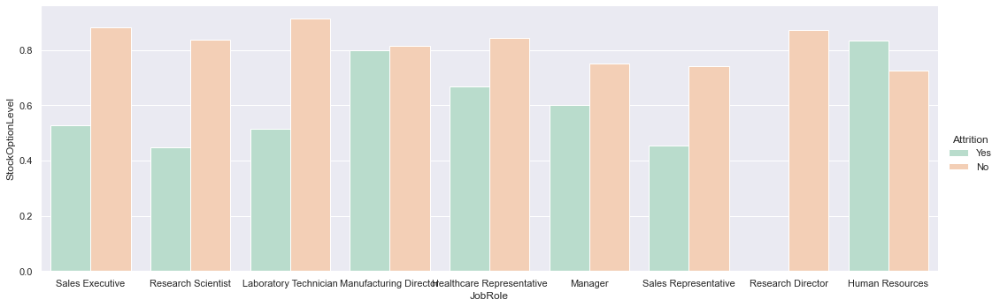

In [202]:
sb.catplot(x="JobRole", y="StockOptionLevel", hue= 'Attrition', data=employee, kind="bar", palette= "Pastel2", ci=None, aspect= 3)

For every job role except Human Resources, there seems to be a trend where employees with attrition are those that have a lower stock level compared to those without attrition. <br>
Once again, employees might be attiring because they have a lower stock option level than other employees of the same role.

### 9. Attrition and Years in Current Role

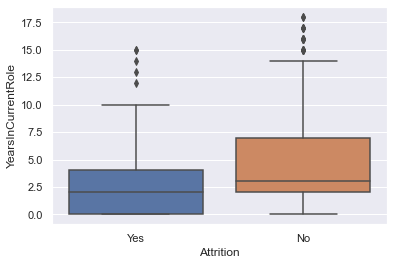

In [203]:
sb.boxplot(x = "Attrition", y = "YearsInCurrentRole", data = employee)

In compilation with years with current manager, total working years, and years at company, years in current role also proves how employees with **shorter working years are more likely to attire**. 

In [204]:
fig = px.density_heatmap(att, x="YearsAtCompany", y="MonthlyIncome", facet_col="JobLevel", facet_row= "StockOptionLevel", color_continuous_scale="purd", title="Density Heatmap of Employees with Attrition")
fig.show()

In [316]:
fig = px.density_heatmap(att, x="YearsAtCompany", y="Department", facet_col="JobLevel", facet_row= "StockOptionLevel", color_continuous_scale="purd", title="Density Heatmap of Employees with Attrition")
fig.show()

In [317]:
fig = px.density_heatmap(att, x="YearsAtCompany", y="JobRole", facet_col="JobLevel", facet_row= "StockOptionLevel", color_continuous_scale="purd", title="Density Heatmap of Employees with Attrition")
fig.show()

## 2. Job Satisfaction

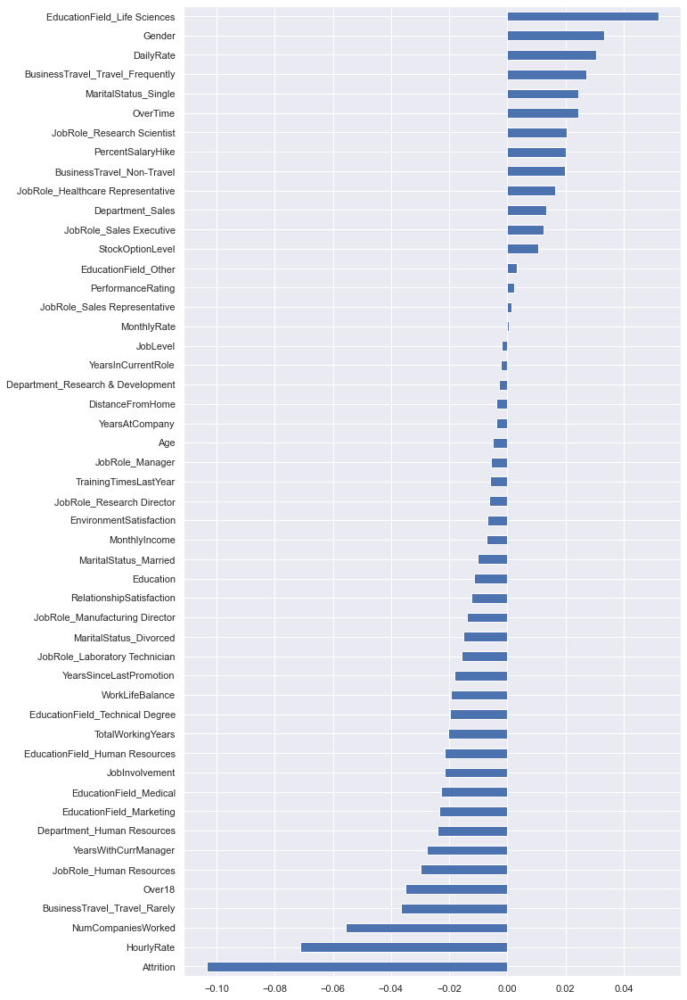

In [205]:
final.drop('JobSatisfaction', axis=1).corrwith(final.JobSatisfaction).sort_values().plot(kind= 'barh', figsize=(10,20))

According to the correlation plot, <br>
Job Satisfaction has the greatest correlation with attrition, followed by hourly rate, number of companies worked, education field life sciences and so on. <br>
- People who are more satisfied with their job are less likely to attire. 
- People with a lower hourly rate are more satisfied with their job. (*weird*)
- People with less number of companies worked are more satisfied with their job (*probably because they do not have much experience in other companies so they will not compare much*)
- People who studied about Life Sciences are more likely to be satisfied with their job.

Let us try plotting a decision tree to find the variable importance!<br>
<br>
**Note:** <br>
Monthly Income and Job Satisfaction are not correlated! Their correlation value is very very small!

In [206]:
final3= final.copy()

In [207]:
for i in range(len(final3)):
    if(final3.loc[i,"JobSatisfaction"]<3):
        final3.loc[i,"JobSatisfaction"]=0 #not satisfied
    else:
        final3.loc[i,"JobSatisfaction"]=1 #satisfied

In [208]:
final3.head()

,Age,DailyRate,DistanceFromHome,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,Gender,Over18,OverTime,Education,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,PerformanceRating,RelationshipSatisfaction,WorkLifeBalance,JobLevel,StockOptionLevel,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,41,1102,1,94,5993,19479,8,11,8,0,6,4,0,5,1,0,1,1,2,2,3,1,0,1,1,2,0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,49,279,8,61,5130,24907,1,23,10,3,10,7,1,7,0,1,1,0,1,3,2,0,1,4,3,2,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,37,1373,2,92,2090,2396,6,15,7,3,0,0,0,0,1,1,1,1,2,4,2,1,0,2,3,1,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,33,1392,3,56,2909,23159,1,11,8,3,8,7,3,0,0,0,1,1,4,4,3,1,0,3,3,1,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,27,591,2,40,3468,16632,9,12,6,3,2,2,2,2,0,1,1,0,1,1,3,0,0,4,3,1,1,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


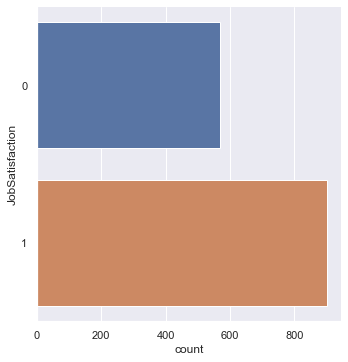

In [209]:
sb.catplot(y = 'JobSatisfaction', data = final3, kind = "count", height = 5)

In [210]:
no= final3[final3["JobSatisfaction"]==0]
yes= final3[final3["JobSatisfaction"]==1]
from sklearn.utils import resample

dataN_upsample= resample(no, n_samples= yes.shape[0])
data_upsample= pd.concat([yes, dataN_upsample])

data_upsample.shape

(1802, 51)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.616580310880829

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5121951219512195



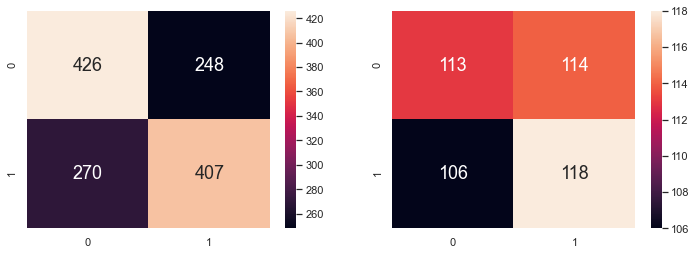

In [211]:
y = pd.DataFrame(data_upsample['JobSatisfaction'])
X = pd.DataFrame(data_upsample.drop(columns=['JobSatisfaction']))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state= 1)


dectree = DecisionTreeClassifier(max_depth = 3)  
dectree.fit(X_train, y_train)                   

y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [212]:
param_grid= {
    'n_estimators': np.arange(100, 250, 50),
    'max_depth': np.arange(2,8),
}

rforest = RandomForestClassifier()       

CV_rfr= GridSearchCV(estimator= rforest, param_grid= param_grid)
CV_rfr.fit(X_train, y_train.JobSatisfaction.ravel())

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_depth': array([2, 3, 4, 5, 6, 7]),
                         'n_estimators': array([100, 150, 200])})

In [213]:
CV_rfr.best_params_

{'max_depth': 7, 'n_estimators': 200}

In [214]:
rforest = RandomForestClassifier(n_estimators = 100, max_depth = 7)       
rforest.fit(X_train, y_train.JobSatisfaction.ravel()) 

RandomForestClassifier(max_depth=7)

Train Data
Accuracy  :	 0.9444855662472242

TPR Train :	 0.9453471196454948
TNR Train :	 0.9436201780415431

FPR Train :	 0.05637982195845697
FNR Train :	 0.05465288035450517


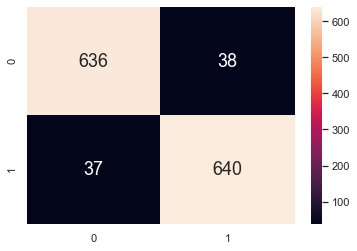

In [215]:
y_train_pred = rforest.predict(X_train)

print("Train Data")
print("Accuracy  :\t", rforest.score(X_train, y_train))
print()

cmTrain = confusion_matrix(y_train, y_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

In [216]:
importances = rforest.feature_importances_
std = np.std([tree.feature_importances_ for tree in rforest.estimators_],
             axis=0)

In [217]:
importance=pd.DataFrame()
importance['Predictors']=X.columns
importance['Importance']=std

In [218]:
importance

,Predictors,Importance
0,Age,0.030422
1,DailyRate,0.041508
2,DistanceFromHome,0.034329
3,HourlyRate,0.047672
4,MonthlyIncome,0.047783
5,MonthlyRate,0.036777
6,NumCompaniesWorked,0.025653
7,PercentSalaryHike,0.027308
8,TotalWorkingYears,0.035984
9,TrainingTimesLastYear,0.024662


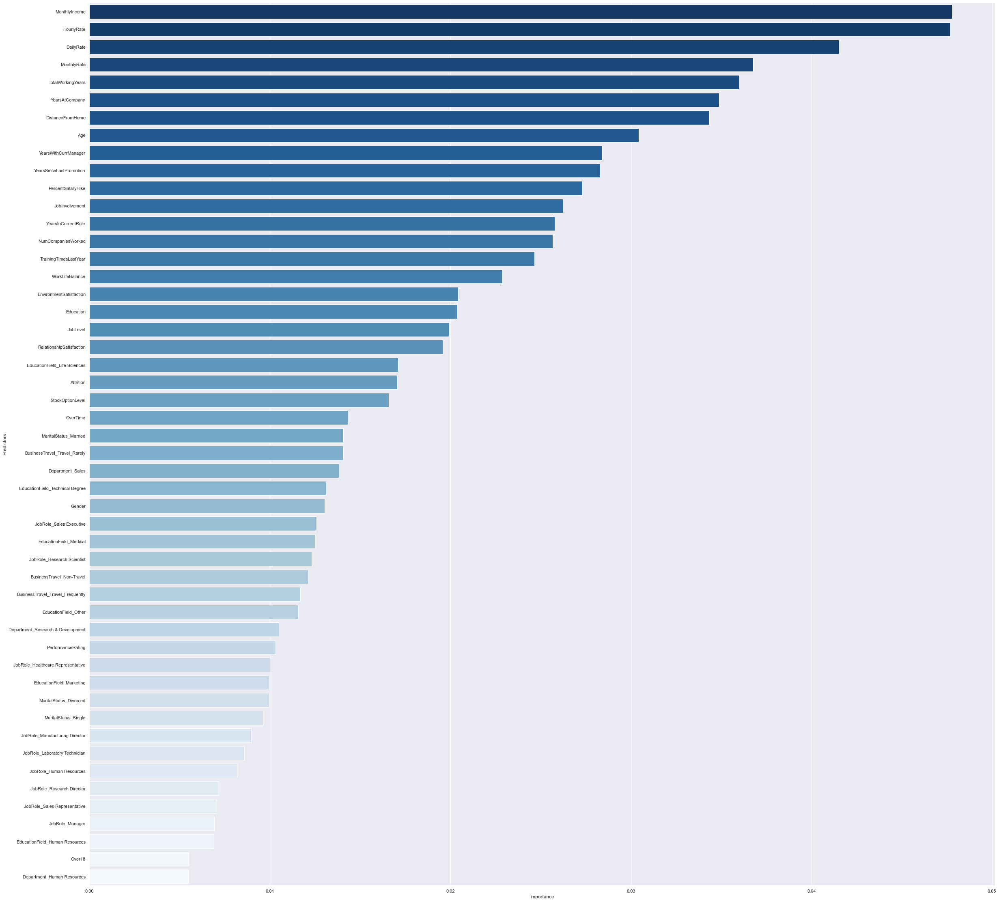

In [219]:
importance.sort_values(by=['Importance'], ascending=False,inplace=True)
f = plt.figure(figsize=(40, 40))
sb.barplot(x=importance["Importance"], y=importance["Predictors"], palette= "Blues_r")

#### Top Factors Affecting Job Satisfaction
1. Monthly Rate
2. Daily Rate
3. Monthly Income
4. Hourly Rate

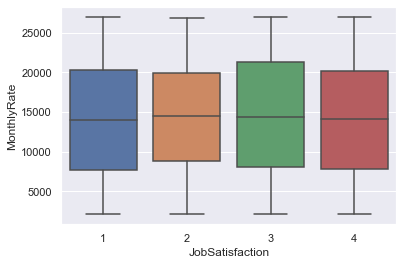

In [220]:
sb.boxplot(x = "JobSatisfaction", y = "MonthlyRate", data = employee)

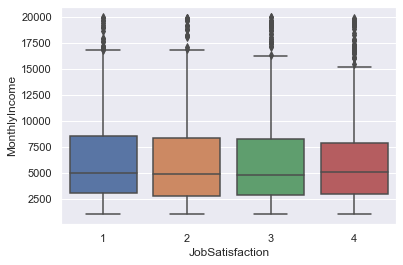

In [221]:
sb.boxplot(x = "JobSatisfaction", y = "MonthlyIncome", data = employee)

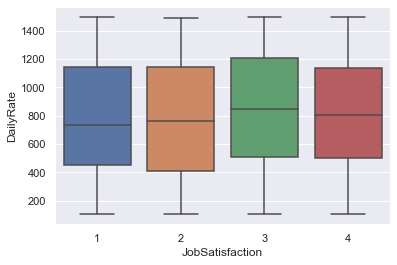

In [222]:
sb.boxplot(x = "JobSatisfaction", y = "DailyRate", data = employee)

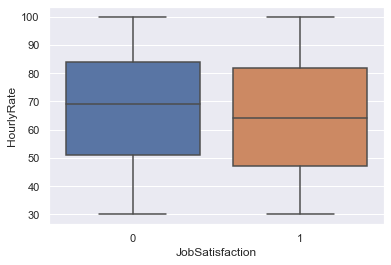

In [223]:
sb.boxplot(x = "JobSatisfaction", y = "HourlyRate", data = final3)

## 3. Performance Rating <br>
Pratham:

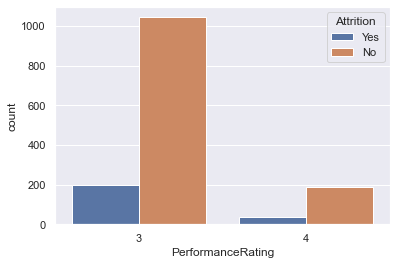

In [224]:
sb.countplot(data=employee,x='PerformanceRating',hue='Attrition')

3    1244
4     226
Name: PerformanceRating, dtype: int64


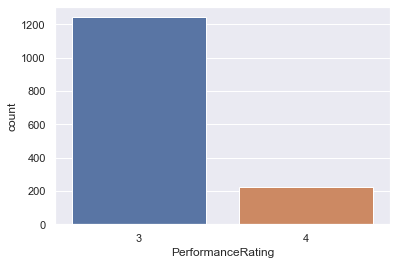

In [225]:
print(employee['PerformanceRating'].value_counts())
sb.countplot(data=employee,x='PerformanceRating')

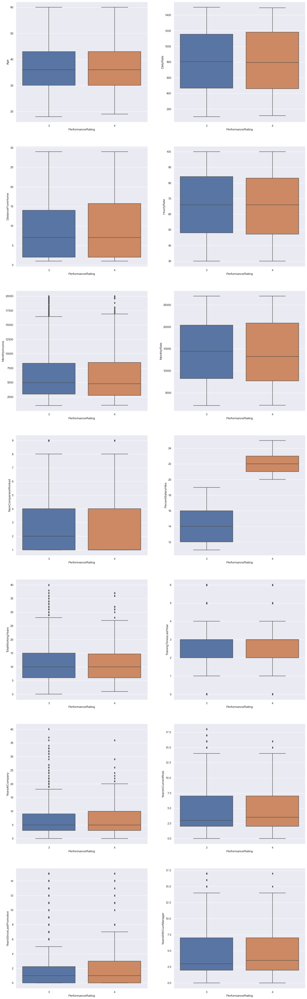

In [226]:
f,axes=plt.subplots(7,2,figsize=(20,70))
count=0

for i in num_data:
    sb.boxplot(data=employee,y=i,x="PerformanceRating",ax=axes[count//2][count%2])
    count+=1

From the above graphs, we see that employees with **PerformanceRating= 3** are getting **lower PercentSalaryHike** while employees with **PerformanceRating= 4** are getting **significantly higher PercentSalaryHike.**<br> 
For better visualization, we plotted a strip plot:

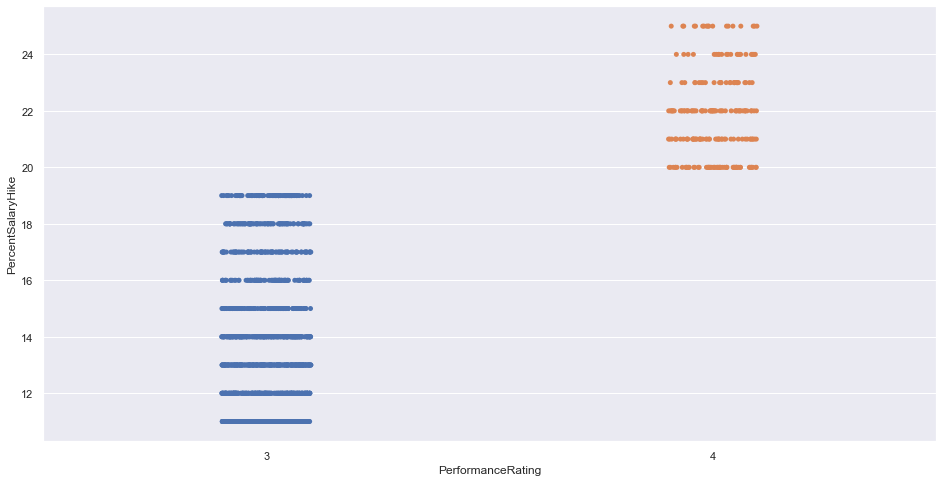

In [227]:
f,axes=plt.subplots(1,1,figsize=(16,8))
sb.stripplot(data=employee, y="PercentSalaryHike", x="PerformanceRating")

In [470]:
y = pd.DataFrame(final['PerformanceRating'])
X = pd.DataFrame(final.drop(columns=['PerformanceRating']))

##### For the dataset used to predict the performance rating, we decided to exclude the PercentSalaryHike because we will use the predicted performance rating of the employee to predict his/her respective expecting Salary Hike for the following working term.

In [471]:
y['PerformanceRating'].value_counts()

0    1244
1     226
Name: PerformanceRating, dtype: int64

### Plotting a decision tree to predict Performance Rating

In [472]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

In [473]:
dectree = DecisionTreeClassifier(max_depth = 4)      
dectree.fit(X.drop(columns="PercentSalaryHike"), y.PerformanceRating.astype('int').ravel())

DecisionTreeClassifier(max_depth=4)

Accuracy  :	 0.8537414965986394
TPR Train :	 0.05309734513274336
TNR Train :	 0.9991961414790996

FPR Train :	 0.0008038585209003215
FNR Train :	 0.9469026548672567


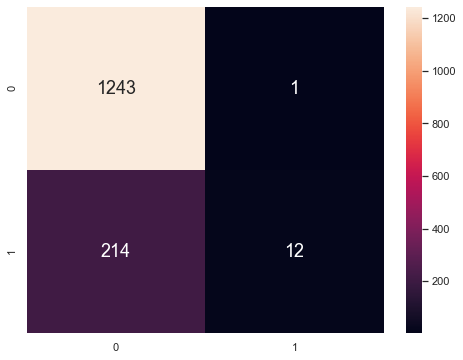

In [474]:
print("Accuracy  :\t", dectree.score(X.drop(columns="PercentSalaryHike"), y))
y_pred=dectree.predict(X.drop(columns="PercentSalaryHike"))
cmTrain = confusion_matrix(y, y_pred)

tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

f,axes=plt.subplots(1,1,figsize=(8,6))
sb.heatmap(confusion_matrix(y.astype('int'), y_pred.astype('int')), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
    

Again, the matrix is imbalanced, it is leaning to the left. Thus we must do balancing below:
#### Balancing

In [475]:
three= final[final["PerformanceRating"]==0] 
four= final[final["PerformanceRating"]==1] #four is smaller than three
from sklearn.utils import resample

dataN_upsample= resample(four, n_samples= three.shape[0])
data_upsample= pd.concat([three, dataN_upsample])

data_upsample.shape

(2488, 51)

In [363]:
data_upsample["PerformanceRating"].value_counts()

1    926
0    926
Name: PerformanceRating, dtype: int64

In [331]:
param_grid = { 
    'max_depth' : np.arange(2,11,1),  
}
dectree=DecisionTreeClassifier()

In [332]:
from sklearn.model_selection import GridSearchCV
CV_rfr= GridSearchCV(estimator= dectree, param_grid= param_grid)
CV_rfr.fit(X_train, y_train.PerformanceRating.ravel())

GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10])})

In [333]:
CV_rfr.best_params_

{'max_depth': 2}

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9046087888531619

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7958199356913184



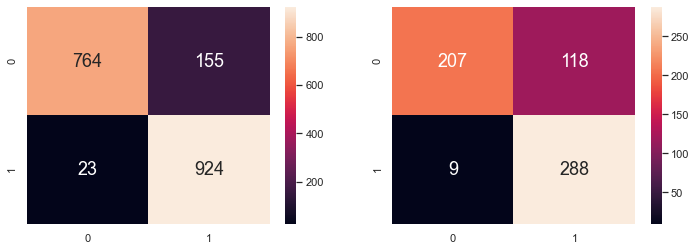

In [484]:
y = pd.DataFrame(data_upsample['PerformanceRating'])
X = pd.DataFrame(data_upsample.drop(columns=['PerformanceRating', 'PercentSalaryHike']))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25,random_state=10)

dectree = DecisionTreeClassifier(max_depth = 10)  
dectree.fit(X_train, y_train)                   

y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

Now we have balanced the data, below is the decision tree after balancing:

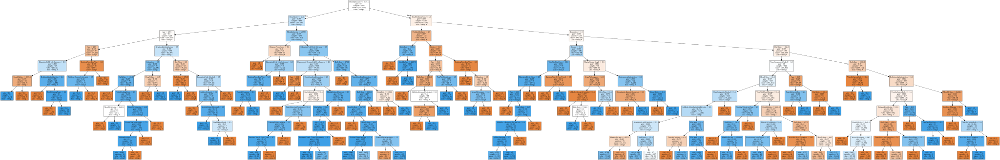

In [481]:
treedot= export_graphviz(dectree,
          feature_names= X_train.columns,
          out_file=None,
          filled=True,
          class_names=["rating 4","rating 3"])

import graphviz                  
graphviz.Source(treedot)                 

## Random Forest

In [488]:
y = pd.DataFrame(data_upsample['PerformanceRating'])
X = pd.DataFrame(data_upsample.drop(columns=['PerformanceRating']))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25,random_state=10)

In [354]:
param_grid = { 
    'n_estimators':np.arange(100,250,50),
    'max_depth' : np.arange(2,10,1),  
}
rforest=RandomForestClassifier()

In [369]:
CV_rfr= GridSearchCV(estimator= rforest, param_grid= param_grid)
CV_rfr.fit(X_train, y_train.PerformanceRating.ravel())

GridSearchCV(estimator=RandomForestClassifier(max_depth=10, n_estimators=150),
             param_grid={'max_depth': array([2, 3, 4, 5, 6, 7, 8, 9]),
                         'n_estimators': array([100, 150, 200])})

In [370]:
CV_rfr.best_params_

{'max_depth': 9, 'n_estimators': 150}

In [489]:
rforest = RandomForestClassifier(n_estimators = 150, max_depth = 9,random_state=20)       
rforest.fit(X_train.drop(columns="PercentSalaryHike"), y_train.PerformanceRating.ravel()) 

RandomForestClassifier(max_depth=9, n_estimators=150, random_state=20)

Train Data
Accuracy  :	 0.9946409431939979

Test Data
Accuracy  :	 0.9598070739549839

TPR Train :	 0.9936642027455121
TNR Train :	 0.9956474428726877

FPR Train :	 0.004352557127312296
FNR Train :	 0.006335797254487857


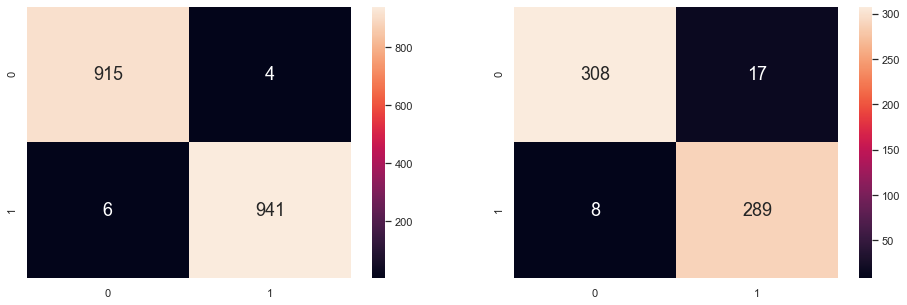

In [490]:
y_train_pred = rforest.predict(X_train.drop(columns="PercentSalaryHike"))
y_test_pred = rforest.predict(X_test.drop(columns="PercentSalaryHike"))


print("Train Data")
print("Accuracy  :\t", rforest.score(X_train.drop(columns="PercentSalaryHike"), y_train))
print()
print("Test Data")
print("Accuracy  :\t", rforest.score(X_test.drop(columns="PercentSalaryHike"), y_test))
print()

cmTrain = confusion_matrix(y_train, y_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

f, axes = plt.subplots(1, 2, figsize=(16, 5))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

##### ROC-AUC Curve

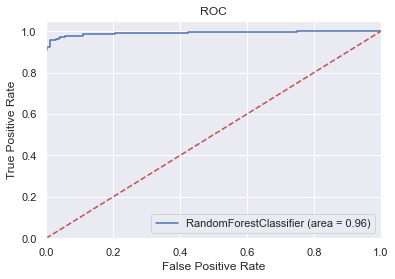

In [491]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
rforest_roc_auc = roc_auc_score(y_test, y_test_pred)
fpr, tpr, thresholds = roc_curve(y_test, rforest.predict_proba(X_test.drop(columns="PercentSalaryHike"))[:,1])
plt.figure()
plt.plot(fpr, tpr, label='RandomForestClassifier (area = %0.2f)' % rforest_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

##### Storing the predicted train and test values of Performance rating for further use for prediction of PercentSalaryHike

In [492]:
X_train["PerformanceRating_pred"]=y_train_pred
X_test["PerformanceRating_pred"]=y_test_pred
salaryhikedata=pd.concat([X_train,X_test])
salaryhikedata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2488 entries, 797 to 1414
Data columns (total 51 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                2488 non-null   int64  
 1   DailyRate                          2488 non-null   int64  
 2   DistanceFromHome                   2488 non-null   int64  
 3   HourlyRate                         2488 non-null   int64  
 4   MonthlyIncome                      2488 non-null   int64  
 5   MonthlyRate                        2488 non-null   int64  
 6   NumCompaniesWorked                 2488 non-null   int64  
 7   PercentSalaryHike                  2488 non-null   int64  
 8   TotalWorkingYears                  2488 non-null   int64  
 9   TrainingTimesLastYear              2488 non-null   int64  
 10  YearsAtCompany                     2488 non-null   int64  
 11  YearsInCurrentRole                 2488 non-null   int

<ipython-input-492-bbec7d957278>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-492-bbec7d957278>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### Classification Report

In [374]:
from sklearn.metrics import classification_report
target_names = ['PerformanceRating=3', 'PerformanceRating=4']
print(classification_report(y_test,y_test_pred,target_names=target_names))

                     precision    recall  f1-score   support

PerformanceRating=3       0.86      0.98      0.92       318
PerformanceRating=4       0.00      0.00      0.00        50

           accuracy                           0.85       368
          macro avg       0.43      0.49      0.46       368
       weighted avg       0.74      0.85      0.79       368



In [249]:
importances = rforest.feature_importances_
std = np.std([tree.feature_importances_ for tree in rforest.estimators_],
             axis=0)

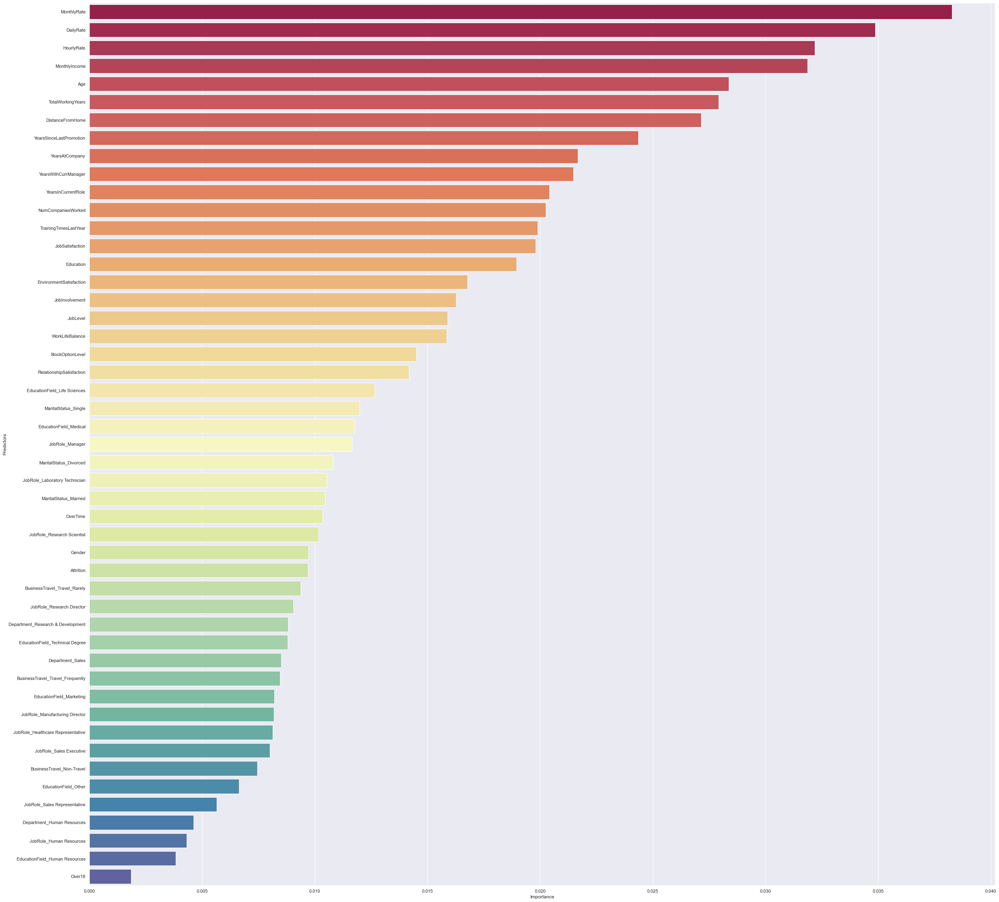

In [250]:
importance=pd.DataFrame()
importance['Predictors']=X.drop(columns="PercentSalaryHike").columns
importance['Importance']=std
importance.sort_values(by=['Importance'], ascending=False,inplace=True)
importance.reset_index(inplace=True)
f = plt.figure(figsize=(40, 40))
sb.barplot(x=importance["Importance"], y=importance["Predictors"], palette= "Spectral")

#### Variable Importance  (AFTER BALANCING)
*not arranged in any order as the random train test split may change the order for these top variables*
1. Monthly Rate  
2. Daily Rate
3. Hourly Rate
4. Monthly Income

These are the top factors affecting attrition. <br>
Let us now observe the correlation!

## Logistic Regression for Predicting Performance Rating

Logistic regression is a **classification technique**. It belongs to the group of **linear classifiers and is somewhat similar to polynomial and linear regression**. Logistic regression is fast and relatively uncomplicated, and it’s convenient for you to interpret the results. Although it’s **essentially a method for binary classification, it can also be applied to multiclass problems.** BUt over here we are using it for binary classification.

In [493]:
y = pd.DataFrame(data_upsample['PerformanceRating'])
X = pd.DataFrame(data_upsample.drop(columns=['PerformanceRating','PercentSalaryHike']))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25,random_state=10)

              precision    recall  f1-score   support

           0       0.62      0.56      0.58       325
           1       0.56      0.62      0.59       297

    accuracy                           0.59       622
   macro avg       0.59      0.59      0.59       622
weighted avg       0.59      0.59      0.59       622



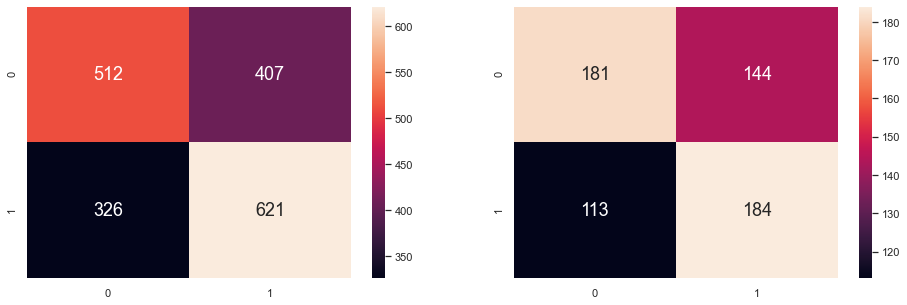

In [497]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

lr = LogisticRegression(solver='liblinear', penalty='l1')
lr.fit(X_train, y_train.PerformanceRating.ravel())

y_test_pred = lr.predict(X_test)
y_train_pred = lr.predict(X_train)

print(classification_report(y_test, y_test_pred))
cmTrain = confusion_matrix(y_train, y_train_pred)
f, axes = plt.subplots(1, 2, figsize=(16, 5))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

In [498]:
print("Accuracy Score test data",lr.score(X_test,y_test))
print()

Accuracy Score test data 0.5868167202572347



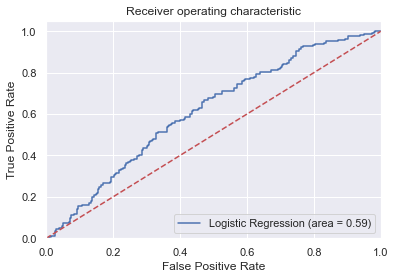

In [499]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, lr.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, lr.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

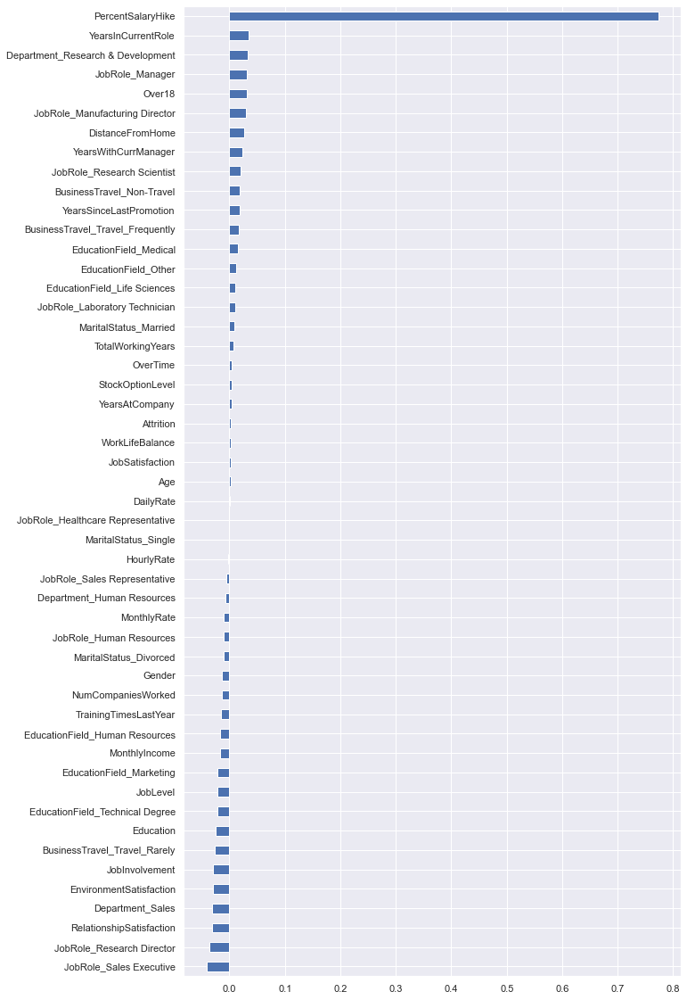

In [255]:
final.drop('PerformanceRating', axis=1).corrwith(final.PerformanceRating).sort_values().plot(kind= 'barh', figsize=(10,20))

#### 1. Monthly Rate

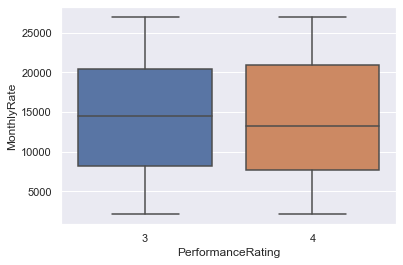

In [256]:
sb.boxplot(x = "PerformanceRating", y = "MonthlyRate", data = employee)

From the correlation plot, there is a very small negative correlation. <br>
Those who have a performance rating of 3 are earning a higher monthly rate. 

#### 2. Daily Rate

From the correlation plot, there is a very very small positive correlation.

#### 3. Hourly Rate

From the correlation plot, there is a very very small negative correlation.

#### 4. Monthly Income

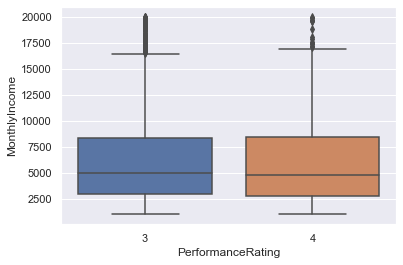

In [257]:
sb.boxplot(x = "PerformanceRating", y = "MonthlyIncome", data = employee)

From the correlation plot, there is a very small negative correlation. <br>
Those who have a performance rating of 3 are earning a higher monthly income.

#### 5. Percent Salary Hike

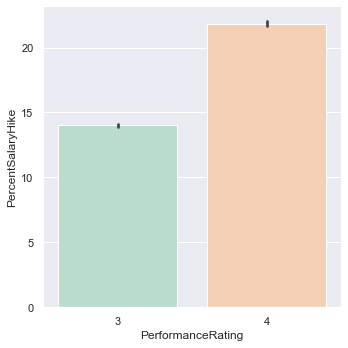

In [258]:
sb.catplot(x="PerformanceRating", y="PercentSalaryHike",
                data=employee, kind="bar", palette= "Pastel2")

Here, the correlation is very high compared to any other variables. In fact, putting this variable in the random forest causes overfitting. <br>
The higher the performance rating, the higher the percent salary hike. <br>
Let us use the variables that are said to be important for performance rating to find a correlation with percent salary hike.

## 4. Percent Salary Hike
##### Predict  Expected Percent Salary hike of employees for next working term.
We will use the predicted values of PerformanceRating to predict the values of PercentSalaryHike of respective employees.

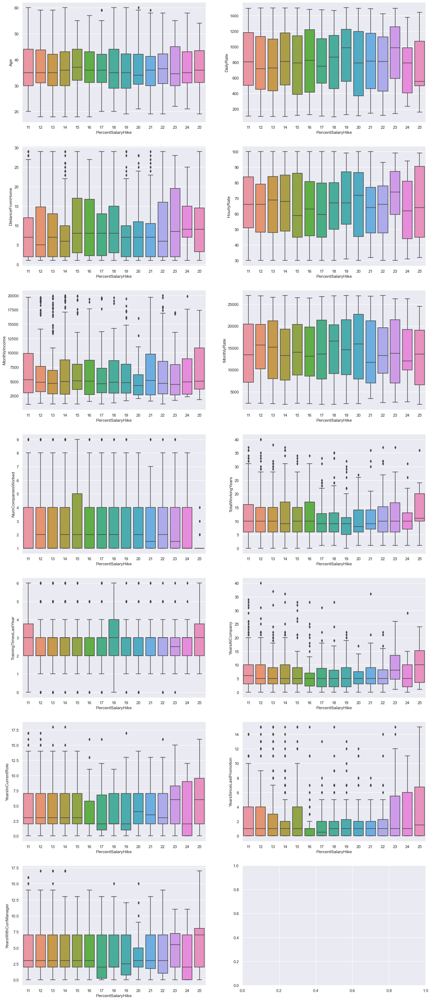

In [259]:
f,axes=plt.subplots(7,2,figsize=(20,50))
count=0
for i in num_data:
    if(i=="PercentSalaryHike"):
        continue
    sb.boxplot(data=employee,x="PercentSalaryHike",y=i,ax=axes[count//2][count%2])
    count+=1

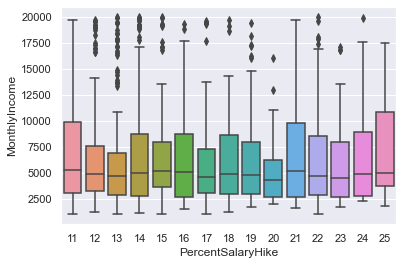

In [260]:
sb.boxplot(x = "PercentSalaryHike", y = "MonthlyIncome", data = employee)

In [261]:
final2=final.copy()

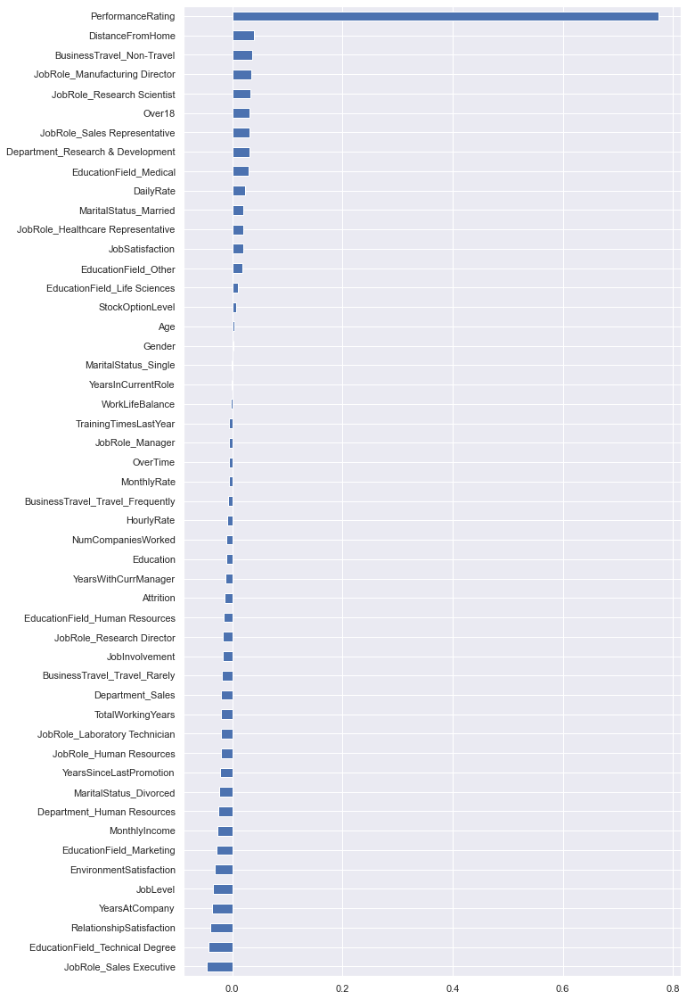

In [262]:
final.drop('PercentSalaryHike', axis=1).corrwith(final.PercentSalaryHike).sort_values().plot(kind= 'barh', figsize=(10,20))

### Models for Predicting Percent Salary Hike
We know that PercentSalaryHike and PerformanceRating are perfectly correlated in terms of classification, whereas linearly has a correlation of 0.77.<br>
So, we can treat PercentSalaryHike in two ways :<br><br>
**As a continuous variable and perform a regression model.<br>**
* **RandomForestRegressor<br>**

**As a multi-class variable and perform a multi-classification model.**<br>
* **RandomForestClassifier**<br>


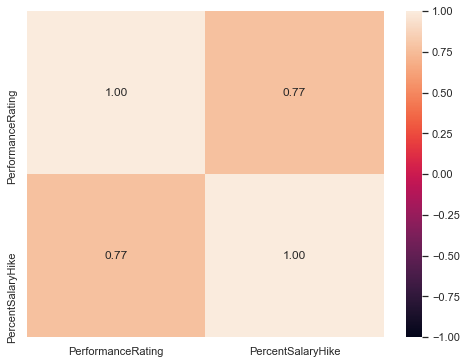

In [263]:
x=pd.DataFrame(employee[["PerformanceRating","PercentSalaryHike"]])
f,axes= plt.subplots(1,1, figsize=(8,6))

sb.heatmap(x.corr(), vmin=-1, vmax=1, annot=True, fmt='.2f')

In [500]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestRegressor

In [501]:
X=salaryhikedata.drop(columns="PercentSalaryHike")
y=salaryhikedata["PercentSalaryHike"]

### Feature Scaling

This is a very important step in machine learning. It helps the algorithm quickly learn a better solution to the problem.

We will use a standard scaler provided in the sklearn library. It subtracts the mean value of the observation and then divides it by the unit variance of the observation.
We will perform the following steps:

1. Define a scaler by calling the function from sklearn library.
2. Transform train feature dataset (X_train) and fit the scaler on train feature dataset.
3. Use the scaler to transform test feature dataset (X_test).

In [502]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25,random_state=20)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### Decision Tree

In [503]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import export_graphviz

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)
dectree = DecisionTreeClassifier(max_depth = 10)  
dectree.fit(X_train, y_train)                   

DecisionTreeClassifier(max_depth=10)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6168274383708467

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.4742765273311897



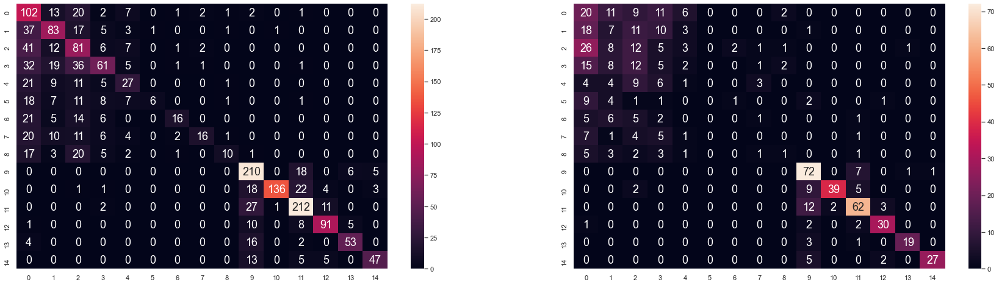

In [504]:
# Predict Legendary values corresponding to Total
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(30, 8))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

### GridSearchCV for the Random Forest

In [269]:
from sklearn.ensemble import RandomForestClassifier

param_grid= {
    'n_estimators': np.arange(100, 500, 50),
    'max_depth': np.arange(2,11,1),
}

rforest = RandomForestClassifier()       

from sklearn.model_selection import GridSearchCV
CV_rfr= GridSearchCV(estimator= rforest, param_grid= param_grid)
CV_rfr.fit(X_train, y_train)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_depth': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                         'n_estimators': array([100, 150, 200, 250, 300, 350, 400, 450])})

In [270]:
CV_rfr.best_params_

{'max_depth': 9, 'n_estimators': 150}

In [505]:
classifier = RandomForestClassifier(n_estimators = 300,max_depth=10)
classifier.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, n_estimators=300)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9866023579849946

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.572347266881029



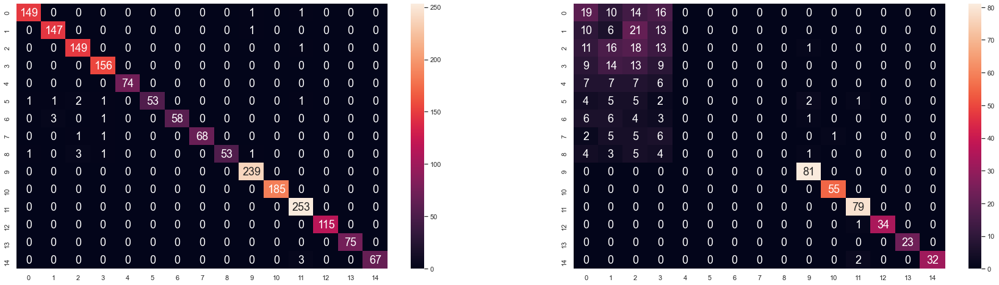

In [506]:
# Import confusion_matrix from Scikit-Learn
from sklearn.metrics import confusion_matrix

# Predict the Response corresponding to Predictors
y_train_pred = classifier.predict(X_train)
y_test_pred = classifier.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", classifier.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", classifier.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y_train, y_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

# Plot the two-way Confusion Matrix
f, axes = plt.subplots(1, 2, figsize=(30, 8))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

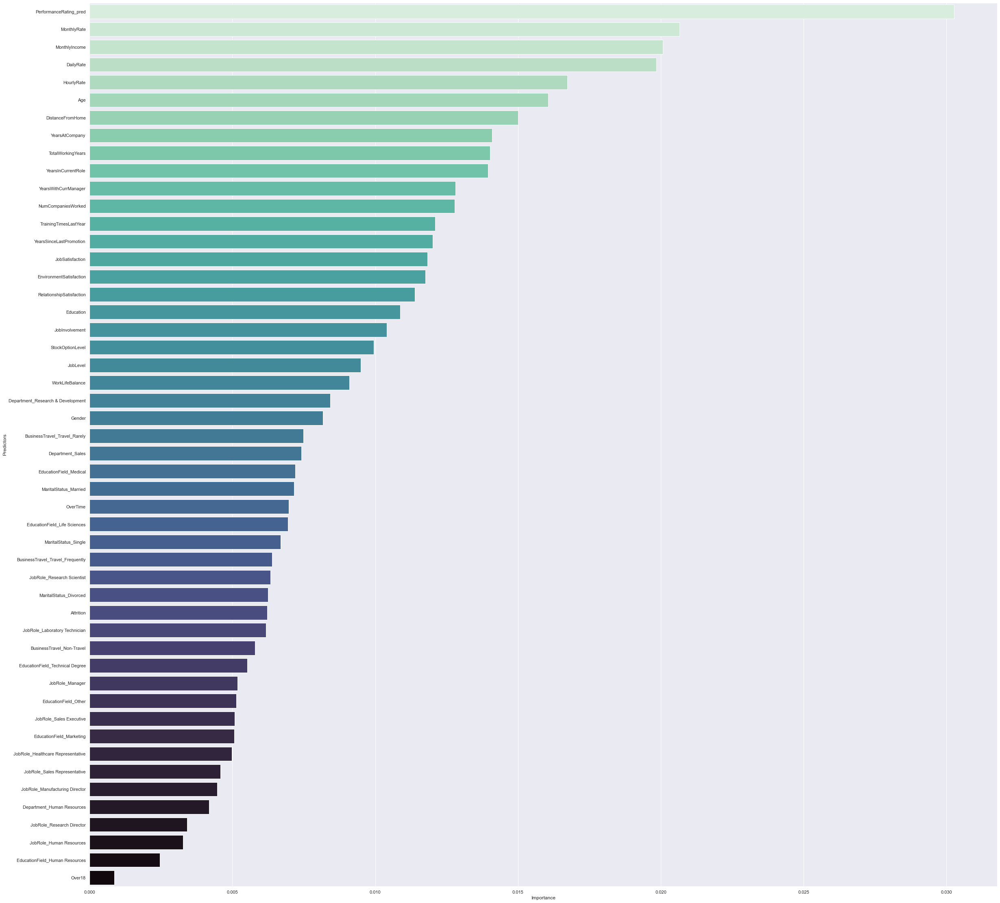

In [273]:
importances = classifier.feature_importances_
std = np.std([tree.feature_importances_ for tree in classifier.estimators_],
             axis=0)
importance=pd.DataFrame()
importance['Predictors']=X.columns
importance['Importance']=std
importance.sort_values(by=['Importance'], ascending=False,inplace=True)
f = plt.figure(figsize=(40, 40))
sb.barplot(x=importance["Importance"], y=importance["Predictors"], palette= "mako_r")
importance.reset_index(inplace=True)

In [274]:
variables=[]
for i in range(5):
    variables.append(importance.loc[i,"Predictors"])
print(variables)

['PerformanceRating_pred', 'MonthlyRate', 'MonthlyIncome', 'DailyRate', 'HourlyRate']


#### Variable Importance
*not arranged in any order as the random train test split may change the order for these top variables*
1. 'PerformanceRating_pred'
2. 'HourlyRate'
3. 'MonthlyRate' 
4. 'DailyRate'
5. 'MonthlyIncome'

These are the top factors affecting PerfectSalaryHike<br>
Let us now observe the correlation!

### Using RandomForestRegressor
**As a continuous variable and perform a regression model.<br>**


In [275]:
from sklearn.ensemble import RandomForestRegressor

#### GridSearchCv

In [276]:
from sklearn.ensemble import RandomForestClassifier

param_grid= {
    'n_estimators': np.arange(100, 200, 50),
    'max_depth': np.arange(2,11,1),
}

regressor = RandomForestRegressor()

from sklearn.model_selection import GridSearchCV
CV_rfr= GridSearchCV(estimator= regressor, param_grid= param_grid)
CV_rfr.fit(X_train, y_train)

GridSearchCV(estimator=RandomForestRegressor(),
             param_grid={'max_depth': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                         'n_estimators': array([100, 150])})

In [277]:
CV_rfr.best_params_

{'max_depth': 10, 'n_estimators': 100}

In [511]:
X=salaryhikedata.drop(columns="PercentSalaryHike").values
y=salaryhikedata["PercentSalaryHike"].values

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.05,random_state = 20)

# Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Fitting Random Forest Regression to the dataset
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators = 100,max_depth=10,random_state = 10)
regressor.fit(X_train, y_train)
y_train_pred = regressor.predict(X_train)  
y_test_pred=regressor.predict(X_test) 
from sklearn import metrics

print('Accuracy Train:', regressor.score(X_train,y_train))
print()
print('Accuracy Test:', regressor.score(X_test,y_test))
print()

Accuracy Train: 0.915821830487806

Accuracy Test: 0.8287265416759769



### Comparing the Test Accuracy for Classifier and Regressor
* Regressor : Accuracy Test: **0.8413323361449623**
* Classifier : Classification Accuracy Test: **0.5755627009646302**
<br><br>
So the accuracy of the Regressor is higher than the Classifier hence we finally decided to go with the RondomForestRegressor Model to predict PercentsalaryHike by treating it as a continous variable

## Clustering For PerformanceRating
We will try two clustering model mentioned below to seperate the datapoints into different performance rating.
* K-Means
* GaussianMixture

We are using the top-five numerical variables retrieved from the ramdom forest featrue_importances method to perform the clustering models

In [279]:
variables=[]
for i in range(5):
    variables.append(importance.loc[i,"Predictors"])
print(variables)

['PerformanceRating_pred', 'MonthlyRate', 'MonthlyIncome', 'DailyRate', 'HourlyRate']


In [280]:
variables.append('PerformanceRating')
variables.remove('PerformanceRating_pred')

In [281]:
variables

['MonthlyRate',
 'MonthlyIncome',
 'DailyRate',
 'HourlyRate',
 'PerformanceRating']

In [282]:
x=pd.DataFrame(employee[variables])

In [283]:
x.shape

(1470, 5)

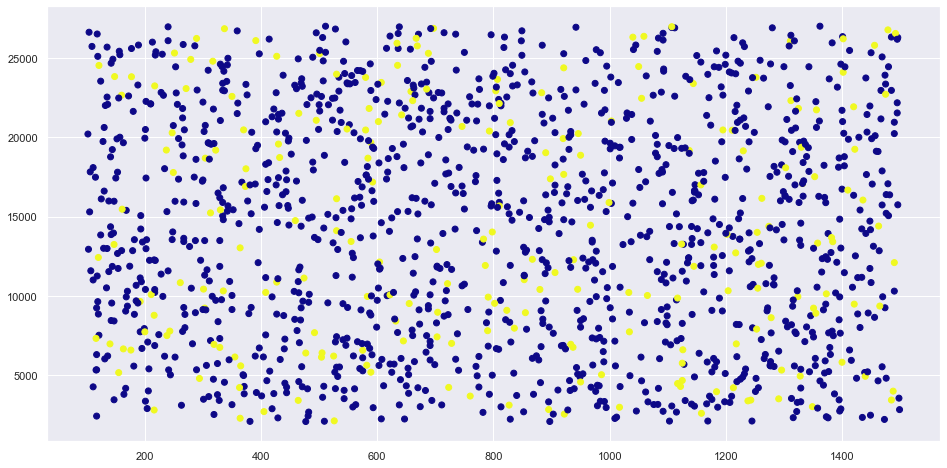

In [284]:
f,axes = plt.subplots(1,1,figsize=(16,8))
plt.scatter(data= x, x="DailyRate", y="MonthlyRate", c= 'PerformanceRating', cmap="plasma")

##### Original clusters we are supposed to fin which means very ranomizzed and lot scattered and almost seems impossible to differentiate into different clusters. For this clustering we are using 2-D representation of a multi-dimensional clustering which seems  inappropriate to but we are just trying to see if clustering is possible. 

<Figure size 1800x1080 with 0 Axes>

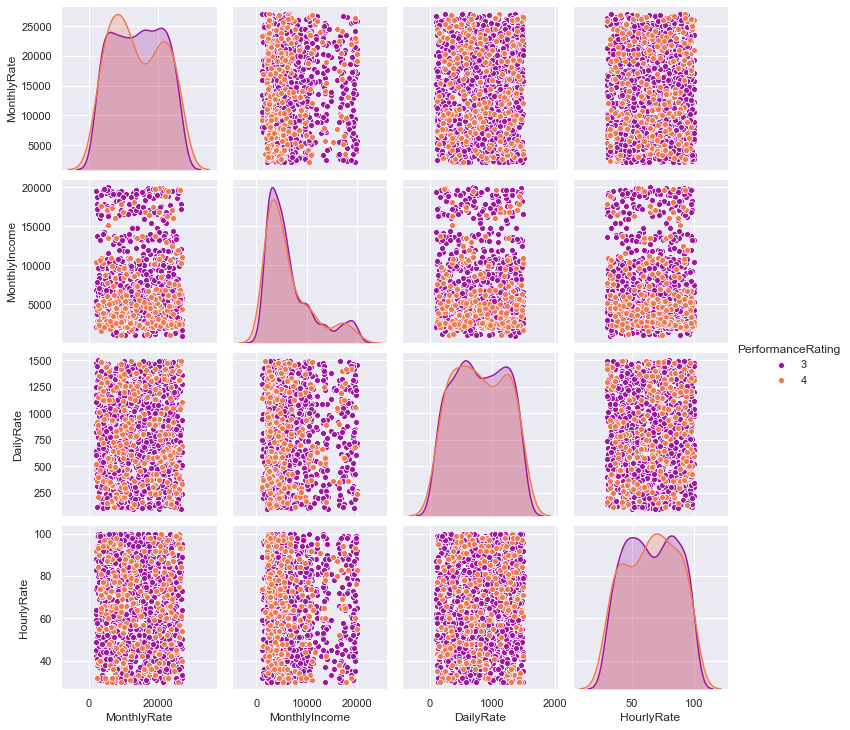

In [285]:
f=plt.figure(figsize=(25,15))
sb.pairplot(x, hue="PerformanceRating", palette= 'plasma')

In [286]:
x=x.drop(columns=["PerformanceRating"])

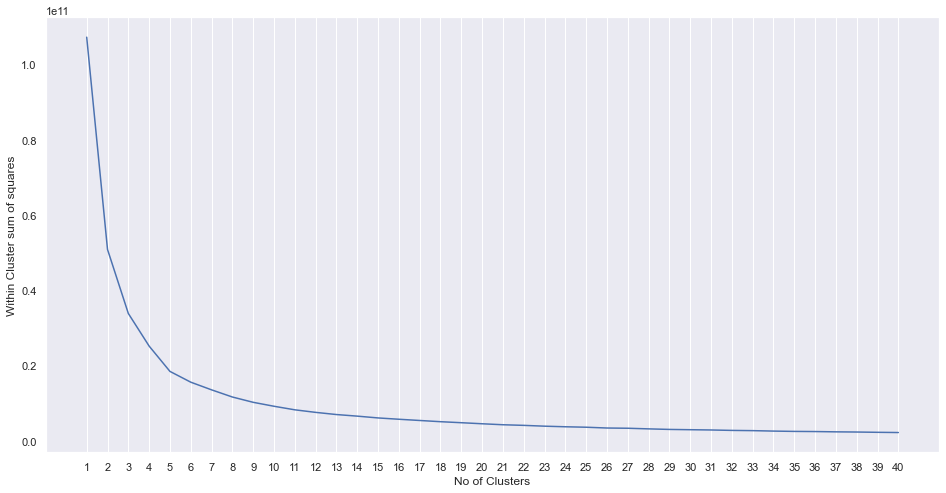

In [287]:
from sklearn.cluster import KMeans
within_ss=[]
min_clust=1
max_clust=40


for i in range(min_clust,max_clust+1):
    kmeans=KMeans(n_clusters=i)
    kmeans.fit(x)
    within_ss.append(kmeans.inertia_)

f=plt.figure(figsize=(16,8))
plt.plot( range(min_clust,max_clust+1) , within_ss)
plt.xlabel('No of Clusters')
plt.ylabel('Within Cluster sum of squares')
plt.xticks(np.arange(min_clust,max_clust+1,1.0))
plt.grid(which='major',axis='y')
plt.show()

Within sum of squares: 	 50865588272.341446
Cluster 0:	20602.54	6736.23	794.75	65.37	
Cluster 1:	8225.74	6277.13	809.97	66.4	



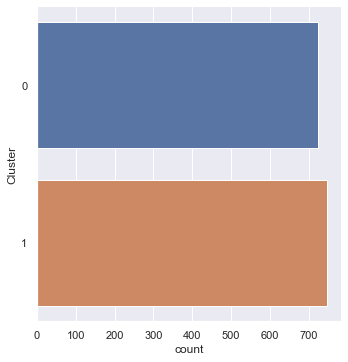

In [288]:
num_clust=2
kmeans=KMeans(n_clusters=num_clust)
kmeans.fit(x)

print("Within sum of squares: \t",kmeans.inertia_)

labels=kmeans.predict(x)
for i, center in enumerate(kmeans.cluster_centers_):
    print("Cluster", i, end=":\t")
    for coord in center:
        print(round(coord, 2), end="\t")
    print()
print()
x_labeled=x.copy()
x_labeled["Cluster"]=pd.Categorical(labels)

sb.catplot(data=x_labeled,y="Cluster",kind='count')

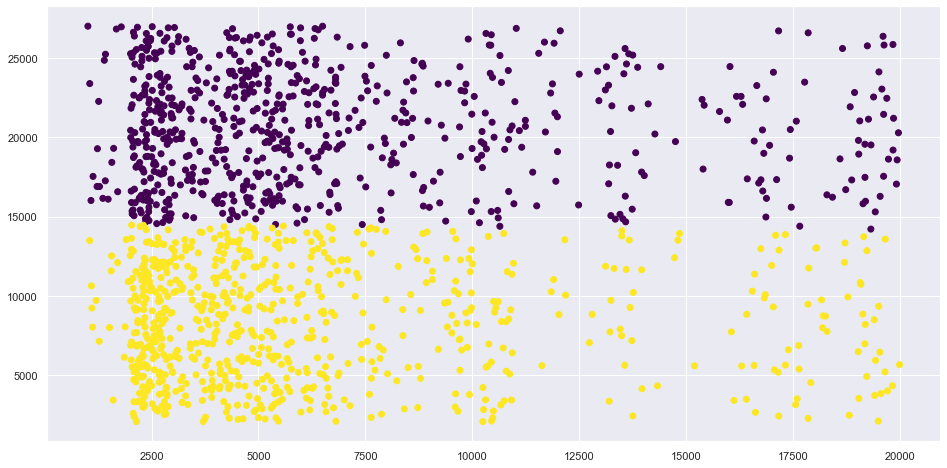

In [289]:
f=plt.figure(figsize=(16,8))
plt.scatter(data=x_labeled,x="MonthlyIncome",y="MonthlyRate",c="Cluster",cmap="viridis")

0    736
1    734
Name: Cluster, dtype: int64


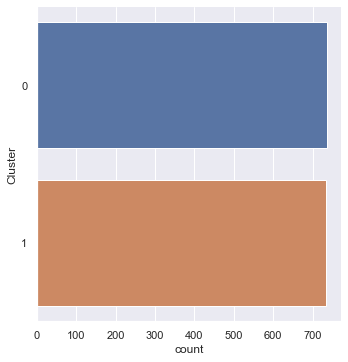

In [290]:
from sklearn.mixture import GaussianMixture


kmeans=GaussianMixture(n_components=2)
kmeans.fit(x)


labels=kmeans.predict(x)

x_labeled=x.copy()
x_labeled["Cluster"]=pd.Categorical(labels)
print(x_labeled["Cluster"].value_counts())
sb.catplot(data=x_labeled,y="Cluster",kind='count')

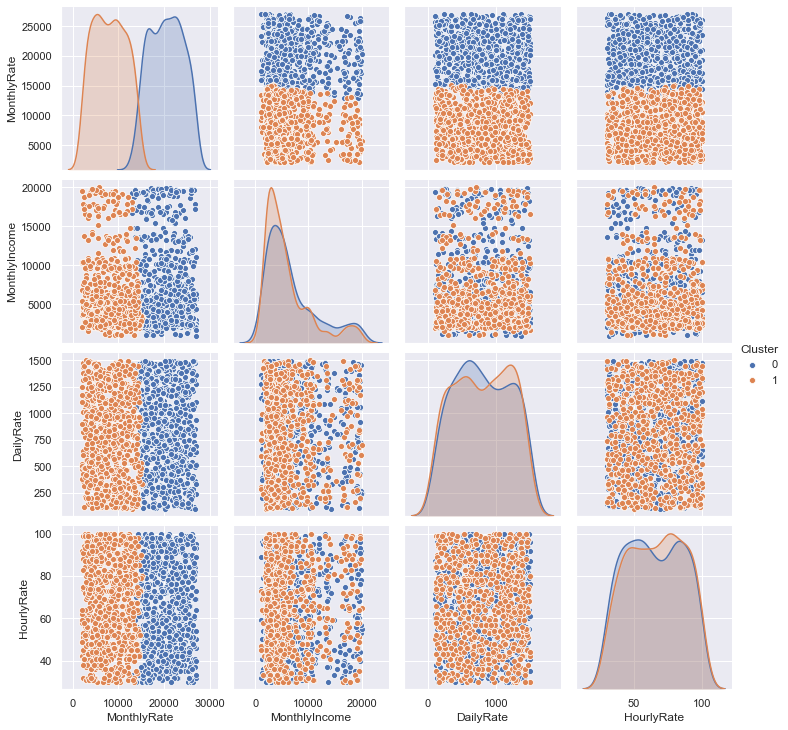

In [291]:
sb.pairplot(x_labeled,hue="Cluster")

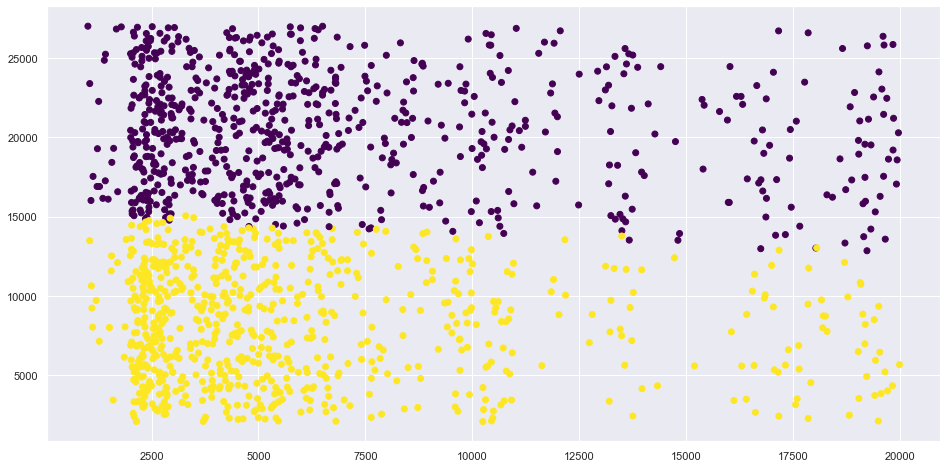

In [292]:
f=plt.figure(figsize=(16,8))
plt.scatter(data=x_labeled,x="MonthlyIncome",y="MonthlyRate",c="Cluster",cmap="viridis")

##### We tried to do clustering, however we have found that it is not possible for our dataset. <br>
All the employees have different characteristics in their records. And clustering models are giving us artificial clusters which are not making any sense and when we compare it with the clusters that we want ( thats somehow makes clusters which differentiate datapoints into employees with different Performancerating) but the accuracy of the clustering is very low.

## RFECV for Monthly Income

**The motive of studying the monthly income of an employee is that the company has better understanding about the employee’s monthly and also help detect employees who have unexpected monthly income when compared to their peers and if their peers are receiving significantly less or more income which could lead to bias and Workplace conflicts which will eventually Harm the firms productivity.**


In [293]:
cleanup_nums = {"JobRole":    {"Manager": 9, "Research Director": 8,
                                "Healthcare Representative": 7, "Manufacturing Director":6 , "Sales Executive": 5, "Human Resources": 4,
                                  "Research Scientist": 3, "Laboratory Technician": 2, "Sales Representative":1 },
                "Department":  {"Research & Development": 1, "Sales": 2, "Human Resources": 3}}

In [294]:
categorical = categorical.replace(cleanup_nums)
categorical.head()

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime,Education,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,PerformanceRating,RelationshipSatisfaction,WorkLifeBalance,JobLevel,StockOptionLevel
0,1,Travel_Rarely,2,Life Sciences,0,5,Single,1,1,2,2,3,4,0,1,1,2,0
1,0,Travel_Frequently,1,Life Sciences,1,3,Married,1,0,1,3,2,2,1,4,3,2,1
2,1,Travel_Rarely,1,Other,1,2,Single,1,1,2,4,2,3,0,2,3,1,0
3,0,Travel_Frequently,1,Life Sciences,0,3,Married,1,1,4,4,3,3,0,3,3,1,0
4,0,Travel_Rarely,1,Medical,1,2,Married,1,0,1,1,3,2,0,4,3,1,1


In [295]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder()

# OneHotEncoding of categorical predictors (not the response)
encoded_data = categorical[['BusinessTravel', 'EducationField', 'MaritalStatus']]
ohe.fit(encoded_data)
encoded_data_ohe = pd.DataFrame(ohe.transform(encoded_data).toarray(), 
                                  columns=ohe.get_feature_names(encoded_data.columns))

# Check the encoded variables
encoded_data_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BusinessTravel_Non-Travel         1470 non-null   float64
 1   BusinessTravel_Travel_Frequently  1470 non-null   float64
 2   BusinessTravel_Travel_Rarely      1470 non-null   float64
 3   EducationField_Human Resources    1470 non-null   float64
 4   EducationField_Life Sciences      1470 non-null   float64
 5   EducationField_Marketing          1470 non-null   float64
 6   EducationField_Medical            1470 non-null   float64
 7   EducationField_Other              1470 non-null   float64
 8   EducationField_Technical Degree   1470 non-null   float64
 9   MaritalStatus_Divorced            1470 non-null   float64
 10  MaritalStatus_Married             1470 non-null   float64
 11  MaritalStatus_Single              1470 non-null   float64
dtypes: flo

In [296]:
rest=categorical.copy()
rest.drop(columns=['BusinessTravel', 'EducationField', 'MaritalStatus'],inplace=True)
rest.head()
rfedata=pd.concat([num_data,rest,encoded_data_ohe],axis=1)
rfedata.shape
for var in ["Attrition", "Gender", "Over18", "OverTime"]:
    rfedata[var]= rfedata[var].astype('int')

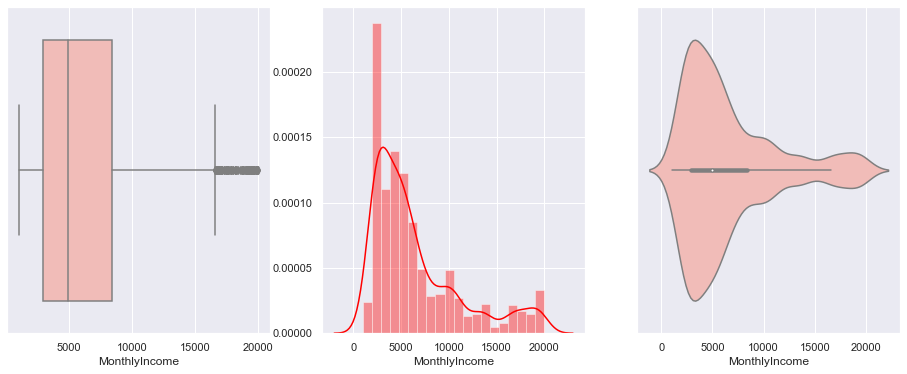

In [297]:
f,axes=plt.subplots(1,3,figsize=(16,6))
sb.boxplot(employee["MonthlyIncome"],ax=axes[0],palette='Pastel1')
sb.distplot(employee["MonthlyIncome"],ax=axes[1],color='red')
sb.violinplot(employee["MonthlyIncome"],ax=axes[2],palette='Pastel1')

(array([0, 1, 2, 3, 4]), <a list of 5 Text major ticklabel objects>)

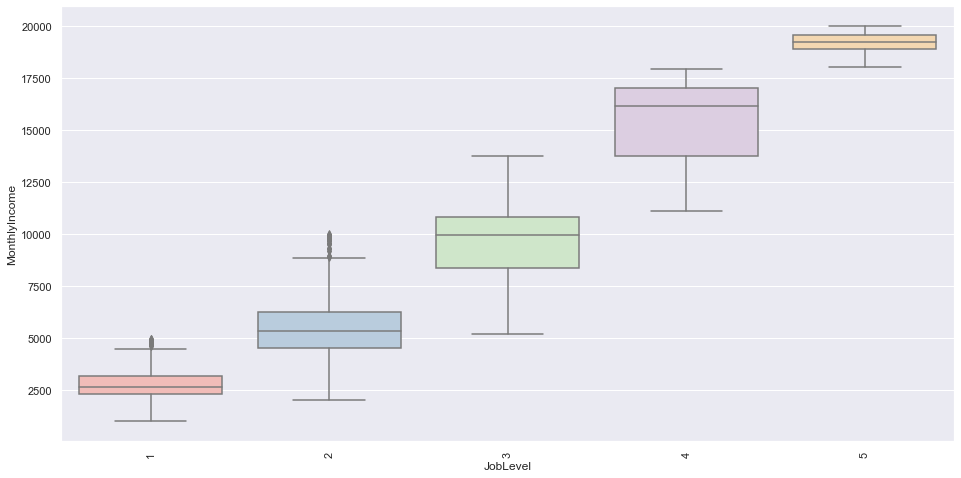

In [298]:
f=plt.figure(figsize=(16,8))
sb.boxplot(x="JobLevel", y="MonthlyIncome",data=employee,palette='Pastel1')
plt.xticks(rotation='vertical')

Job Leevel is defined as the classification of authority and/or salary levels of positions in an organization.<br>
Ex. senior executives, executive, middle management, advisors, associates.<br>
**Different job levels have different monthly income.**


(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 <a list of 9 Text major ticklabel objects>)

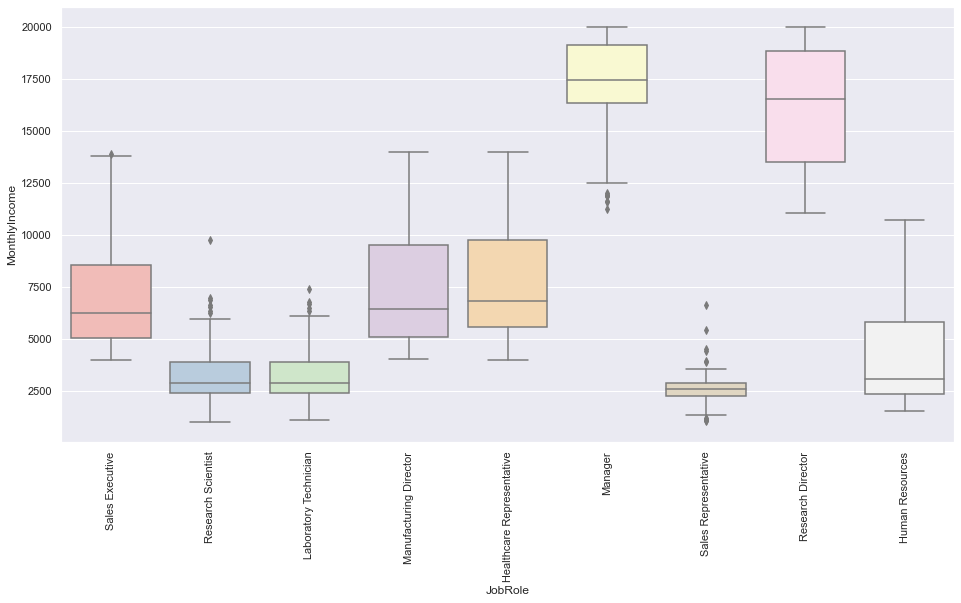

In [299]:
f=plt.figure(figsize=(16,8))
sb.boxplot(x="JobRole", y="MonthlyIncome",data=employee,palette='Pastel1')
plt.xticks(rotation='vertical')

<Figure size 1152x576 with 0 Axes>

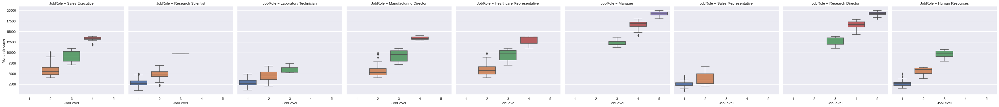

In [300]:
f=plt.figure(figsize=(16,8))
sb.catplot(x="JobLevel", y="MonthlyIncome", col="JobRole",
                data=employee, kind="box");

### Removing Correlated Features
Removing correlated features is done because we don’t want highly correlated features in our dataset as they provide the same information — and one is enough.

##### So these are the variables we need to drop from the dataset before perfroming RFE 

In [301]:
correlated_features = set()
correlation_matrix = rfedata.drop('MonthlyIncome', axis=1).corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.75:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)
correlated_features

{'BusinessTravel_Travel_Rarely',
 'JobLevel',
 'PerformanceRating',
 'YearsInCurrentRole',
 'YearsWithCurrManager'}

In [302]:
rfe_final=rfedata.drop(columns=['JobLevel','PerformanceRating'
                                ,'YearsInCurrentRole','YearsWithCurrManager'])

In [303]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV 
from sklearn.model_selection import KFold
X = rfe_final.drop('MonthlyIncome', axis=1)
target = rfe_final['MonthlyIncome']

rfc = LinearRegression()
rfecv = RFECV(estimator=rfc, step=1, cv=KFold(10))
rfecv.fit(X, target)

RFECV(cv=KFold(n_splits=10, random_state=None, shuffle=False),
      estimator=LinearRegression())

In [304]:
print('Optimal number of features: {}'.format(rfecv.n_features_))


Optimal number of features: 8


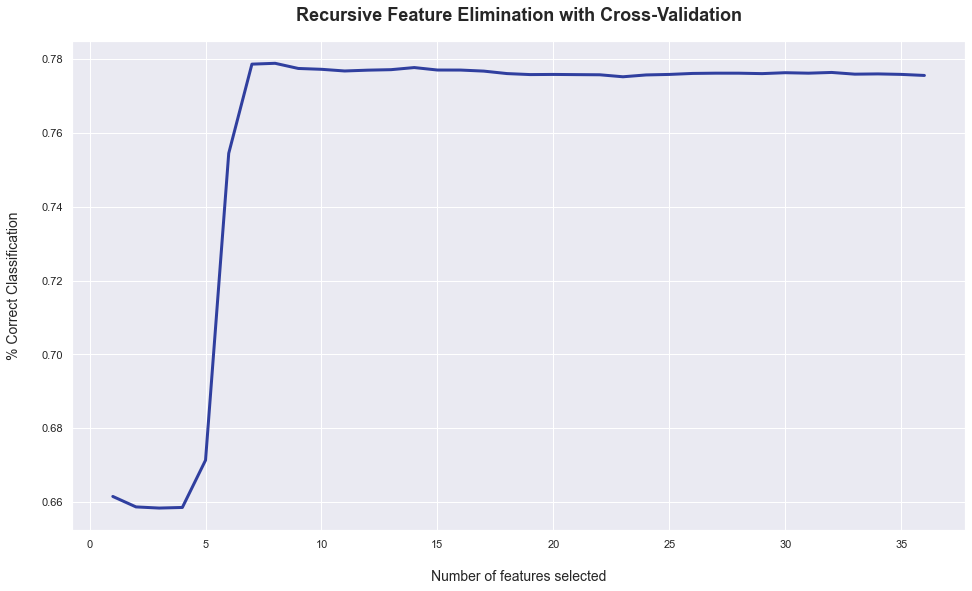

In [305]:
plt.figure(figsize=(16, 9))
plt.title('Recursive Feature Elimination with Cross-Validation', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Number of features selected', fontsize=14, labelpad=20)
plt.ylabel('% Correct Classification', fontsize=14, labelpad=20)
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_, color='#303F9F', linewidth=3)

plt.show()

In [306]:
print(np.where(rfecv.support_ == False)[0])
X.drop(X.columns[np.where(rfecv.support_ == False)[0]], axis=1, inplace=True)

[ 0  1  2  3  4  5  6  8  9 10 13 16 17 18 19 20 21 22 23 25 26 28 30 31
 32 33 34 35]


In [307]:
X.head()

,TotalWorkingYears,Attrition,Department,JobRole,Over18,BusinessTravel_Non-Travel,EducationField_Human Resources,EducationField_Marketing
0,8,1,2,5,1,0.0,0.0,0.0
1,10,0,1,3,1,0.0,0.0,0.0
2,7,1,1,2,1,0.0,0.0,0.0
3,8,0,1,3,1,0.0,0.0,0.0
4,6,0,1,2,1,0.0,0.0,0.0


### Linear Regression model to support our claims for predicting <br>
Shivangi and Pratham

In [308]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [309]:
def performLinearRegression(X_train, y_train, X_test, y_test):
    '''
        Function to perform Linear Regression with X_Train, y_train,
        and test out the performance of the model on X_Test, y_test.
    '''    
    linreg = LinearRegression()         # create the linear regression object
    linreg.fit(X_train, y_train)        # train the linear regression model

    # Predict Response corresponding to Predictors
    y_train_pred = linreg.predict(X_train)
    y_test_pred = linreg.predict(X_test)

    # Plot the Predictions vs the True values
    f, axes = plt.subplots(1, 2, figsize=(24, 12))
    axes[0].scatter(y_train, y_train_pred, color = "blue")
    axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
    axes[0].set_xlabel("True values of the Response Variable (Train)")
    axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
    axes[1].scatter(y_test, y_test_pred, color = "green")
    axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
    axes[1].set_xlabel("True values of the Response Variable (Test)")
    axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
    plt.show()

    # Check the Goodness of Fit (on Train Data)
    print("Goodness of Fit of Model \tTrain Dataset")
    print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
    print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
    print()

    # Check the Goodness of Fit (on Test Data)
    print("Goodness of Fit of Model \tTest Dataset")
    print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
    print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
    print()

MonthlyIncome vs NumericVariables


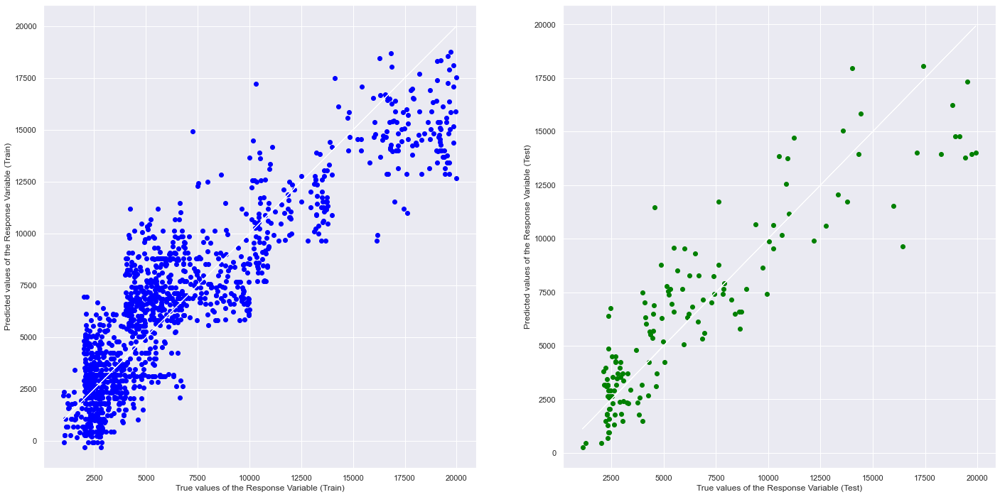

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.7888169548429161
Mean Squared Error (MSE) 	: 4662442.5763378125

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.7981091847707786
Mean Squared Error (MSE) 	: 4600230.749331536



In [310]:
 # Print the Model Description
y=pd.DataFrame(rfedata['MonthlyIncome'])
X=X
numeric=pd.DataFrame(rfedata[['TotalWorkingYears',
 'YearsAtCompany',
 'YearsWithCurrManager',
 'JobRole',
 'JobLevel','Attrition']])    
print("MonthlyIncome vs NumericVariables")



# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1)

# Perform Linear Regression with Train-Test
performLinearRegression(X_train, y_train, X_test, y_test)